In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
import xgboost as xgb
from catboost import CatBoostRegressor, Pool

In [2]:
import statsmodels.api as sm
from sklearn.metrics import confusion_matrix, classification_report, RocCurveDisplay, roc_curve, roc_auc_score, auc
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


# Import CSV files and convert to dataframes

In [3]:
test_values_df = pd.read_csv('test_values.csv')

In [4]:
test_values_df.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other
0,300051,17,596,11307,3,20,7,6,t,r,...,0,0,0,0,0,0,0,0,0,0
1,99355,6,141,11987,2,25,13,5,t,r,...,1,0,0,0,0,0,0,0,0,0
2,890251,22,19,10044,2,5,4,5,t,r,...,0,0,0,0,0,0,0,0,0,0
3,745817,26,39,633,1,0,19,3,t,r,...,0,0,1,0,0,0,0,0,0,0
4,421793,17,289,7970,3,15,8,7,t,r,...,0,0,0,0,0,0,0,0,0,0


In [5]:
train_labels_df = pd.read_csv('train_labels.csv')
train_labels_df.head()

,building_id,damage_grade
0,802906,3
1,28830,2
2,94947,3
3,590882,2
4,201944,3


In [6]:
train_values_df = pd.read_csv('train_values.csv')
train_values_df.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other
0,802906,6,487,12198,2,30,6,5,t,r,...,0,0,0,0,0,0,0,0,0,0
1,28830,8,900,2812,2,10,8,7,o,r,...,0,0,0,0,0,0,0,0,0,0
2,94947,21,363,8973,2,10,5,5,t,r,...,0,0,0,0,0,0,0,0,0,0
3,590882,22,418,10694,2,10,6,5,t,r,...,0,0,0,0,0,0,0,0,0,0
4,201944,11,131,1488,3,30,8,9,t,r,...,0,0,0,0,0,0,0,0,0,0


# Check shape, types, missing values, duplicates, etc.

In [7]:
train_values_df.shape

(260601, 39)

In [8]:
train_values_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 260601 entries, 0 to 260600
Data columns (total 39 columns):
 #   Column                                  Non-Null Count   Dtype 
---  ------                                  --------------   ----- 
 0   building_id                             260601 non-null  int64 
 1   geo_level_1_id                          260601 non-null  int64 
 2   geo_level_2_id                          260601 non-null  int64 
 3   geo_level_3_id                          260601 non-null  int64 
 4   count_floors_pre_eq                     260601 non-null  int64 
 5   age                                     260601 non-null  int64 
 6   area_percentage                         260601 non-null  int64 
 7   height_percentage                       260601 non-null  int64 
 8   land_surface_condition                  260601 non-null  object
 9   foundation_type                         260601 non-null  object
 10  roof_type                               260601 non-null 

In [9]:
object_cols = [col for col, dt in train_values_df.dtypes.items() if dt == object]
object_cols

['land_surface_condition',
 'foundation_type',
 'roof_type',
 'ground_floor_type',
 'other_floor_type',
 'position',
 'plan_configuration',
 'legal_ownership_status']

In [10]:
numeric_cols = train_values_df.select_dtypes(include=['number'])
numeric_cols

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,...,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other
0,802906,6,487,12198,2,30,6,5,1,1,...,0,0,0,0,0,0,0,0,0,0
1,28830,8,900,2812,2,10,8,7,0,1,...,0,0,0,0,0,0,0,0,0,0
2,94947,21,363,8973,2,10,5,5,0,1,...,0,0,0,0,0,0,0,0,0,0
3,590882,22,418,10694,2,10,6,5,0,1,...,0,0,0,0,0,0,0,0,0,0
4,201944,11,131,1488,3,30,8,9,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
260596,688636,25,1335,1621,1,55,6,3,0,1,...,0,0,0,0,0,0,0,0,0,0
260597,669485,17,715,2060,2,0,6,5,0,1,...,0,0,0,0,0,0,0,0,0,0
260598,602512,17,51,8163,3,55,6,7,0,1,...,0,0,0,0,0,0,0,0,0,0
260599,151409,26,39,1851,2,10,14,6,0,0,...,0,0,0,0,0,0,0,0,0,0


In [11]:
print(numeric_cols.corr())

                                        building_id  geo_level_1_id  \
building_id                                1.000000       -0.002850   
geo_level_1_id                            -0.002850        1.000000   
geo_level_2_id                             0.000347       -0.061405   
geo_level_3_id                            -0.000393        0.002718   
count_floors_pre_eq                       -0.000654       -0.089364   
age                                       -0.001476       -0.003908   
area_percentage                           -0.002070        0.071158   
height_percentage                          0.000096       -0.063474   
has_superstructure_adobe_mud              -0.000307       -0.018245   
has_superstructure_mud_mortar_stone        0.002423       -0.152038   
has_superstructure_stone_flag              0.001443        0.007677   
has_superstructure_cement_mortar_stone    -0.000827        0.023656   
has_superstructure_mud_mortar_brick       -0.003768       -0.028854   
has_su

In [12]:
print(train_values_df.isnull().sum().sum())

0


In [13]:
print("Duplicate Rows:", train_values_df.duplicated().sum())

Duplicate Rows: 0


In [14]:
print(train_values_df.columns.duplicated(keep=False))

[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False]


In [15]:
training_df = pd.merge(train_values_df, train_labels_df, on='building_id')
training_df.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,802906,6,487,12198,2,30,6,5,t,r,...,0,0,0,0,0,0,0,0,0,3
1,28830,8,900,2812,2,10,8,7,o,r,...,0,0,0,0,0,0,0,0,0,2
2,94947,21,363,8973,2,10,5,5,t,r,...,0,0,0,0,0,0,0,0,0,3
3,590882,22,418,10694,2,10,6,5,t,r,...,0,0,0,0,0,0,0,0,0,2
4,201944,11,131,1488,3,30,8,9,t,r,...,0,0,0,0,0,0,0,0,0,3


In [16]:
numeric_cols = training_df.select_dtypes(include= ['int', 'Int64']).columns.to_list()
numeric_cols

['building_id',
 'geo_level_1_id',
 'geo_level_2_id',
 'geo_level_3_id',
 'count_floors_pre_eq',
 'age',
 'area_percentage',
 'height_percentage',
 'has_superstructure_adobe_mud',
 'has_superstructure_mud_mortar_stone',
 'has_superstructure_stone_flag',
 'has_superstructure_cement_mortar_stone',
 'has_superstructure_mud_mortar_brick',
 'has_superstructure_cement_mortar_brick',
 'has_superstructure_timber',
 'has_superstructure_bamboo',
 'has_superstructure_rc_non_engineered',
 'has_superstructure_rc_engineered',
 'has_superstructure_other',
 'count_families',
 'has_secondary_use',
 'has_secondary_use_agriculture',
 'has_secondary_use_hotel',
 'has_secondary_use_rental',
 'has_secondary_use_institution',
 'has_secondary_use_school',
 'has_secondary_use_industry',
 'has_secondary_use_health_post',
 'has_secondary_use_gov_office',
 'has_secondary_use_use_police',
 'has_secondary_use_other',
 'damage_grade']

In [17]:
categoric_col = training_df.select_dtypes(include= ['object']).columns.to_list()
categoric_col

['land_surface_condition',
 'foundation_type',
 'roof_type',
 'ground_floor_type',
 'other_floor_type',
 'position',
 'plan_configuration',
 'legal_ownership_status']

<Axes: xlabel='damage_grade'>

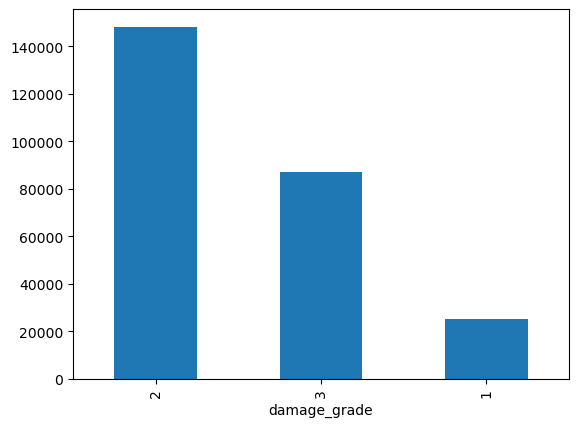

In [18]:
damage_grade = training_df['damage_grade']
counts = damage_grade.value_counts()
counts.plot.bar()

# geo_level_1 is largest regions, geo_level_2 is middle size region, geo_level_3 small sub-regions

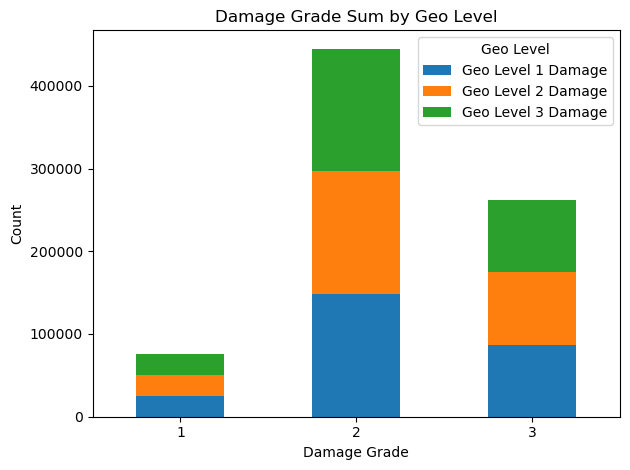

In [19]:
geo_level_1_dg = training_df.groupby(['geo_level_1_id', 'damage_grade']).size().unstack()
geo_level_2_dg = training_df.groupby(['geo_level_2_id', 'damage_grade']).size().unstack()
geo_level_3_dg = training_df.groupby(['geo_level_3_id', 'damage_grade']).size().unstack()

all_geo_levels_dg = pd.DataFrame({
    'Geo Level 1 Damage': geo_level_1_dg.sum(),
    'Geo Level 2 Damage': geo_level_2_dg.sum(),
    'Geo Level 3 Damage': geo_level_3_dg.sum()
})

ax = all_geo_levels_dg.plot(kind='bar', stacked=True)
    
plt.title('Damage Grade Sum by Geo Level')
plt.xlabel('Damage Grade')
plt.ylabel('Count')
plt.legend(title='Geo Level')
plt.xticks(rotation=0)
plt.tight_layout()

plt.show()

In [20]:
X = training_df.drop(columns=['damage_grade'])
y = training_df['damage_grade']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42, stratify=y)

In [21]:
numeric_cols = X_train.select_dtypes(include=['int', 'int64']).columns.to_list()
categoric_col = X_train.select_dtypes(include=['object']).columns.to_list()

In [22]:
damage_grades_categories = [[1, 2, 3]]
y_train_reshaped = y_train.values.reshape(-1,1)
target_encoder = OrdinalEncoder(categories=damage_grades_categories)

In [23]:
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categoric_col)
    ])

rf_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(n_estimators=100, random_state=42))
])

y_train_encoded = target_encoder.fit_transform(y_train_reshaped).ravel()
rf_pipeline.fit(X_train, y_train_encoded)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['building_id',
                                                   'geo_level_1_id',
                                                   'geo_level_2_id',
                                                   'geo_level_3_id',
                                                   'count_floors_pre_eq', 'age',
                                                   'area_percentage',
                                                   'height_percentage',
                                                   'has_superstructure_adobe_mud',
                                                   'has_superstructure_mud_mortar_stone',
                                                   'has_superstructure_stone_flag',
                                                   'has_superstructure_cement_mo...
                                                   'has_secondary_use_health_post',
                                                   'has_secondary_use_gov_office',
                                                   'has_secondary_use_use_police', ...]),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['land_surface_condition',
                                                   'foundation_type',
                                                   'roof_type',
                                                   'ground_floor_type',
                                                   'other_floor_type',
                                                   'position',
                                                   'plan_configuration',
                                                   'legal_ownership_status'])])),
                ('classifier', RandomForestClassifier(random_state=42))])

In [24]:
rf_y_train_pred = rf_pipeline.predict(X_train)
rf_y_test_encoded_pred = rf_pipeline.predict(X_test)
rf_train_accuracy = accuracy_score(y_train_encoded, rf_y_train_pred)
rf_test_accuracy = accuracy_score(y_test, rf_y_test_encoded_pred)
print(f"RF Training Accuracy: {rf_train_accuracy:.4f}")
print(f"RF Test Accuracy: {rf_test_accuracy:.4f}")

RF Training Accuracy: 1.0000
RF Test Accuracy: 0.1195


# Numerical and Categorical Feature Analysis

Running feature analysis in the following section. We'll be looking at:
1. Distributions
2. Correlations with damage level (numeric features)
3. Examining relationships between damage level and categories
4. Looking for categories with strong predictive power
5. 

In [25]:
numeric_cols = X_train.select_dtypes(include=['int', 'int64']).columns.to_list()
numeric_cols

['building_id',
 'geo_level_1_id',
 'geo_level_2_id',
 'geo_level_3_id',
 'count_floors_pre_eq',
 'age',
 'area_percentage',
 'height_percentage',
 'has_superstructure_adobe_mud',
 'has_superstructure_mud_mortar_stone',
 'has_superstructure_stone_flag',
 'has_superstructure_cement_mortar_stone',
 'has_superstructure_mud_mortar_brick',
 'has_superstructure_cement_mortar_brick',
 'has_superstructure_timber',
 'has_superstructure_bamboo',
 'has_superstructure_rc_non_engineered',
 'has_superstructure_rc_engineered',
 'has_superstructure_other',
 'count_families',
 'has_secondary_use',
 'has_secondary_use_agriculture',
 'has_secondary_use_hotel',
 'has_secondary_use_rental',
 'has_secondary_use_institution',
 'has_secondary_use_school',
 'has_secondary_use_industry',
 'has_secondary_use_health_post',
 'has_secondary_use_gov_office',
 'has_secondary_use_use_police',
 'has_secondary_use_other']

# Correlations to consider: (damage_grade: 1= low damage, 2= medium amount of damage, 3= complete destruction) 
-- "has_" features are binary. I'll need to group together depending on correlation, create new features based on the groupings, and drop the features from the training and test sets 
-- count_floors_pre_eq -> area_percentage -> height_percentage -> has_superstructure_adobe_mud -> has_superstructure_mud_mortar_brick 

In [26]:
has_columns = [col for col in X_train.columns if col.startswith('has_superstructure')]

for col in has_columns:
    print(f"\nColumn: {col}")
    print(X_train[col].value_counts())


Column: has_superstructure_adobe_mud
has_superstructure_adobe_mud
0    190011
1     18469
Name: count, dtype: int64

Column: has_superstructure_mud_mortar_stone
has_superstructure_mud_mortar_stone
1    158958
0     49522
Name: count, dtype: int64

Column: has_superstructure_stone_flag
has_superstructure_stone_flag
0    201338
1      7142
Name: count, dtype: int64

Column: has_superstructure_cement_mortar_stone
has_superstructure_cement_mortar_stone
0    204613
1      3867
Name: count, dtype: int64

Column: has_superstructure_mud_mortar_brick
has_superstructure_mud_mortar_brick
0    194307
1     14173
Name: count, dtype: int64

Column: has_superstructure_cement_mortar_brick
has_superstructure_cement_mortar_brick
0    192819
1     15661
Name: count, dtype: int64

Column: has_superstructure_timber
has_superstructure_timber
0    155388
1     53092
Name: count, dtype: int64

Column: has_superstructure_bamboo
has_superstructure_bamboo
0    190821
1     17659
Name: count, dtype: int64

Colum

In [27]:
data_type_dict = {}

for col in has_columns:
    counts= X_train[col].value_counts()
    data_type_dict[col] ={
        'Data Type': X_train[col].dtype,
        'Count 0': counts.get(0, 0),
        'Count 1': counts.get(1, 0)
    }
    
data_types_df = pd.DataFrame.from_dict(data_type_dict, orient='index')
data_types_df.index.name = ''
data_types_df = data_types_df.reset_index()
data_types_df = data_types_df.rename(columns={'index': ''})

print(data_types_df)

                                           Data Type  Count 0  Count 1
0             has_superstructure_adobe_mud     int64   190011    18469
1      has_superstructure_mud_mortar_stone     int64    49522   158958
2            has_superstructure_stone_flag     int64   201338     7142
3   has_superstructure_cement_mortar_stone     int64   204613     3867
4      has_superstructure_mud_mortar_brick     int64   194307    14173
5   has_superstructure_cement_mortar_brick     int64   192819    15661
6                has_superstructure_timber     int64   155388    53092
7                has_superstructure_bamboo     int64   190821    17659
8     has_superstructure_rc_non_engineered     int64   199607     8873
9         has_superstructure_rc_engineered     int64   205158     3322
10                has_superstructure_other     int64   205293     3187


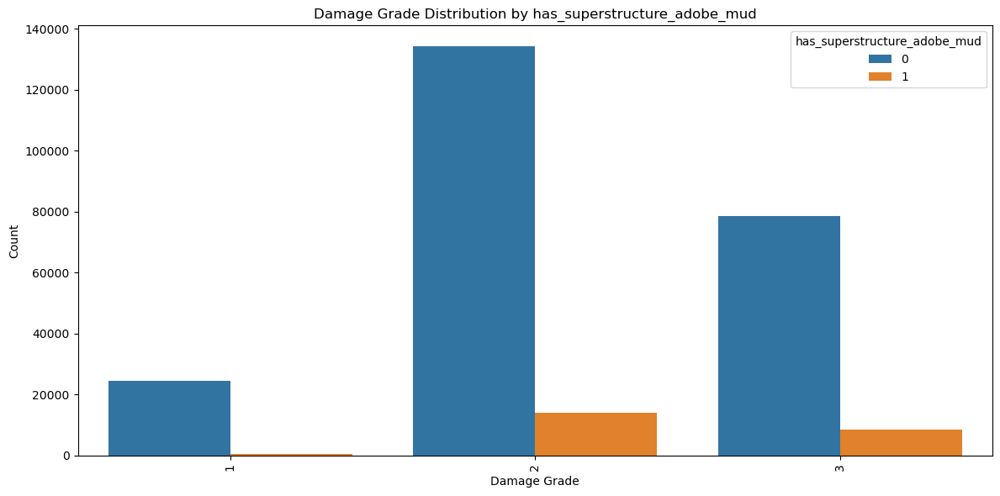

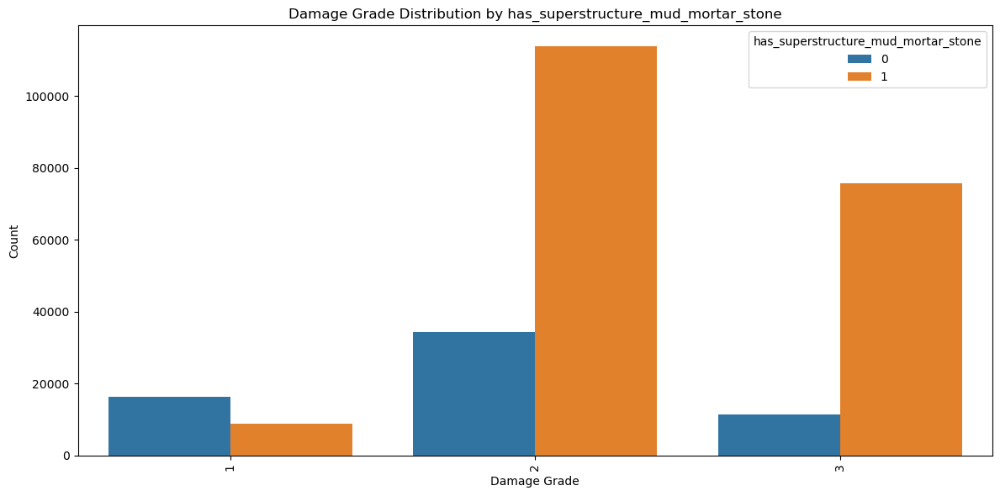

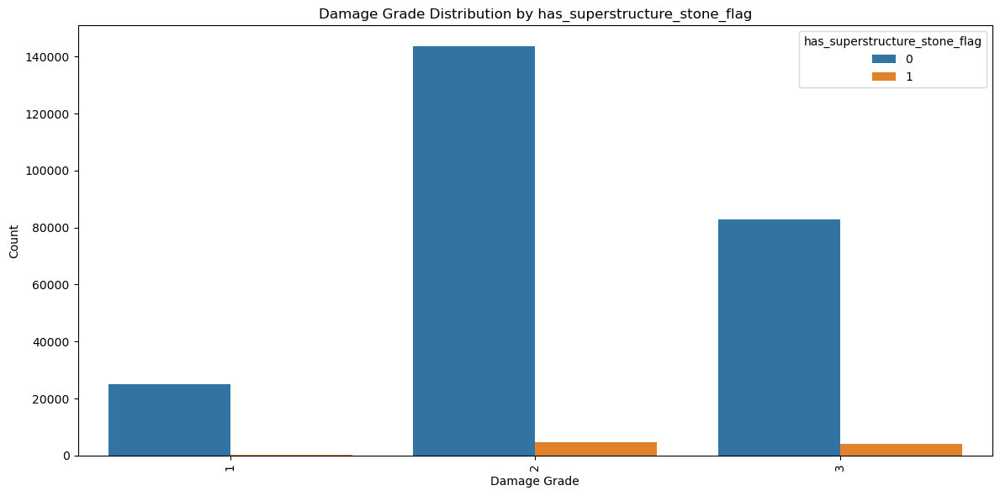

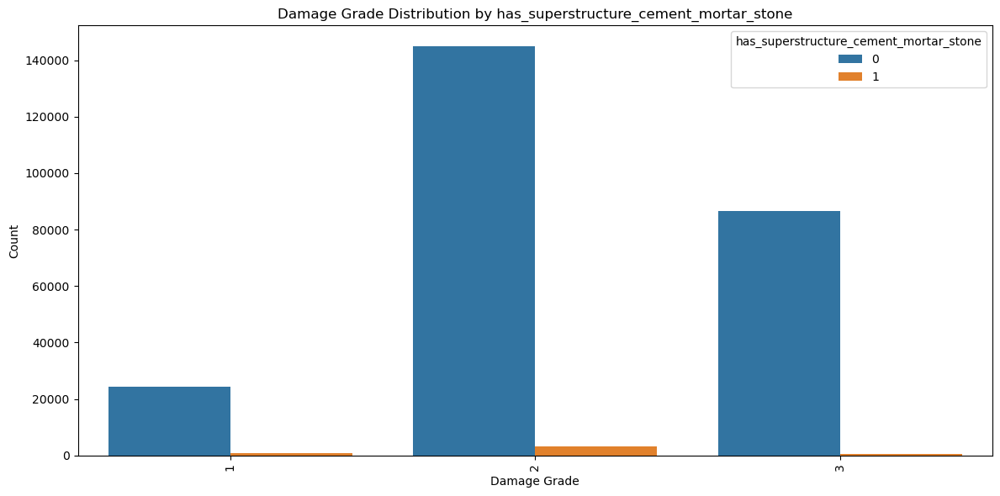

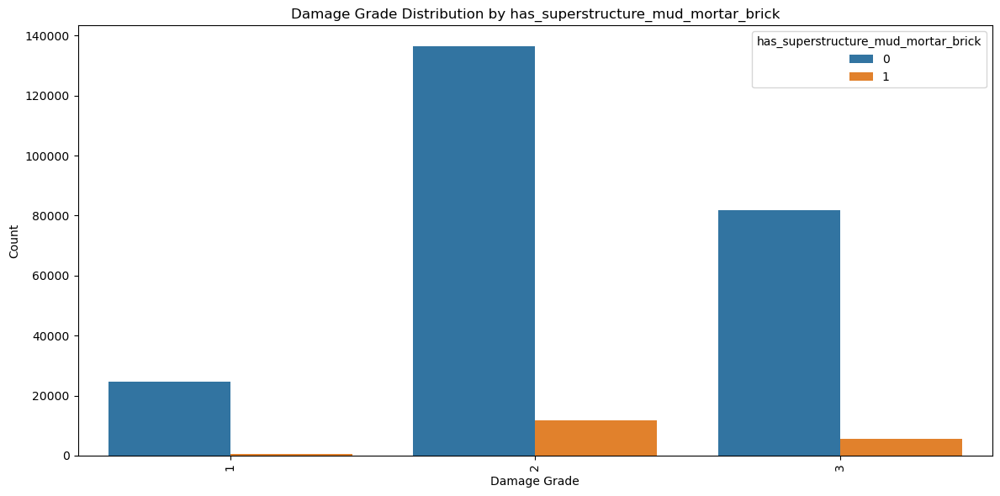

...

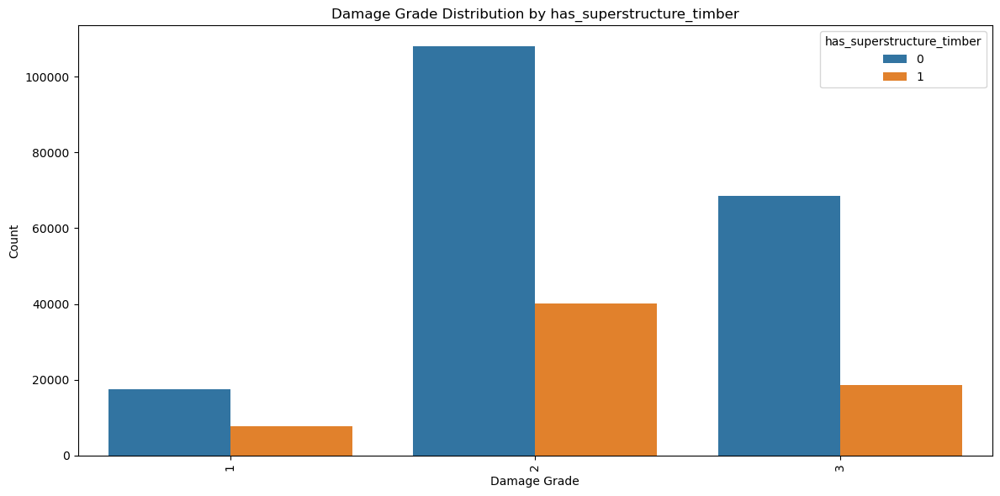

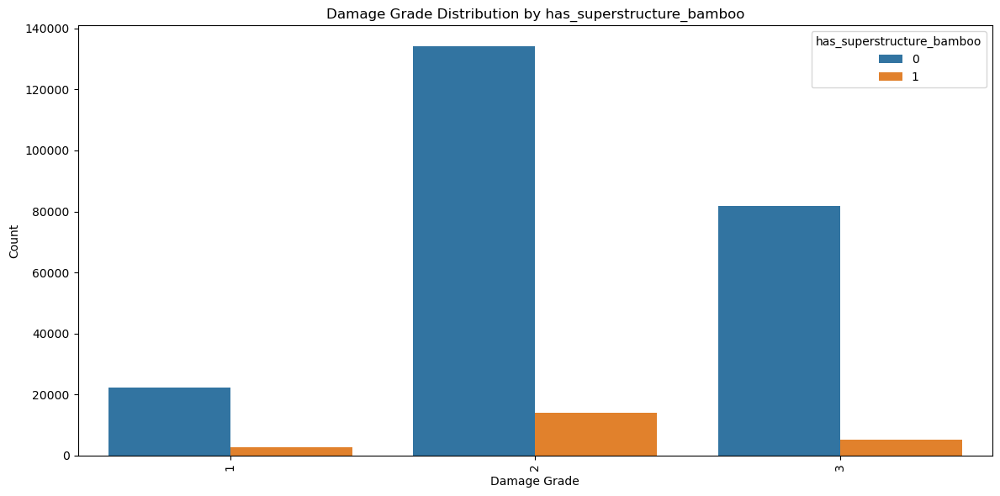

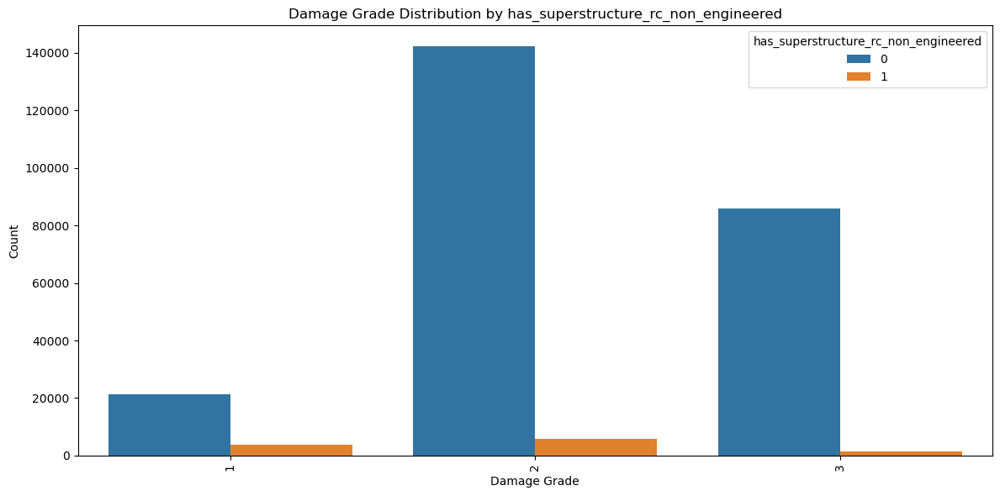

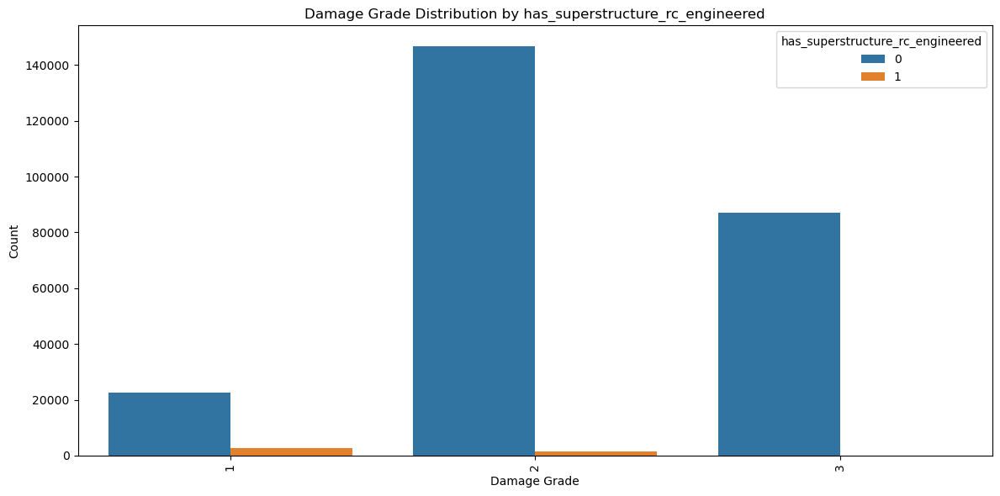

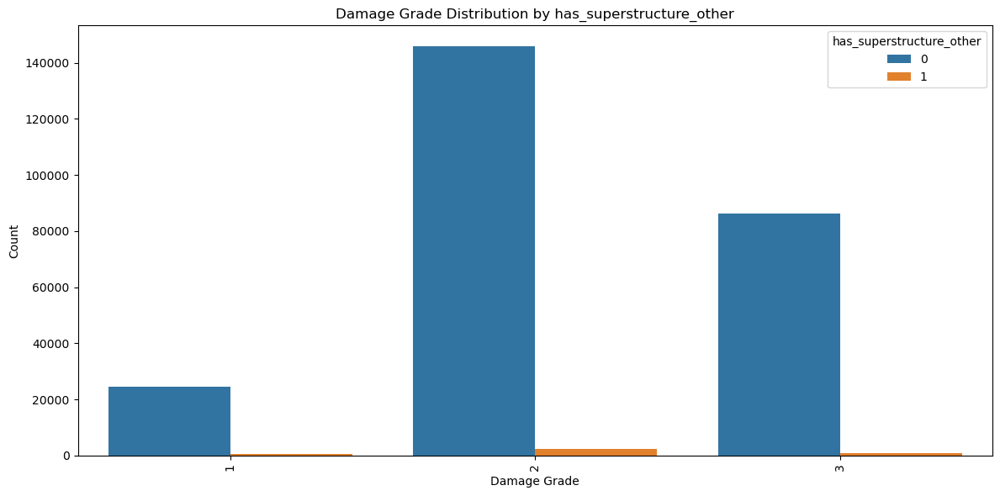

In [28]:
def plot_damage_distribution(df, column):
    damage_counts = training_df.groupby([column, 'damage_grade']).size().reset_index(name='count')
    
    plt.figure(figsize=(12, 6))
    sns.barplot(x='damage_grade', y='count', hue=column, data=damage_counts)
    plt.xlabel('Damage Grade')
    plt.ylabel('Count')
    plt.title(f'Damage Grade Distribution by {column}')
    plt.xticks(rotation=90)
    plt.legend(title=column)
    plt.tight_layout()
    plt.show()

for col in has_columns:
    plot_damage_distribution(training_df, col)

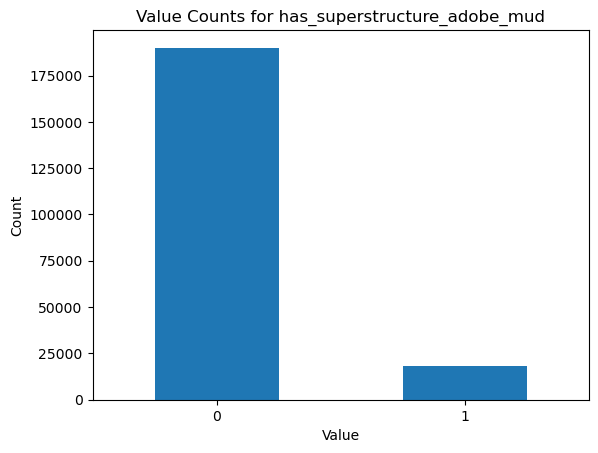

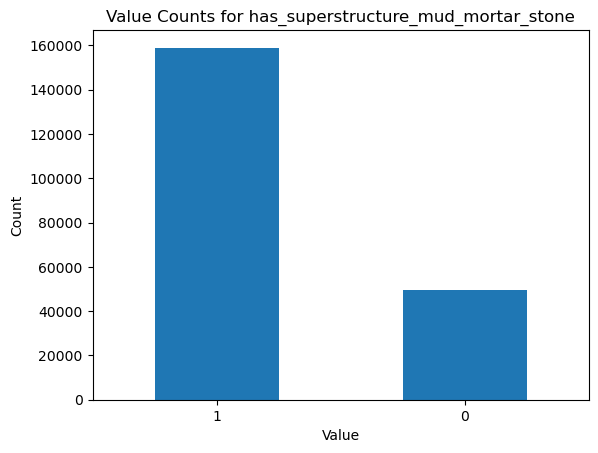

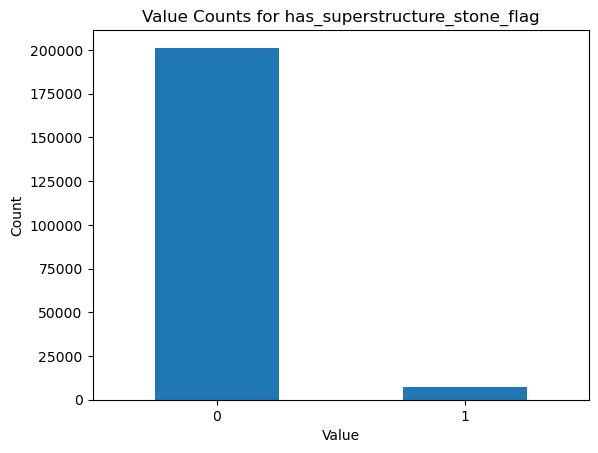

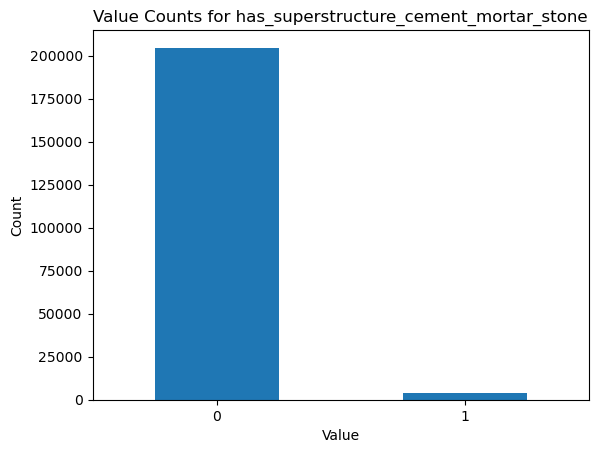

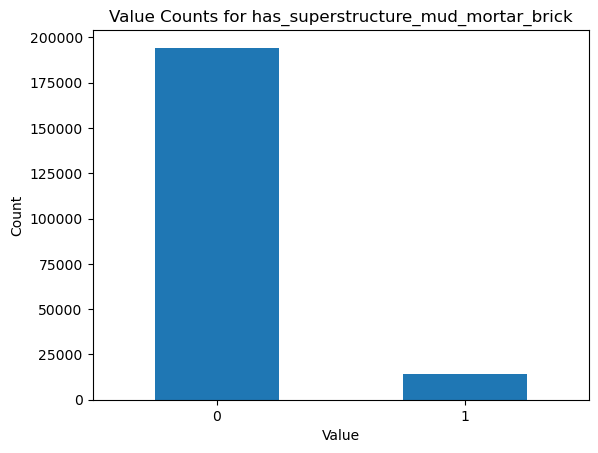

...

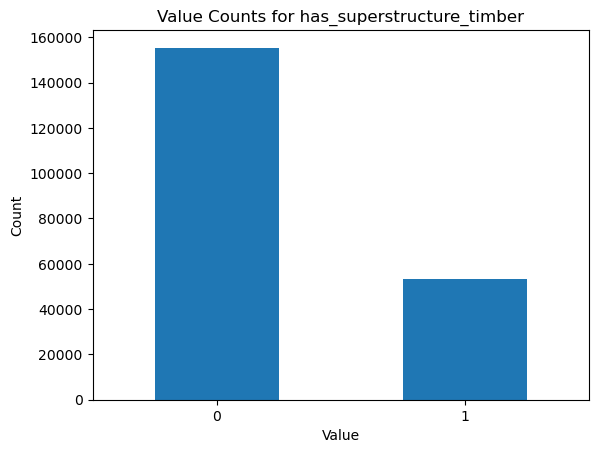

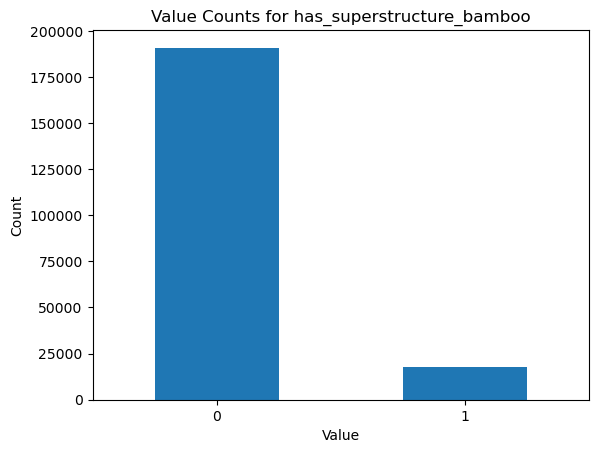

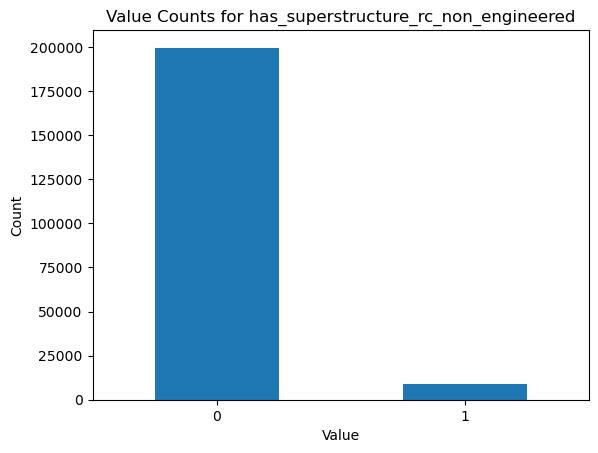

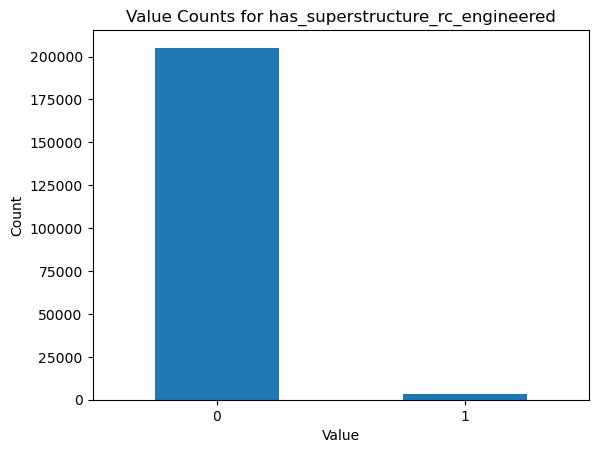

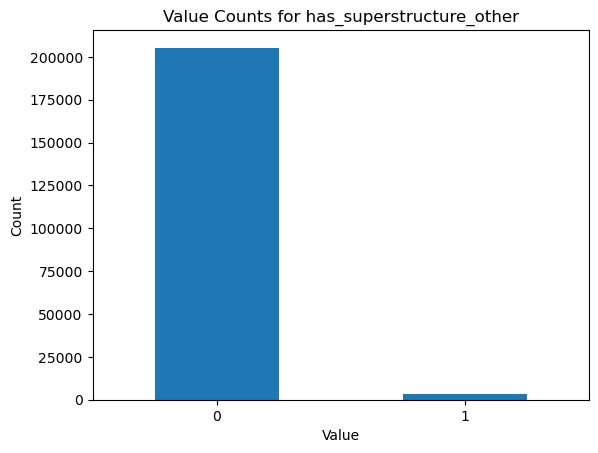

In [29]:
for col in has_columns:
    X_train[col].value_counts().plot(kind='bar')
    plt.title(f'Value Counts for {col}')
    plt.xlabel('Value')
    plt.ylabel('Count')
    plt.xticks(rotation=0)
    plt.show()

In [30]:
secondary_use_cols = [col for col in X_train.columns if col.startswith('has_secondary_use')]
print(f"Dropping {len(secondary_use_cols)} columns: {secondary_use_cols}")

Dropping 11 columns: ['has_secondary_use', 'has_secondary_use_agriculture', 'has_secondary_use_hotel', 'has_secondary_use_rental', 'has_secondary_use_institution', 'has_secondary_use_school', 'has_secondary_use_industry', 'has_secondary_use_health_post', 'has_secondary_use_gov_office', 'has_secondary_use_use_police', 'has_secondary_use_other']


In [31]:
from scipy import stats

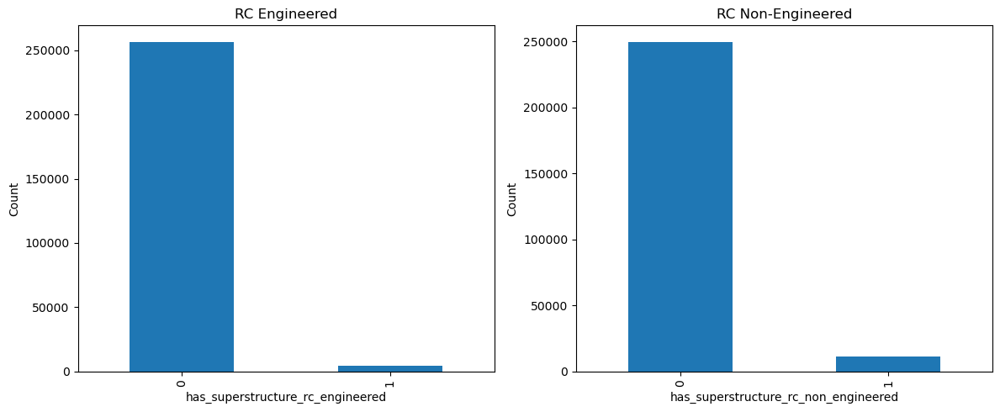

In [32]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

training_df['has_superstructure_rc_engineered'].value_counts().plot(
    kind='bar', ax=axes[0], title='RC Engineered')
axes[0].set_ylabel('Count')

training_df['has_superstructure_rc_non_engineered'].value_counts().plot(
    kind='bar', ax=axes[1], title='RC Non-Engineered')
axes[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

# Feature Engineering:
1. Group correlating features, and add new features to both training and test sets
2. Reduce cardinality in some features

In [33]:
def engineer_features(X):
    X['stone_structures'] = (
        X['has_superstructure_stone_flag'] |
        X['has_superstructure_mud_mortar_stone']
    ).astype(int)
    
    X['cement_structures'] = (
        X['has_superstructure_cement_mortar_brick'] |
        X['has_superstructure_cement_mortar_stone']
    ).astype(int)
    
    X['wood_structures'] = (
        X['has_superstructure_bamboo'] |
        X['has_superstructure_timber']
    ).astype(int)
    
    return X

X_train = engineer_features(X_train)
X_test = engineer_features(X_test)

In [34]:
X_train.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,stone_structures,cement_structures,wood_structures
185461,716310,21,935,5965,3,20,6,6,t,r,...,0,0,0,0,0,0,0,1,0,1
190537,283080,3,1229,1099,2,20,6,5,t,r,...,0,0,0,0,0,0,0,1,0,1
232781,690774,21,1219,2705,3,45,6,5,t,r,...,0,0,0,0,0,0,0,1,0,0
213004,904803,20,158,2452,2,10,7,5,t,w,...,0,0,0,0,0,0,0,0,0,1
177786,991971,9,670,5977,2,0,9,6,t,i,...,0,0,0,0,0,0,0,0,0,0


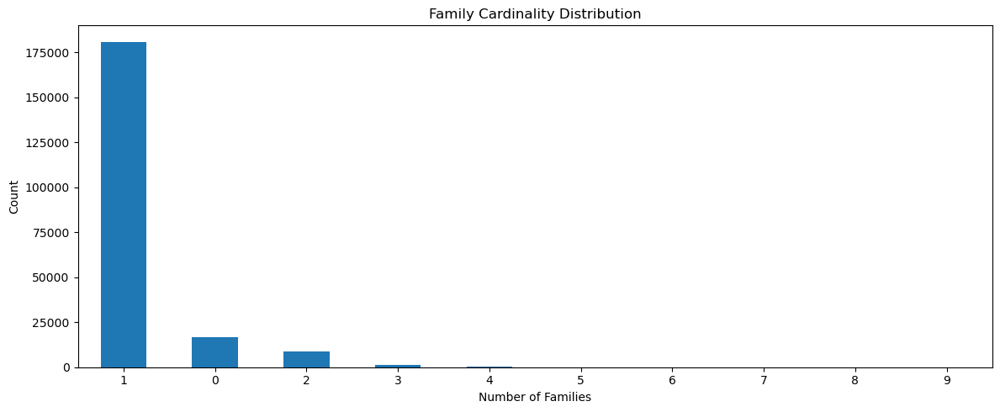

In [35]:
family_cardinality = X_train['count_families'].unique()

plt.figure(figsize=(12, 5))
X_train['count_families'].value_counts().plot(kind='bar')
plt.title("Family Cardinality Distribution")
plt.xlabel("Number of Families")
plt.ylabel("Count")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

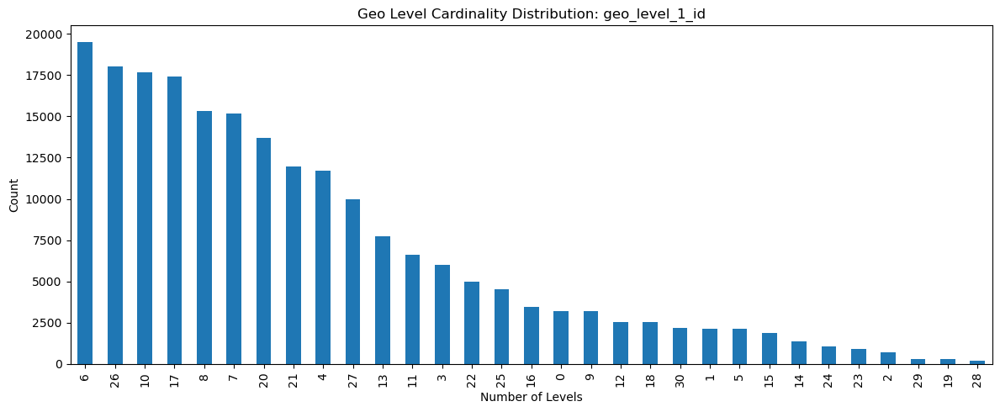

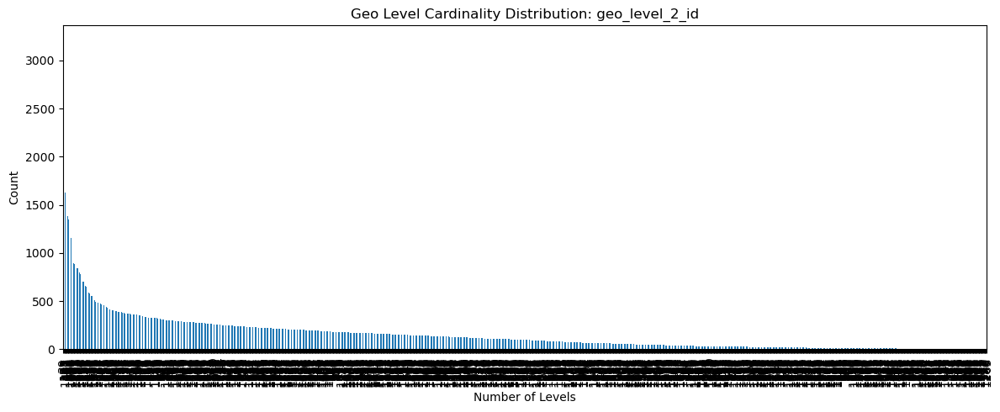

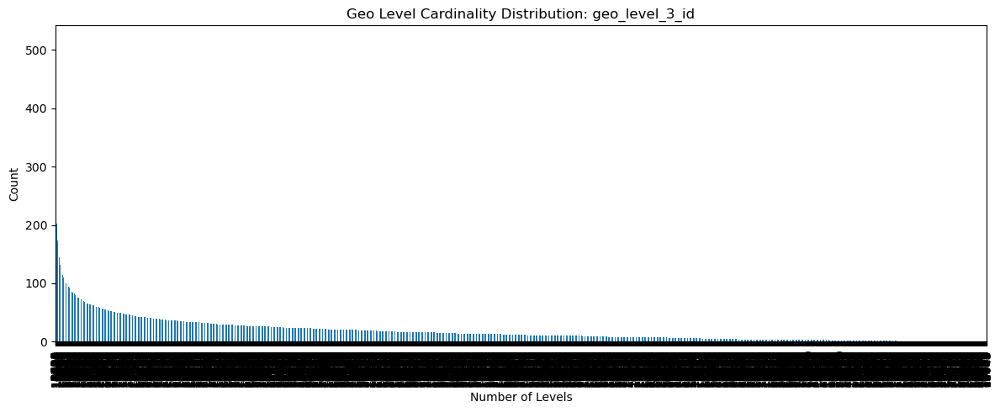

In [36]:
geo_level_cardinality = ['geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id']

for col in geo_level_cardinality:
    plt.figure(figsize=(12, 5))
    X_train[col].value_counts().plot(kind='bar')
    plt.title(f"Geo Level Cardinality Distribution: {col}")
    plt.xlabel("Number of Levels")
    plt.ylabel("Count")
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

Looking to reduce the cardinality distribution among the geo levels. Going to attempt to reduce the cardinality with a combination of target encoding and binning. Going to use Kmeans to reduce cardinality as well

freq = X_train['geo_level_1_id'].value_counts(normalize=True)
freq_dict = freq.to_dict()
X_train['geo_level_1_freq'] = X_train['geo_level_1_id'].map(freq_dict)
print(X_train[['geo_level_1_id', 'geo_level_1_freq']].head(10))

bins = [X_train['geo_level_1_id'].min()-1] 
bins.extend(X_train['geo_level_1_id'].quantile([0.33, 0.67]).tolist())
bins.append(X_train['geo_level_1_id'].max()+1)

X_train['geo_level_1_binned'] = pd.cut(X_train['geo_level_1_id'], 
                                      bins=bins, 
                                      labels=['low', 'medium', 'high'])

print("Bins created:", bins)
print("\nDistribution of binned values:")
print(X_train['geo_level_1_binned'].value_counts())
print("\nSample of binned data:")
print(X_train[['geo_level_1_id', 'geo_level_1_freq', 'geo_level_1_binned']].head(10))

freq = X_train['geo_level_2_id'].value_counts(normalize=True)
freq_dict = freq.to_dict()
X_train['geo_level_2_freq'] = X_train['geo_level_2_id'].map(freq_dict)

bins = [X_train['geo_level_2_id'].min()-1]
bins.extend(X_train['geo_level_2_id'].quantile([0.33, 0.67]).tolist())
bins.append(X_train['geo_level_2_id'].max()+1)
X_train['geo_level_2_binned'] = pd.cut(X_train['geo_level_2_id'], 
                                     bins=bins, 
                                     labels=['low', 'medium', 'high'])

freq = X_train['geo_level_3_id'].value_counts(normalize=True)
freq_dict = freq.to_dict()
X_train['geo_level_3_freq'] = X_train['geo_level_3_id'].map(freq_dict)

bins = [X_train['geo_level_3_id'].min()-1]
bins.extend(X_train['geo_level_3_id'].quantile([0.33, 0.67]).tolist())
bins.append(X_train['geo_level_3_id'].max()+1)
X_train['geo_level_3_binned'] = pd.cut(X_train['geo_level_3_id'], 
                                     bins=bins, 
                                     labels=['low', 'medium', 'high'])

for level in [1, 2, 3]:
    col = f'geo_level_{level}_id'
    binned_col = f'geo_level_{level}_binned'  
    freq_col = f'geo_level_{level}_freq'      
    
    print(f"\nDistribution for {binned_col}:")
    print(X_train[binned_col].value_counts())
    
    print(f"\nSample frequencies for {col}:")
    print(X_train[[col, freq_col]].head(5))

print("\nVerifying level 3 encoding:")
print("geo_level_3_binned unique values:", X_train['geo_level_3_binned'].unique())
print("geo_level_3_binned count:", X_train['geo_level_3_binned'].value_counts())
print("geo_level_3_freq sample:", X_train['geo_level_3_freq'].head())

X_test['geo_level_1_freq'] = X_test['geo_level_1_id'].map(freq_dict)

X_test['geo_level_1_binned'] = pd.cut(X_test['geo_level_1_id'], 
                                    bins=bins,  
                                    labels=['low', 'medium', 'high'])

freq_dict_2 = freq.to_dict()  
bins_2 = bins  

X_test['geo_level_2_freq'] = X_test['geo_level_2_id'].map(freq_dict_2)
X_test['geo_level_2_binned'] = pd.cut(X_test['geo_level_2_id'], 
                                    bins=bins_2, 
                                    labels=['low', 'medium', 'high'])

freq_dict_3 = freq.to_dict()  
bins_3 = bins  

X_test['geo_level_3_freq'] = X_test['geo_level_3_id'].map(freq_dict_3)
X_test['geo_level_3_binned'] = pd.cut(X_test['geo_level_3_id'], 
                                    bins=bins_3, 
                                    labels=['low', 'medium', 'high'])

print("Test set encoding results:")
for level in [1, 2, 3]:
    binned_col = f'geo_level_{level}_binned'
    print(f"\nDistribution for {binned_col} in test set:")
    print(X_test[binned_col].value_counts())

for col in ['geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id']:
    X_train[f'{col}_log'] = np.log1p(X_train[col])
    
for col in ['geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id']:
    X_test[f'{col}_log'] = np.log1p(X_test[col])
    
for col in ['geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id']:
    original_range = f"Original range: {X_train[col].min()} to {X_train[col].max()}"
    log_range = f"Log transformed range: {X_train[f'{col}_log'].min()} to {X_train[f'{col}_log'].max()}"
    print(f"\n{col}:")
    print(original_range)
    print(log_range)

In [37]:
from sklearn.cluster import KMeans

In [38]:
for col in ['geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id']:
    X_reshaped = X_train[[col]].values
    
    kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
    kmeans.fit(X_reshaped)
    
    X_train[f'{col}_cluster'] = kmeans.predict(X_reshaped)
    X_test[f'{col}_cluster'] = kmeans.predict(X_test[[col]].values)
    
    print(f"\nClusters for {col}:")
    for cluster in range(3):
        cluster_data = X_train[X_train[f'{col}_cluster'] == cluster][col]
        print(f"  Cluster {cluster}: Min = {cluster_data.min()}, Max = {cluster_data.max()}, Count = {len(cluster_data)}")
    

    print(f"\nTrain distribution for {col}_cluster:")
    print(X_train[f'{col}_cluster'].value_counts())
    
    print(f"\nTest distribution for {col}_cluster:")
    print(X_test[f'{col}_cluster'].value_counts())


Clusters for geo_level_1_id:
  Cluster 0: Min = 13, Max = 21, Count = 60324
  Cluster 1: Min = 0, Max = 12, Count = 105963
  Cluster 2: Min = 22, Max = 30, Count = 42193

Train distribution for geo_level_1_id_cluster:
geo_level_1_id_cluster
1    105963
0     60324
2     42193
Name: count, dtype: int64

Test distribution for geo_level_1_id_cluster:
geo_level_1_id_cluster
1    26384
0    15129
2    10608
Name: count, dtype: int64

Clusters for geo_level_2_id:
  Cluster 0: Min = 950, Max = 1427, Count = 67277
  Cluster 1: Min = 474, Max = 949, Count = 69620
  Cluster 2: Min = 0, Max = 473, Count = 71583

Train distribution for geo_level_2_id_cluster:
geo_level_2_id_cluster
2    71583
1    69620
0    67277
Name: count, dtype: int64

Test distribution for geo_level_2_id_cluster:
geo_level_2_id_cluster
2    18045
1    17277
0    16799
Name: count, dtype: int64

Clusters for geo_level_3_id:
  Cluster 0: Min = 0, Max = 4165, Count = 69816
  Cluster 1: Min = 8365, Max = 12565, Count = 69497
  

# What the Kmeans Cluster results are showing:


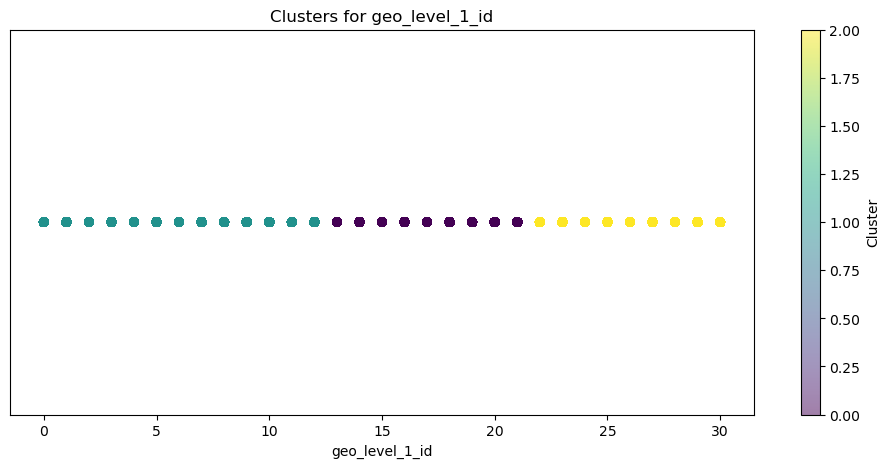

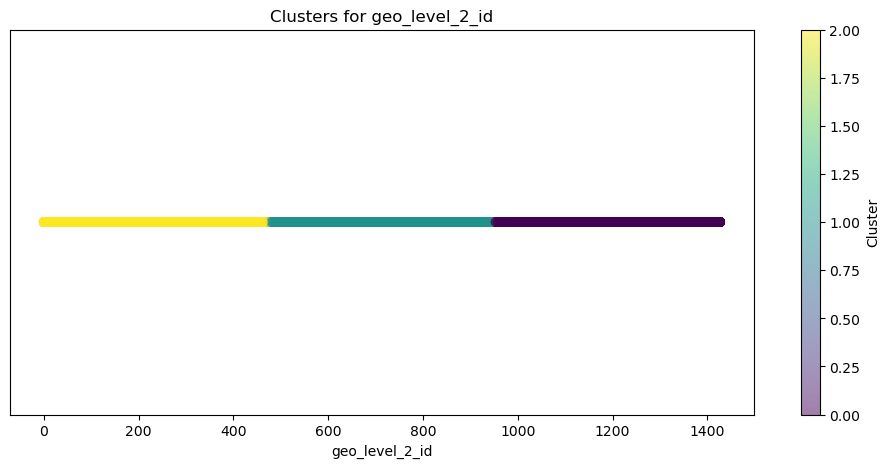

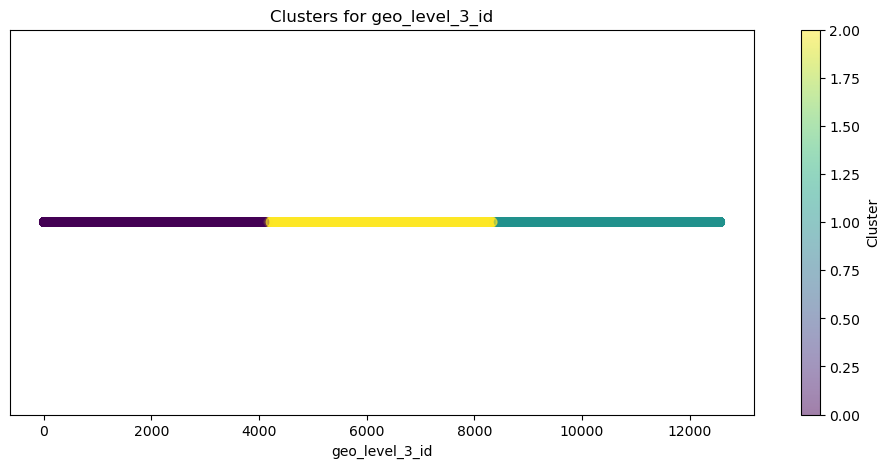

In [39]:
plt.figure(figsize=(12, 5))
plt.scatter(X_train['geo_level_1_id'], np.zeros_like(X_train['geo_level_1_id']), 
           c=X_train['geo_level_1_id_cluster'], cmap='viridis', alpha=0.5)
plt.colorbar(label='Cluster')
plt.title('Clusters for geo_level_1_id')
plt.xlabel('geo_level_1_id')
plt.yticks([])  
plt.show()

plt.figure(figsize=(12, 5))
plt.scatter(X_train['geo_level_2_id'], np.zeros_like(X_train['geo_level_2_id']), 
           c=X_train['geo_level_2_id_cluster'], cmap='viridis', alpha=0.5)
plt.colorbar(label='Cluster')
plt.title('Clusters for geo_level_2_id')
plt.xlabel('geo_level_2_id')
plt.yticks([])  
plt.show()

plt.figure(figsize=(12, 5))
plt.scatter(X_train['geo_level_3_id'], np.zeros_like(X_train['geo_level_3_id']), 
           c=X_train['geo_level_3_id_cluster'], cmap='viridis', alpha=0.5)
plt.colorbar(label='Cluster')
plt.title('Clusters for geo_level_3_id')
plt.xlabel('geo_level_3_id')
plt.yticks([])  
plt.show()

In [40]:
X_train.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,stone_structures,cement_structures,wood_structures,geo_level_1_id_cluster,geo_level_2_id_cluster,geo_level_3_id_cluster
185461,716310,21,935,5965,3,20,6,6,t,r,...,0,0,0,0,1,0,1,0,1,2
190537,283080,3,1229,1099,2,20,6,5,t,r,...,0,0,0,0,1,0,1,1,0,0
232781,690774,21,1219,2705,3,45,6,5,t,r,...,0,0,0,0,1,0,0,0,0,0
213004,904803,20,158,2452,2,10,7,5,t,w,...,0,0,0,0,0,0,1,0,2,0
177786,991971,9,670,5977,2,0,9,6,t,i,...,0,0,0,0,0,0,0,1,1,2


In [41]:
X_test.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,stone_structures,cement_structures,wood_structures,geo_level_1_id_cluster,geo_level_2_id_cluster,geo_level_3_id_cluster
124536,449925,6,1350,3790,3,60,12,8,n,r,...,0,0,0,0,1,0,0,1,0,0
112152,661669,20,863,11793,1,20,5,4,n,w,...,0,0,0,0,1,0,1,0,1,1
93613,1001567,20,214,10569,1,0,6,3,t,r,...,0,0,0,0,1,0,0,0,2,1
204895,904649,25,745,2704,1,25,7,3,t,r,...,0,0,0,0,1,0,1,2,1,0
37356,978604,27,390,5640,2,30,12,6,t,r,...,0,0,0,0,1,0,1,2,2,2


In [42]:
print(X_train.index.duplicated().sum())

0


In [43]:
def bin_age(x):
    if pd.isna(x):
        return 'Unknown'
    elif x < 0: 
        return 'Unknown'
    elif x <= 20:
        return '0-20'
    elif x <= 50:
        return '21-50'
    else:
        return '51+'

X_train['age_binned'] = X_train['age'].apply(bin_age)
X_test['age_binned'] = X_test['age'].apply(bin_age)

In [44]:
print(f"Original missing values: {X_train['age'].isna().sum()}")
print(f"Min age: {X_train['age'].min()}, Max age: {X_train['age'].max()}")
print(X_train['age_binned'].value_counts(dropna=False))

Original missing values: 0
Min age: 0, Max age: 995
age_binned
0-20     133441
21-50     60490
51+       14549
Name: count, dtype: int64


In [45]:
def bin_floors(x):
    if pd.isna(x):
        return 'Unknown'
    elif x == 1:
        return '1'
    elif x == 2:
        return '2'
    else:
        return '3+'

X_train['floor_binned'] = X_train['count_floors_pre_eq'].apply(bin_floors)
X_test['floor_binned'] = X_test['count_floors_pre_eq'].apply(bin_floors)

In [46]:
print(f"Original missing values: {X_train['count_floors_pre_eq'].isna().sum()}")
print(f"Min floor: {X_train['count_floors_pre_eq'].min()}, Max floor: {X_train['count_floors_pre_eq'].max()}")
print(X_train['floor_binned'].value_counts(dropna=False))

Original missing values: 0
Min floor: 1, Max floor: 9
floor_binned
2     125162
3+     50912
1      32406
Name: count, dtype: int64


In [47]:
X_train.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_use_police,has_secondary_use_other,stone_structures,cement_structures,wood_structures,geo_level_1_id_cluster,geo_level_2_id_cluster,geo_level_3_id_cluster,age_binned,floor_binned
185461,716310,21,935,5965,3,20,6,6,t,r,...,0,0,1,0,1,0,1,2,0-20,3+
190537,283080,3,1229,1099,2,20,6,5,t,r,...,0,0,1,0,1,1,0,0,0-20,2
232781,690774,21,1219,2705,3,45,6,5,t,r,...,0,0,1,0,0,0,0,0,21-50,3+
213004,904803,20,158,2452,2,10,7,5,t,w,...,0,0,0,0,1,0,2,0,0-20,2
177786,991971,9,670,5977,2,0,9,6,t,i,...,0,0,0,0,0,1,1,2,0-20,2


In [48]:
def bin_area(x):
    if pd.isna(x):
        return 'Unknown'
    elif x < 0: 
        return 'Unknown'
    elif x <= 7:
        return '1-7'
    elif x <= 14:
        return '8-14'
    else:
        return '15+'

X_train['area_binned'] = X_train['area_percentage'].apply(bin_area)
X_test['area_binned'] = X_test['area_percentage'].apply(bin_area)

In [49]:
print(f"Original missing values: {X_train['area_percentage'].isna().sum()}")
print(f"Min area: {X_train['area_percentage'].min()}, Max area: {X_train['area_percentage'].max()}")
print(X_train['area_binned'].value_counts(dropna=False))

Original missing values: 0
Min area: 1, Max area: 100
area_binned
1-7     116892
8-14     77945
15+      13643
Name: count, dtype: int64


In [50]:
def bin_heights(x):
    if pd.isna(x):
        return 'Unknown'
    elif x < 0:
        return 'Unknown'
    elif x <= 5:
        return '0-5'
    elif x <=10:
        return '6-10'
    else:
        return '10+'

X_train['height_binned'] = X_train['height_percentage'].apply(bin_heights)
X_test['height_binned'] = X_test['height_percentage'].apply(bin_heights)

In [51]:
print(f"Original missing values: {X_train['height_percentage'].isna().sum()}")
print(f"Min floor: {X_train['height_percentage'].min()}, Max floor: {X_train['height_percentage'].max()}")
print(X_train['height_binned'].value_counts(dropna=False))

Original missing values: 0
Min floor: 2, Max floor: 32
height_binned
0-5     121190
6-10     84643
10+       2647
Name: count, dtype: int64


In [52]:
def bin_families(x):
    if pd.isna(x):
        return 'Unknown'
    elif x == 0:
        return '0'
    elif x == 1:
        return '1'
    else:
        return '2+'
    
X_train['families_binned'] = X_train['count_families'].apply(bin_families)
X_test['families_binned'] = X_test['count_families'].apply(bin_families)

In [53]:
print(f"Original missing values: {X_train['count_families'].isna().sum()}")
print(f"Min families: {X_train['count_families'].min()}, Max families: {X_train['count_families'].max()}")
print(X_train['families_binned'].value_counts(dropna=False))

Original missing values: 0
Min families: 0, Max families: 9
families_binned
1     180919
0      16708
2+     10853
Name: count, dtype: int64


In [54]:
X_train = X_train.drop(columns=secondary_use_cols)
X_test = X_test.drop(columns=secondary_use_cols)

In [55]:
X_train.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,cement_structures,wood_structures,geo_level_1_id_cluster,geo_level_2_id_cluster,geo_level_3_id_cluster,age_binned,floor_binned,area_binned,height_binned,families_binned
185461,716310,21,935,5965,3,20,6,6,t,r,...,0,1,0,1,2,0-20,3+,1-7,6-10,1
190537,283080,3,1229,1099,2,20,6,5,t,r,...,0,1,1,0,0,0-20,2,1-7,0-5,1
232781,690774,21,1219,2705,3,45,6,5,t,r,...,0,0,0,0,0,21-50,3+,1-7,0-5,2+
213004,904803,20,158,2452,2,10,7,5,t,w,...,0,1,0,2,0,0-20,2,1-7,0-5,1
177786,991971,9,670,5977,2,0,9,6,t,i,...,0,0,1,1,2,0-20,2,8-14,6-10,1


In [56]:
X_train = X_train.drop(columns=['plan_configuration', 'legal_ownership_status'])
X_train.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,cement_structures,wood_structures,geo_level_1_id_cluster,geo_level_2_id_cluster,geo_level_3_id_cluster,age_binned,floor_binned,area_binned,height_binned,families_binned
185461,716310,21,935,5965,3,20,6,6,t,r,...,0,1,0,1,2,0-20,3+,1-7,6-10,1
190537,283080,3,1229,1099,2,20,6,5,t,r,...,0,1,1,0,0,0-20,2,1-7,0-5,1
232781,690774,21,1219,2705,3,45,6,5,t,r,...,0,0,0,0,0,21-50,3+,1-7,0-5,2+
213004,904803,20,158,2452,2,10,7,5,t,w,...,0,1,0,2,0,0-20,2,1-7,0-5,1
177786,991971,9,670,5977,2,0,9,6,t,i,...,0,0,1,1,2,0-20,2,8-14,6-10,1


In [57]:
X_test = X_test.drop(columns=['plan_configuration', 'legal_ownership_status'])
X_test.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,cement_structures,wood_structures,geo_level_1_id_cluster,geo_level_2_id_cluster,geo_level_3_id_cluster,age_binned,floor_binned,area_binned,height_binned,families_binned
124536,449925,6,1350,3790,3,60,12,8,n,r,...,0,0,1,0,0,51+,3+,8-14,6-10,1
112152,661669,20,863,11793,1,20,5,4,n,w,...,0,1,0,1,1,0-20,1,1-7,0-5,1
93613,1001567,20,214,10569,1,0,6,3,t,r,...,0,0,0,2,1,0-20,1,1-7,0-5,0
204895,904649,25,745,2704,1,25,7,3,t,r,...,0,1,2,1,0,21-50,1,1-7,0-5,1
37356,978604,27,390,5640,2,30,12,6,t,r,...,0,1,2,2,2,21-50,2,8-14,6-10,1


In [58]:
X_train = X_train.drop(columns=['has_superstructure_mud_mortar_stone', 'has_superstructure_stone_flag', 'has_superstructure_cement_mortar_stone', 'has_superstructure_mud_mortar_brick', 'has_superstructure_cement_mortar_brick', 'has_superstructure_timber', 'has_superstructure_bamboo'])
X_train.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,cement_structures,wood_structures,geo_level_1_id_cluster,geo_level_2_id_cluster,geo_level_3_id_cluster,age_binned,floor_binned,area_binned,height_binned,families_binned
185461,716310,21,935,5965,3,20,6,6,t,r,...,0,1,0,1,2,0-20,3+,1-7,6-10,1
190537,283080,3,1229,1099,2,20,6,5,t,r,...,0,1,1,0,0,0-20,2,1-7,0-5,1
232781,690774,21,1219,2705,3,45,6,5,t,r,...,0,0,0,0,0,21-50,3+,1-7,0-5,2+
213004,904803,20,158,2452,2,10,7,5,t,w,...,0,1,0,2,0,0-20,2,1-7,0-5,1
177786,991971,9,670,5977,2,0,9,6,t,i,...,0,0,1,1,2,0-20,2,8-14,6-10,1


In [59]:
X_test = X_test.drop(columns=['has_superstructure_mud_mortar_stone', 'has_superstructure_stone_flag', 'has_superstructure_cement_mortar_stone', 'has_superstructure_mud_mortar_brick', 'has_superstructure_cement_mortar_brick', 'has_superstructure_timber', 'has_superstructure_bamboo'])
X_test.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,cement_structures,wood_structures,geo_level_1_id_cluster,geo_level_2_id_cluster,geo_level_3_id_cluster,age_binned,floor_binned,area_binned,height_binned,families_binned
124536,449925,6,1350,3790,3,60,12,8,n,r,...,0,0,1,0,0,51+,3+,8-14,6-10,1
112152,661669,20,863,11793,1,20,5,4,n,w,...,0,1,0,1,1,0-20,1,1-7,0-5,1
93613,1001567,20,214,10569,1,0,6,3,t,r,...,0,0,0,2,1,0-20,1,1-7,0-5,0
204895,904649,25,745,2704,1,25,7,3,t,r,...,0,1,2,1,0,21-50,1,1-7,0-5,1
37356,978604,27,390,5640,2,30,12,6,t,r,...,0,1,2,2,2,21-50,2,8-14,6-10,1


# Pipeline building!

In [60]:
numeric_cols = X_train.select_dtypes(include=['int', 'int64']).columns.to_list()
categoric_col = X_train.select_dtypes(include=['object']).columns.to_list()

In [61]:
damage_grades_categories = [[1, 2, 3]]
y_train_reshaped = y_train.values.reshape(-1,1)
target_encoder = OrdinalEncoder(categories=damage_grades_categories)

In [62]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categoric_col)
    ])

rf_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(n_estimators= 100, random_state=42))
])

y_train_encoded = target_encoder.fit_transform(y_train_reshaped).ravel()
rf_pipeline.fit(X_train, y_train_encoded)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['building_id',
                                                   'geo_level_1_id',
                                                   'geo_level_2_id',
                                                   'geo_level_3_id',
                                                   'count_floors_pre_eq', 'age',
                                                   'area_percentage',
                                                   'height_percentage',
                                                   'has_superstructure_adobe_mud',
                                                   'has_superstructure_rc_non_engineered',
                                                   'has_superstructure_rc_engineered',
                                                   'has_superstructure_other...
                                                   'geo_level_1_id_cluster',
                                                   'geo_level_2_id_cluster',
                                                   'geo_level_3_id_cluster']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['land_surface_condition',
                                                   'foundation_type',
                                                   'roof_type',
                                                   'ground_floor_type',
                                                   'other_floor_type',
                                                   'position', 'age_binned',
                                                   'floor_binned',
                                                   'area_binned',
                                                   'height_binned',
                                                   'families_binned'])])),
                ('classifier', RandomForestClassifier(random_state=42))])

In [63]:
rf_y_train_pred = rf_pipeline.predict(X_train)
rf_y_test_pred = rf_pipeline.predict(X_test)
rf_train_accuracy = accuracy_score(y_train_encoded, rf_y_train_pred)
rf_test_accuracy = accuracy_score(y_test, rf_y_test_pred)
print(f"RF Training Accuracy: {rf_train_accuracy:.4f}")
print(f"RF Test Accuracy: {rf_test_accuracy:.4f}")

RF Training Accuracy: 1.0000
RF Test Accuracy: 0.1218


In [64]:
X_train.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,cement_structures,wood_structures,geo_level_1_id_cluster,geo_level_2_id_cluster,geo_level_3_id_cluster,age_binned,floor_binned,area_binned,height_binned,families_binned
185461,716310,21,935,5965,3,20,6,6,t,r,...,0,1,0,1,2,0-20,3+,1-7,6-10,1
190537,283080,3,1229,1099,2,20,6,5,t,r,...,0,1,1,0,0,0-20,2,1-7,0-5,1
232781,690774,21,1219,2705,3,45,6,5,t,r,...,0,0,0,0,0,21-50,3+,1-7,0-5,2+
213004,904803,20,158,2452,2,10,7,5,t,w,...,0,1,0,2,0,0-20,2,1-7,0-5,1
177786,991971,9,670,5977,2,0,9,6,t,i,...,0,0,1,1,2,0-20,2,8-14,6-10,1


In [65]:
print("\nRF Classification Report:")
print(classification_report(y_test, rf_y_test_pred))


RF Classification Report:
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         0
         1.0       0.08      0.52      0.13      5025
         2.0       0.27      0.13      0.17     29652
         3.0       0.00      0.00      0.00     17444

    accuracy                           0.12     52121
   macro avg       0.09      0.16      0.08     52121
weighted avg       0.16      0.12      0.11     52121



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/s

In [66]:
print("\nRF Confusion Matrix:")
print(confusion_matrix(y_test, rf_y_test_pred))


RF Confusion Matrix:
[[    0     0     0     0]
 [ 2338  2594    93     0]
 [ 1208 24690  3754     0]
 [  110  7119 10215     0]]


# RF Model Results
1. Overfitting: 77% accuracy on Training, 62% accuracy on Test. 15% difference indicates overfitting
2. Poor performance across all 3 classes: class 1(low damage) 56% precision, 41% recall, and 47% F1 Score; class 2(medium damage) 66% precision, 77% recall, 71% F1 Score (highest performing class); class 3(severe damage) 58% precision, 45% recall, 51% F1 Score
3. Confusion Matrix shows: class 1 building are being misclassified as class 2 (1647 correct out of 5825). Model seems to be favoring class 2. 
4. Class 3 is very problematic, only 3820 buildings were identified correctly out of 17444

2nd run of RF model will have class_weight=balanced to it. See how it performs.

In [67]:
rf_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(
        n_estimators=100,
        random_state=42,
        class_weight='balanced'))
])

rf_pipeline.fit(X_train, y_train_encoded)

rf_y_train_pred = rf_pipeline.predict(X_train)
rf_train_accuracy = accuracy_score(y_train_encoded, rf_y_train_pred)
print(f"RF Training Accuracy: {rf_train_accuracy:.4f}")

rf_y_test_encoded_pred = rf_pipeline.predict(X_test)
rf_y_test_pred = target_encoder.inverse_transform(rf_y_test_encoded_pred.reshape(-1, 1))
rf_test_accuracy = accuracy_score(y_test, rf_y_test_pred)
print(f"RF Test Accuracy: {rf_test_accuracy:.4f}")

RF Training Accuracy: 1.0000
RF Test Accuracy: 0.7118


In [68]:
print("\nRF Classification Report:")
print(classification_report(y_test, rf_y_test_pred))


RF Classification Report:
              precision    recall  f1-score   support

           1       0.65      0.45      0.53      5025
           2       0.71      0.84      0.77     29652
           3       0.73      0.57      0.64     17444

    accuracy                           0.71     52121
   macro avg       0.70      0.62      0.65     52121
weighted avg       0.71      0.71      0.70     52121



In [69]:
print("\nRF Confusion Matrix:")
print(confusion_matrix(y_test, rf_y_test_pred))


RF Confusion Matrix:
[[ 2248  2692    85]
 [ 1134 24914  3604]
 [   99  7408  9937]]


# RF Round 2



In [70]:
rf_param_distributions = {
    'classifier__n_estimators': [200, 300, 400],
    'classifier__max_depth': [20, 30, 40],
    'classifier__min_samples_split': [5, 10, 15],
    'classifier__min_samples_leaf': [2, 4, 8],
    'classifier__max_features': ['sqrt', 'log2'],
    'classifier__class_weight': ['balanced', 'balanced_subsample']
}

In [71]:
rf_random_search = RandomizedSearchCV(
    rf_pipeline,
    param_distributions=rf_param_distributions,
    n_iter=10,
    cv=3,
    scoring='f1_macro',
    n_jobs=-1,
    verbose=1,
    random_state=42
)

rf_random_search.fit(X_train, y_train_encoded)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('num',
                                                                               StandardScaler(),
                                                                               ['building_id',
                                                                                'geo_level_1_id',
                                                                                'geo_level_2_id',
                                                                                'geo_level_3_id',
                                                                                'count_floors_pre_eq',
                                                                                'age',
                                                                                'area_percentage',
                                                                                'height_percentage',
                                                                                'has_superstructure_adobe_mud',
                                                                                'has_superstructure_rc_non_engineered',
                                                                                'has_superstructure_rc_eng...
                                                                     random_state=42))]),
                   n_jobs=-1,
                   param_distributions={'classifier__class_weight': ['balanced',
                                                                     'balanced_subsample'],
                                        'classifier__max_depth': [20, 30, 40],
                                        'classifier__max_features': ['sqrt',
                                                                     'log2'],
                                        'classifier__min_samples_leaf': [2, 4,
                                                                         8],
                                        'classifier__min_samples_split': [5, 10,
                                                                          15],
                                        'classifier__n_estimators': [200, 300,
                                                                     400]},
                   random_state=42, scoring='f1_macro', verbose=1)

In [72]:
rf_best_params = rf_random_search.best_params_
rf_best_score = rf_random_search.best_score_
print(f"Best F1-macro score: {rf_best_score:.4f}")
print("Best parameters:", rf_best_params)

Best F1-macro score: 0.6631
Best parameters: {'classifier__n_estimators': 200, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'sqrt', 'classifier__max_depth': 40, 'classifier__class_weight': 'balanced'}


In [73]:
clean_params = {}
for key, value in rf_best_params.items():
    if key.startswith('classifier__'):
        clean_key = key.replace('classifier__', '')
        clean_params[clean_key] = value

In [74]:
rf_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(**clean_params, random_state=42))
])

rf_pipeline.fit(X_train, y_train_encoded)

rf_y_train_pred = rf_pipeline.predict(X_train)
rf_train_accuracy = accuracy_score(y_train_encoded, rf_y_train_pred)
print(f"RF Training Accuracy: {rf_train_accuracy:.4f}")

rf_y_test_encoded_pred = rf_pipeline.predict(X_test)
rf_y_test_pred = target_encoder.inverse_transform(rf_y_test_encoded_pred.reshape(-1, 1))
rf_test_accuracy = accuracy_score(y_test, rf_y_test_pred)
print(f"RF Test Accuracy: {rf_test_accuracy:.4f}")

RF Training Accuracy: 0.9059
RF Test Accuracy: 0.7088


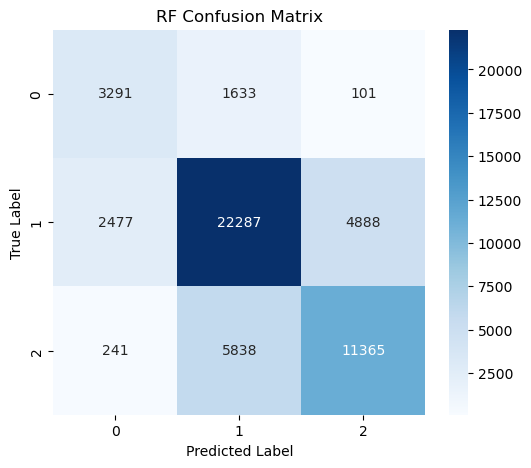

In [75]:
rf_confusion_matrix = confusion_matrix(y_test, rf_y_test_pred)

plt.figure(figsize=(6,5))
sns.heatmap(rf_confusion_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=[0, 1, 2], yticklabels=[0, 1, 2])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("RF Confusion Matrix")
plt.show()

In [76]:
print("\nRF Classification Report:")
print(classification_report(y_test, rf_y_test_pred))


RF Classification Report:
              precision    recall  f1-score   support

           1       0.55      0.65      0.60      5025
           2       0.75      0.75      0.75     29652
           3       0.69      0.65      0.67     17444

    accuracy                           0.71     52121
   macro avg       0.66      0.69      0.67     52121
weighted avg       0.71      0.71      0.71     52121



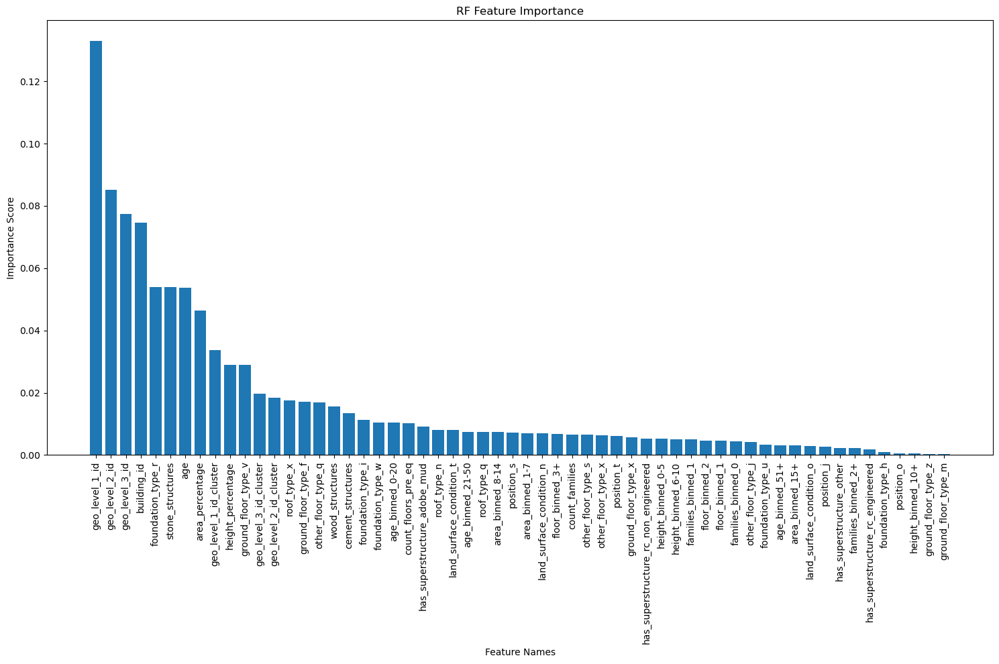

In [77]:
rf_importances = rf_pipeline.named_steps['classifier'].feature_importances_
preprocessor = rf_pipeline.named_steps['preprocessor']
transformers = preprocessor.transformers_
feature_names_out = []

for name, transformer, columns in transformers:
    if name == 'num':
        feature_names_out.extend(columns)
    elif name == 'cat':
        for i, col in enumerate(columns):
            categories = transformer.categories_[i]
            for cat in categories:
                feature_names_out.append(f"{col}_{cat}")
                
rf_indices = np.argsort(rf_importances)[::-1]

plt.figure(figsize=(15, 10))
plt.title("RF Feature Importance")
plt.bar(range(len(rf_importances)), rf_importances[rf_indices], align="center")
plt.xticks(range(len(rf_importances)), [feature_names_out[i] for i in rf_indices], rotation=90)
plt.xlabel("Feature Names")
plt.ylabel("Importance Score")
plt.tight_layout()
plt.show()

In [78]:
print("Top 20 features by importance:")
for i in range(min(20, len(rf_indices))):
    print(f"Feature {rf_indices[i]}: {rf_importances[i]:.4f}")

Top 20 features by importance:
Feature 1: 0.0745
Feature 2: 0.1329
Feature 3: 0.0851
Feature 0: 0.0773
Feature 24: 0.0103
Feature 13: 0.0538
Feature 5: 0.0464
Feature 6: 0.0291
Feature 16: 0.0092
Feature 7: 0.0053
Feature 32: 0.0019
Feature 18: 0.0023
Feature 17: 0.0067
Feature 29: 0.0539
Feature 30: 0.0133
Feature 36: 0.0156
Feature 15: 0.0337
Feature 14: 0.0184
Feature 23: 0.0197
Feature 26: 0.0070


In [79]:
top_n_features = min(20, len(rf_importances))
top_indices = rf_indices[:top_n_features]

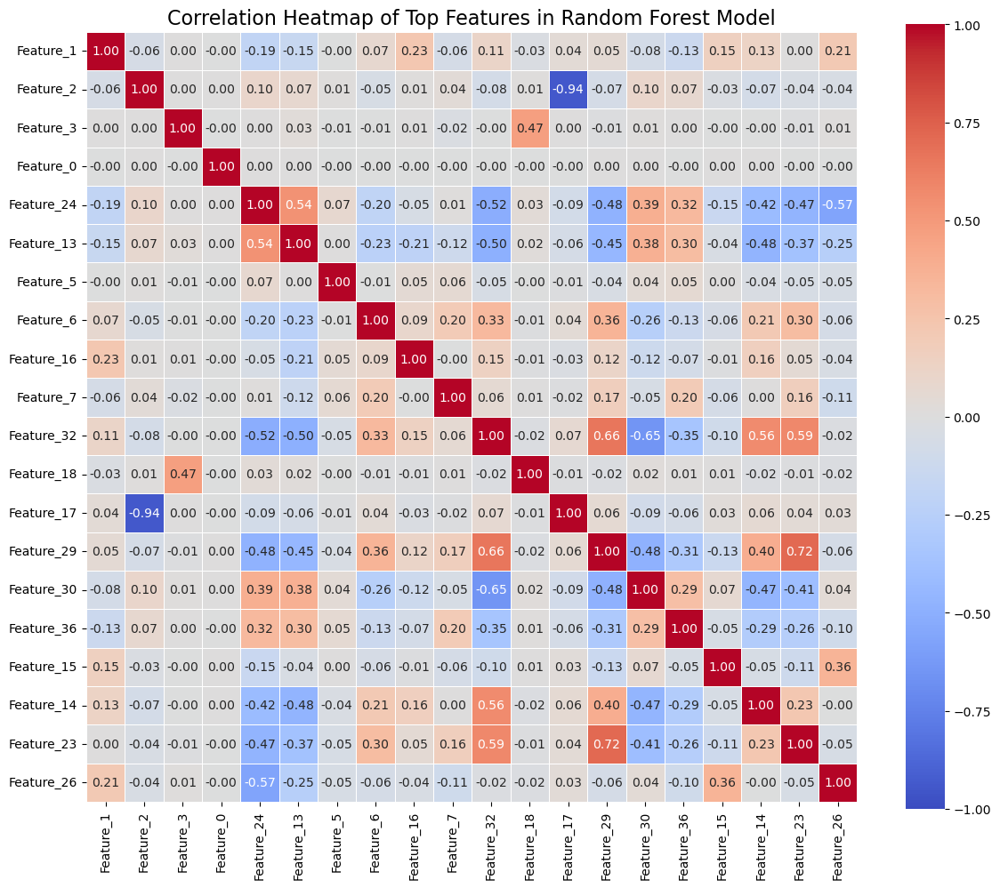

In [80]:
X_train_transformed = rf_pipeline.named_steps['preprocessor'].transform(X_train)

X_train_top = pd.DataFrame(
    X_train_transformed[:, top_indices],
    columns=[f'Feature_{i}' for i in top_indices]
)

correlation_matrix = X_train_top.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(
    correlation_matrix,
    annot=True,
    cmap='coolwarm',
    vmin=-1,
    vmax=1,
    center=0,
    square=True,
    linewidths=.5,
    fmt='.2f'
)
plt.title('Correlation Heatmap of Top Features in Random Forest Model', fontsize=16)
plt.tight_layout()
plt.show()

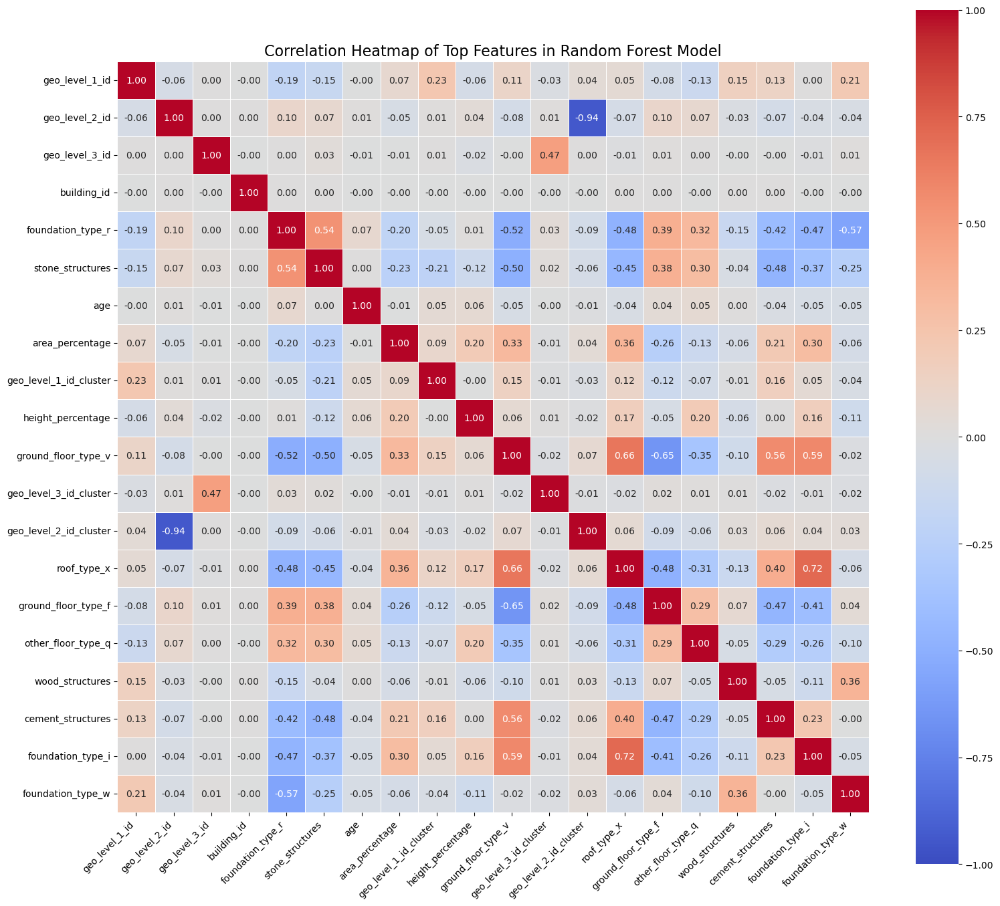

In [81]:
rf_importances = rf_pipeline.named_steps['classifier'].feature_importances_

preprocessor = rf_pipeline.named_steps['preprocessor']
X_train_transformed = preprocessor.transform(X_train)
feature_names_out = []

transformers = preprocessor.transformers_
for name, transformer, columns in transformers:
    if name == 'num':
        feature_names_out.extend(columns)
    elif name == 'cat':
        for i, col in enumerate(columns):
            categories = transformer.categories_[i]
            for cat in categories:
                feature_names_out.append(f"{col}_{cat}")

indices = np.argsort(rf_importances)[::-1]
top_n = min(20, len(rf_importances))
top_indices = indices[:top_n]
top_feature_names = [feature_names_out[i] for i in top_indices]

X_train_top = pd.DataFrame(
    X_train_transformed[:, top_indices],
    columns=top_feature_names
)

correlation_matrix = X_train_top.corr()

plt.figure(figsize=(16, 14))
sns.heatmap(
    correlation_matrix,
    annot=True,
    cmap='coolwarm',
    vmin=-1,
    vmax=1,
    center=0,
    square=True,
    linewidths=.5,
    fmt='.2f'
)
plt.title('Correlation Heatmap of Top Features in Random Forest Model', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [82]:
num_features = X_train.select_dtypes(include=['int64', 'float64']).columns.tolist()
cat_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()

# CatBoost Classifier Model

In [83]:
from catboost import CatBoostClassifier

In [84]:
cat_model = CatBoostClassifier(
    iterations=500,
    learning_rate=0.05,
    depth=6,
    loss_function='MultiClass',
    random_seed=42,
    verbose=False,
    cat_features=cat_features
)

cat_model.fit(X_train, y_train)

cat_y_train_pred = cat_model.predict(X_train)
cat_y_test_pred = cat_model.predict(X_test)

cat_train_accuracy = accuracy_score(y_train, cat_y_train_pred)
cat_test_accuracy = accuracy_score(y_test, cat_y_test_pred)

print(f"CatBoost Training Accuracy: {cat_train_accuracy:.4f}")
print(f"CatBoost Test Accuracy: {cat_test_accuracy:.4f}")

CatBoost Training Accuracy: 0.7038
CatBoost Test Accuracy: 0.7031


In [122]:
print("\nCatBoost Classification Report:")
print(classification_report(y_test, cat_y_test_pred))


CatBoost Classification Report:
              precision    recall  f1-score   support

           1       0.67      0.40      0.50      5025
           2       0.69      0.86      0.77     29652
           3       0.73      0.53      0.61     17444

    accuracy                           0.70     52121
   macro avg       0.70      0.59      0.63     52121
weighted avg       0.70      0.70      0.69     52121



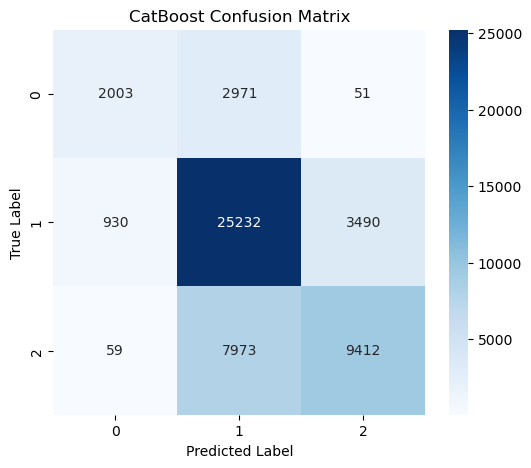

In [85]:
cat_confusion_matrix = confusion_matrix(y_test, cat_y_test_pred)

plt.figure(figsize=(6,5))
sns.heatmap(cat_confusion_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=[0, 1, 2], yticklabels=[0, 1, 2])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("CatBoost Confusion Matrix")
plt.show()

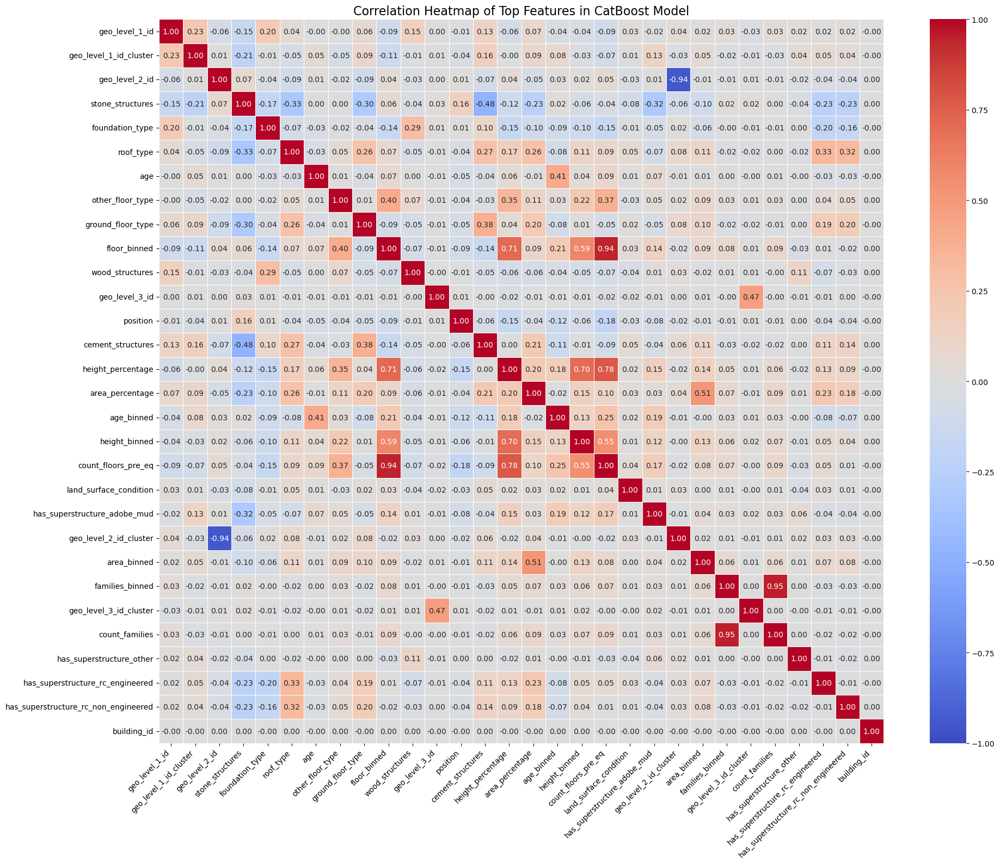

In [108]:
cat_importances = cat_model.get_feature_importance()

feature_names = X_train.columns.tolist()
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': cat_importances
}).sort_values('importance', ascending=False)

top_n = min(30, len(importance_df))
top_features = importance_df.head(top_n)['feature'].tolist()

X_train_top = X_train[top_features].copy()

cat_columns = [col for col in top_features if col in cat_features]

X_train_numeric = X_train_top.copy()
for col in cat_columns:
    if X_train_numeric[col].dtype in ['object', 'category']:
        X_train_numeric[col] = pd.Categorical(X_train_numeric[col]).codes

correlation_matrix = X_train_numeric.corr()

plt.figure(figsize=(20, 16))
sns.heatmap(
    correlation_matrix,
    annot=True,
    cmap='coolwarm',
    vmin=-1,
    vmax=1,
    center=0,
    square=True,
    linewidths=.5,
    fmt='.2f'
)
plt.title('Correlation Heatmap of Top Features in CatBoost Model', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [87]:
cat_params = {
    'iterations': [300, 500],
    'learning_rate': [0.01, 0.03, 0.05],
    'depth': [4, 6, 8],
    'l2_leaf_reg': [1, 3, 5],
    'grow_policy': ['SymmetricTree']
}

In [88]:
cat_base = CatBoostClassifier(
    loss_function='MultiClass',
    random_seed=42,
    verbose=False,
    cat_features=cat_features,
)

In [89]:
cat_random_search = RandomizedSearchCV(
    cat_base,
    param_distributions=cat_params,
    n_iter=10,
    cv=2,
    scoring='accuracy',
    random_state=42,
    n_jobs=-1,
    verbose=2
)

X_train_sample = X_train.sample(frac=0.15, random_state=42)
y_train_sample = y_train.loc[X_train_sample.index]

In [90]:
cat_random_search.fit(X_train, y_train)

cat_best_params = cat_random_search.best_params_
cat_best_score = cat_random_search.best_score_

print(f"Best CV score: {cat_best_score:.4f}")
print("Best parameters:")
for param, value in cat_best_params.items():
    print(f"  {param}: {value}")

Fitting 2 folds for each of 10 candidates, totalling 20 fits
[CV] END depth=6, grow_policy=SymmetricTree, iterations=300, l2_leaf_reg=1, learning_rate=0.03; total time= 8.7min
[CV] END depth=6, grow_policy=SymmetricTree, iterations=300, l2_leaf_reg=1, learning_rate=0.03; total time= 8.8min
[CV] END depth=4, grow_policy=SymmetricTree, iterations=500, l2_leaf_reg=3, learning_rate=0.01; total time= 9.9min
[CV] END depth=4, grow_policy=SymmetricTree, iterations=500, l2_leaf_reg=3, learning_rate=0.01; total time= 9.9min
[CV] END depth=4, grow_policy=SymmetricTree, iterations=300, l2_leaf_reg=3, learning_rate=0.05; total time= 6.2min
[CV] END depth=4, grow_policy=SymmetricTree, iterations=300, l2_leaf_reg=3, learning_rate=0.05; total time= 6.3min
[CV] END depth=8, grow_policy=SymmetricTree, iterations=300, l2_leaf_reg=5, learning_rate=0.05; total time=14.9min
[CV] END depth=8, grow_policy=SymmetricTree, iterations=300, l2_leaf_reg=5, learning_rate=0.05; total time=15.5min
[CV] END depth=8, g

In [91]:
cat_best_score = cat_random_search.best_score_
print(f"Best CV score: {cat_best_score:.4f}")

Best CV score: 0.6970


In [92]:
cat_model = CatBoostClassifier(
    learning_rate=0.03,
    l2_leaf_reg= 3,
    iterations= 500,
    grow_policy= 'SymmetricTree',
    depth=8,
    loss_function='MultiClass',
    random_seed=42,
    cat_features=cat_features
)

cat_model.fit(X_train, y_train)

cat_y_train_pred = cat_model.predict(X_train)
cat_y_test_pred = cat_model.predict(X_test)

cat_train_accuracy = accuracy_score(y_train, cat_y_train_pred)
cat_test_accuracy = accuracy_score(y_test, cat_y_test_pred)

print(f"CatBoost Training Accuracy: {cat_train_accuracy:.4f}")
print(f"CatBoost Test Accuracy: {cat_test_accuracy:.4f}")

0:	learn: 1.0807465	total: 615ms	remaining: 5m 6s
1:	learn: 1.0640946	total: 1.88s	remaining: 7m 47s
2:	learn: 1.0482487	total: 3.77s	remaining: 10m 25s
3:	learn: 1.0337258	total: 4.59s	remaining: 9m 29s
4:	learn: 1.0200970	total: 5.4s	remaining: 8m 54s
5:	learn: 1.0071458	total: 6.19s	remaining: 8m 29s
6:	learn: 0.9947304	total: 6.83s	remaining: 8m 1s
7:	learn: 0.9827302	total: 7.73s	remaining: 7m 55s
8:	learn: 0.9722057	total: 8.34s	remaining: 7m 34s
9:	learn: 0.9615869	total: 9.06s	remaining: 7m 23s
10:	learn: 0.9511367	total: 9.84s	remaining: 7m 17s
11:	learn: 0.9416695	total: 10.6s	remaining: 7m 9s
12:	learn: 0.9321559	total: 11.3s	remaining: 7m 3s
13:	learn: 0.9236406	total: 12s	remaining: 6m 56s
14:	learn: 0.9152491	total: 12.8s	remaining: 6m 52s
15:	learn: 0.9072822	total: 13.5s	remaining: 6m 47s
16:	learn: 0.8997701	total: 14s	remaining: 6m 38s
17:	learn: 0.8926345	total: 14.6s	remaining: 6m 30s
18:	learn: 0.8854452	total: 15.3s	remaining: 6m 26s
19:	learn: 0.8784733	total: 16

In [123]:
print("\nCatBoost Classification Report:")
print(classification_report(y_test, cat_y_test_pred))


CatBoost Classification Report:
              precision    recall  f1-score   support

           1       0.67      0.40      0.50      5025
           2       0.69      0.86      0.77     29652
           3       0.73      0.53      0.61     17444

    accuracy                           0.70     52121
   macro avg       0.70      0.59      0.63     52121
weighted avg       0.70      0.70      0.69     52121



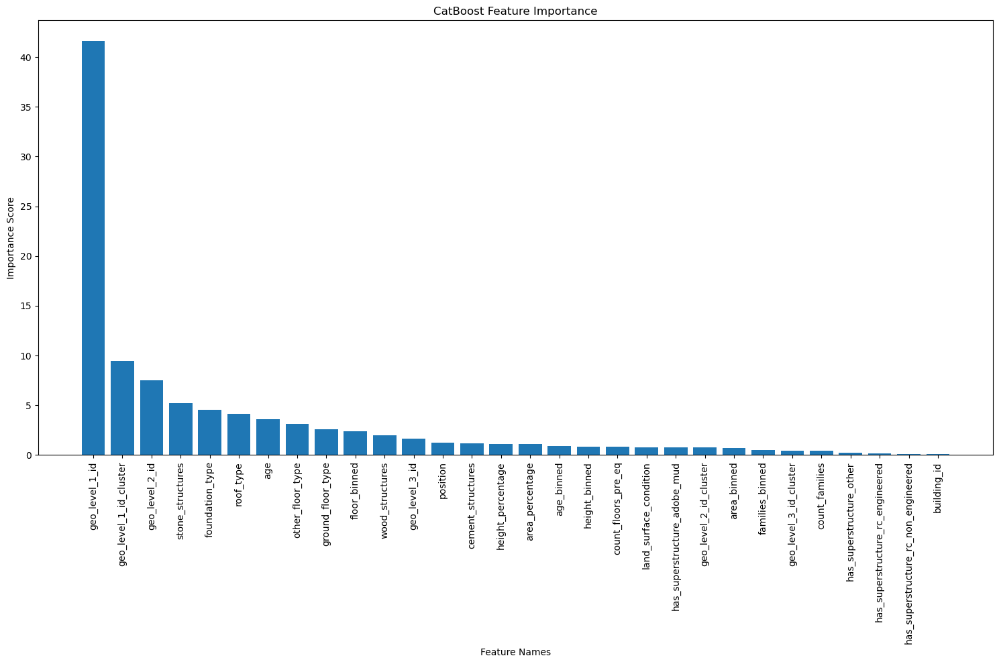

In [93]:
cat_feature_importances = cat_model.get_feature_importance()
feature_names_out = []

original_feature_names = list(X_train.columns)
feature_names_out = original_feature_names

cat_indices = np.argsort(cat_feature_importances)[::-1]

plt.figure(figsize=(15, 10))
plt.title("CatBoost Feature Importance")
plt.bar(range(len(cat_feature_importances)), cat_feature_importances[cat_indices], align="center")

if len(feature_names_out) == len(cat_feature_importances):
    plt.xticks(range(len(cat_feature_importances)), [feature_names_out[i] for i in cat_indices], rotation=90)
else:
    plt.xticks(range(len(cat_feature_importances)), range(len(cat_feature_importances)), rotation=90)

plt.xticks(range(len(cat_feature_importances)), [feature_names_out[i] for i in cat_indices], rotation=90)
plt.xlabel("Feature Names")
plt.ylabel("Importance Score")
plt.tight_layout()
plt.show()

In [109]:
X_train.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,cement_structures,wood_structures,geo_level_1_id_cluster,geo_level_2_id_cluster,geo_level_3_id_cluster,age_binned,floor_binned,area_binned,height_binned,families_binned
185461,716310,21,935,5965,3,20,6,6,t,r,...,0,1,0,1,2,0-20,3+,1-7,6-10,1
190537,283080,3,1229,1099,2,20,6,5,t,r,...,0,1,1,0,0,0-20,2,1-7,0-5,1
232781,690774,21,1219,2705,3,45,6,5,t,r,...,0,0,0,0,0,21-50,3+,1-7,0-5,2+
213004,904803,20,158,2452,2,10,7,5,t,w,...,0,1,0,2,0,0-20,2,1-7,0-5,1
177786,991971,9,670,5977,2,0,9,6,t,i,...,0,0,1,1,2,0-20,2,8-14,6-10,1


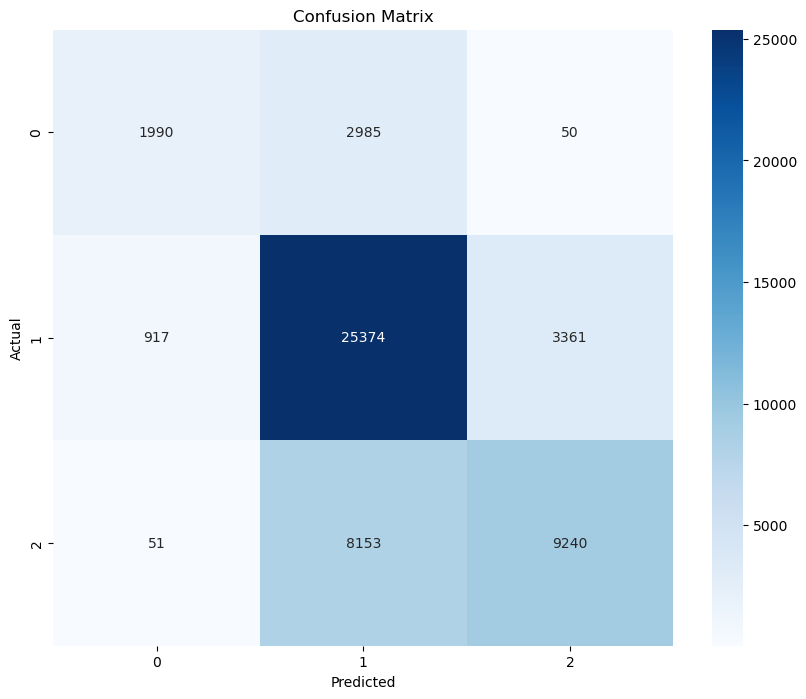

In [94]:
cat_cm = confusion_matrix(y_test, cat_y_test_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cat_cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Error Analysis

In [95]:
error_df = X_test.copy()
error_df['actual'] = y_test
error_df['predicted'] = cat_y_test_pred
error_df['is_error'] = error_df['actual'] != error_df['predicted']

In [96]:
n_top_features = 10
cat_indices = np.argsort(cat_feature_importances)[::-1]
top_feature_names = [feature_names_out[i] for i in cat_indices[:n_top_features]]

print("Top feature names:", top_feature_names)
print("X_test columns:", X_test.columns.tolist())

Top feature names: ['geo_level_1_id', 'geo_level_1_id_cluster', 'geo_level_2_id', 'stone_structures', 'foundation_type', 'roof_type', 'age', 'other_floor_type', 'ground_floor_type', 'floor_binned']
X_test columns: ['building_id', 'geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id', 'count_floors_pre_eq', 'age', 'area_percentage', 'height_percentage', 'land_surface_condition', 'foundation_type', 'roof_type', 'ground_floor_type', 'other_floor_type', 'position', 'has_superstructure_adobe_mud', 'has_superstructure_rc_non_engineered', 'has_superstructure_rc_engineered', 'has_superstructure_other', 'count_families', 'stone_structures', 'cement_structures', 'wood_structures', 'geo_level_1_id_cluster', 'geo_level_2_id_cluster', 'geo_level_3_id_cluster', 'age_binned', 'floor_binned', 'area_binned', 'height_binned', 'families_binned']


In [97]:
available_top_features = [feature for feature in top_feature_names if feature in X_test.columns]
print("Available top features:", available_top_features)

Available top features: ['geo_level_1_id', 'geo_level_1_id_cluster', 'geo_level_2_id', 'stone_structures', 'foundation_type', 'roof_type', 'age', 'other_floor_type', 'ground_floor_type', 'floor_binned']


/var/folders/m7/tzk7gpbd05j79z_hsb25z6jm0000gn/T/ipykernel_23921/3412442567.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  error_by_feature = error_df.groupby(bins)['is_error'].mean()
/var/folders/m7/tzk7gpbd05j79z_hsb25z6jm0000gn/T/ipykernel_23921/3412442567.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sample_counts = error_df.groupby(bins).size()


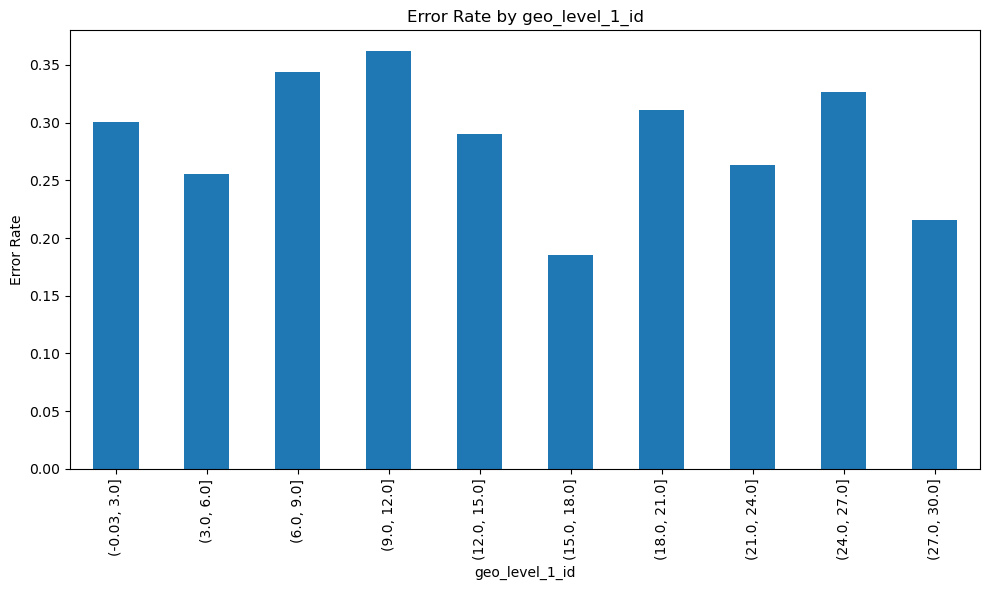

Sample counts for geo_level_1_id:
geo_level_1_id
(-0.03, 3.0]    3109
(3.0, 6.0]      8263
(6.0, 9.0]      8341
(9.0, 12.0]     6671
(12.0, 15.0]    2654
(15.0, 18.0]    5935
(18.0, 21.0]    6540
(21.0, 24.0]    1721
(24.0, 27.0]    8255
(27.0, 30.0]     632
dtype: int64




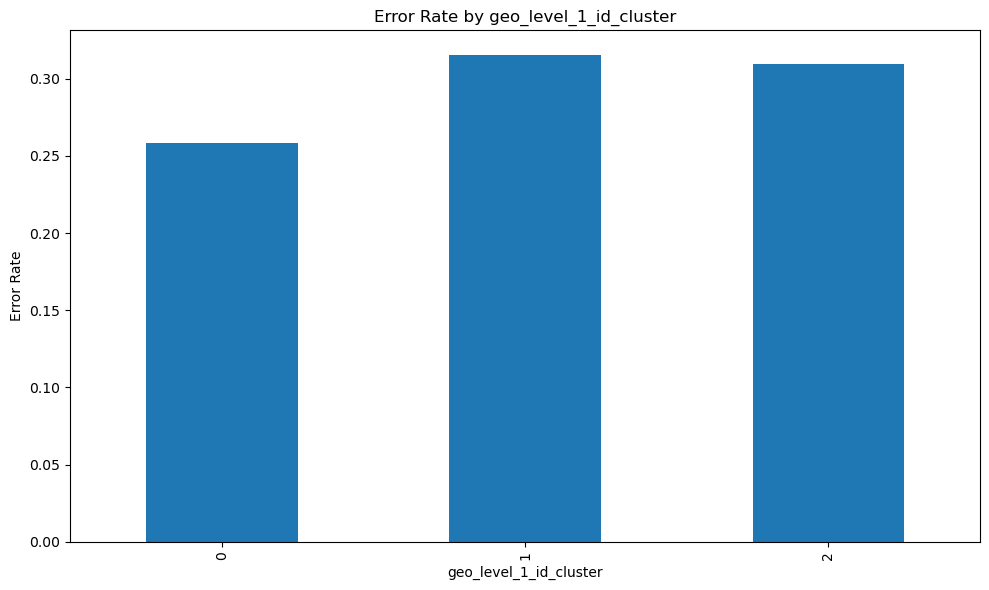

Sample counts for geo_level_1_id_cluster:
geo_level_1_id_cluster
0    15129
1    26384
2    10608
dtype: int64




/var/folders/m7/tzk7gpbd05j79z_hsb25z6jm0000gn/T/ipykernel_23921/3412442567.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  error_by_feature = error_df.groupby(bins)['is_error'].mean()
/var/folders/m7/tzk7gpbd05j79z_hsb25z6jm0000gn/T/ipykernel_23921/3412442567.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sample_counts = error_df.groupby(bins).size()


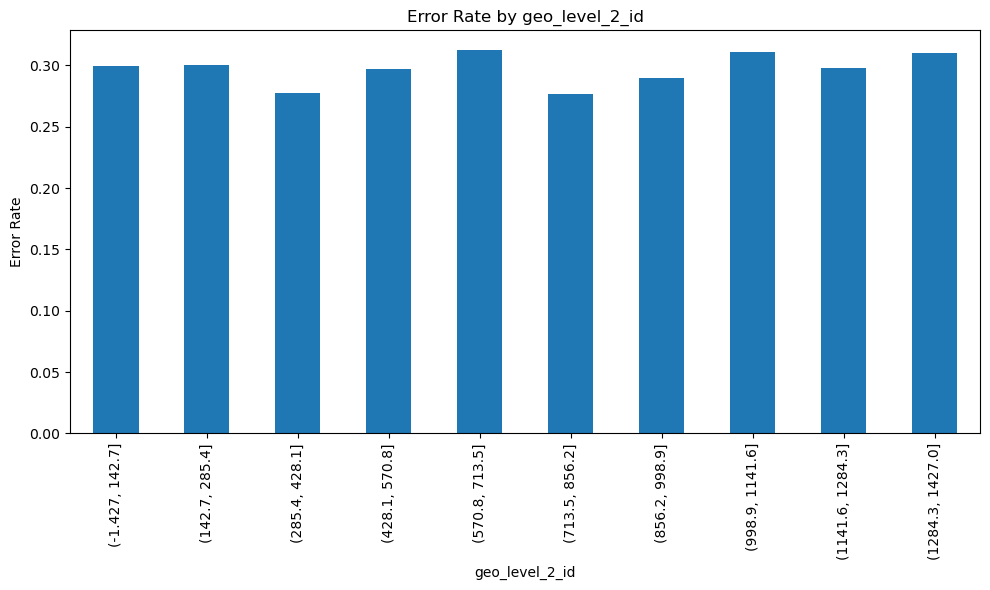

Sample counts for geo_level_2_id:
geo_level_2_id
(-1.427, 142.7]     5250
(142.7, 285.4]      6188
(285.4, 428.1]      4727
(428.1, 570.8]      5357
(570.8, 713.5]      5166
(713.5, 856.2]      5001
(856.2, 998.9]      5026
(998.9, 1141.6]     5758
(1141.6, 1284.3]    4816
(1284.3, 1427.0]    4832
dtype: int64




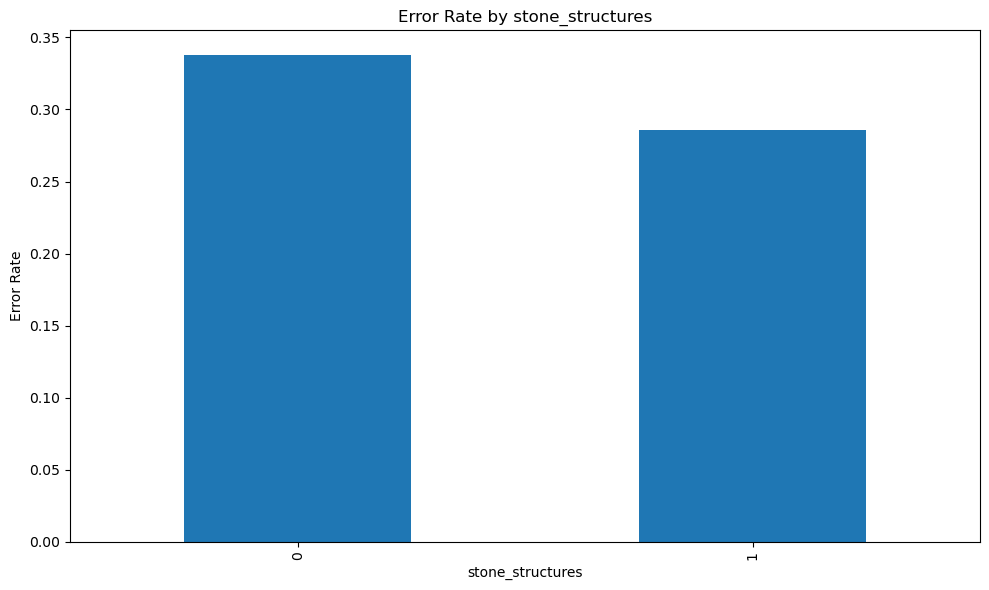

Sample counts for stone_structures:
stone_structures
0    11946
1    40175
dtype: int64




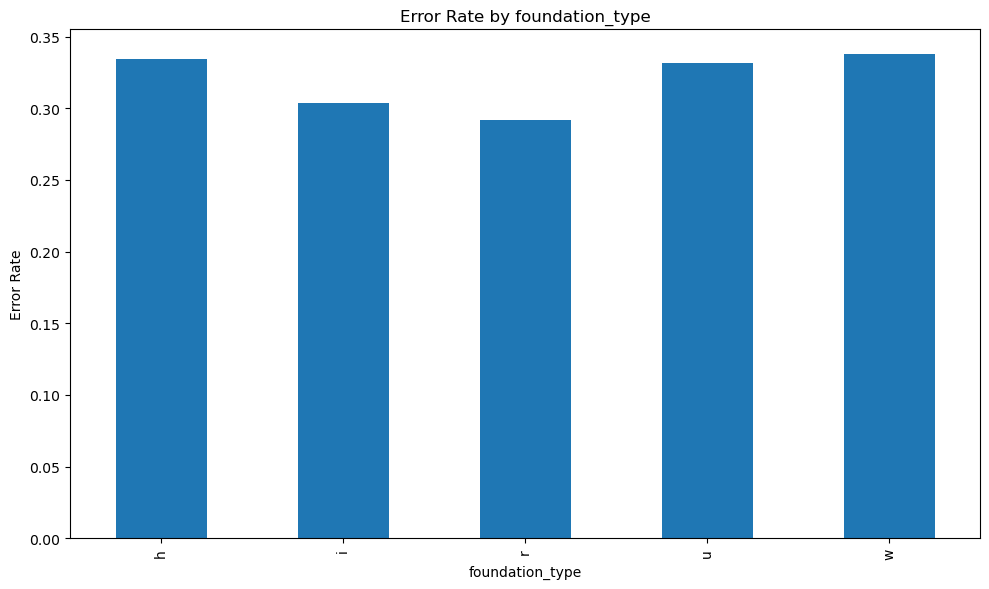

Sample counts for foundation_type:
foundation_type
h      299
i     2106
r    43783
u     2849
w     3084
dtype: int64




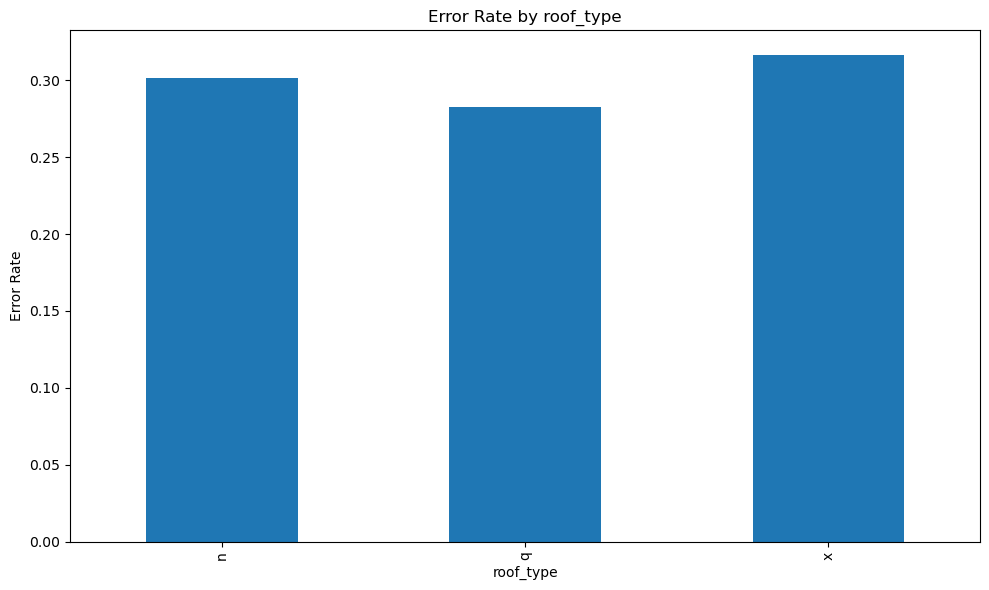

Sample counts for roof_type:
roof_type
n    36521
q    12337
x     3263
dtype: int64




/var/folders/m7/tzk7gpbd05j79z_hsb25z6jm0000gn/T/ipykernel_23921/3412442567.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  error_by_feature = error_df.groupby(bins)['is_error'].mean()
/var/folders/m7/tzk7gpbd05j79z_hsb25z6jm0000gn/T/ipykernel_23921/3412442567.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sample_counts = error_df.groupby(bins).size()


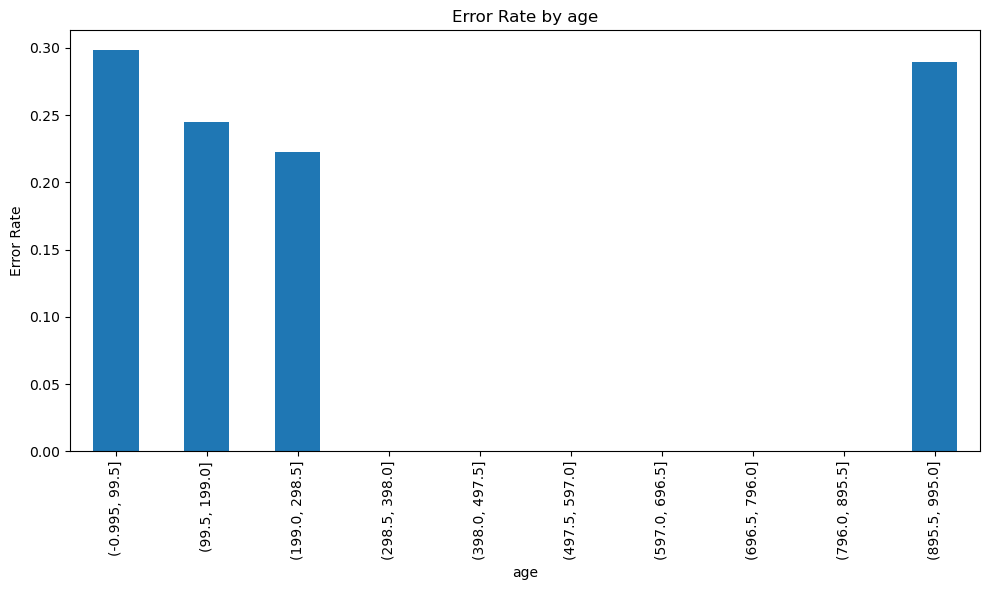

Sample counts for age:
age
(-0.995, 99.5]    51435
(99.5, 199.0]       388
(199.0, 298.5]       18
(298.5, 398.0]        0
(398.0, 497.5]        0
(497.5, 597.0]        0
(597.0, 696.5]        0
(696.5, 796.0]        0
(796.0, 895.5]        0
(895.5, 995.0]      280
dtype: int64




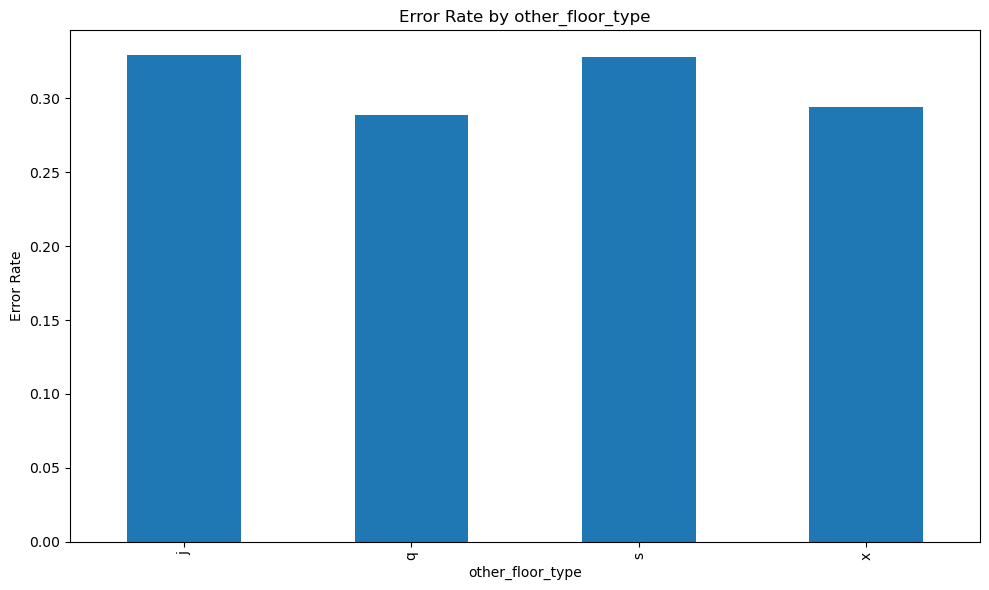

Sample counts for other_floor_type:
other_floor_type
j     7933
q    33228
s     2365
x     8595
dtype: int64




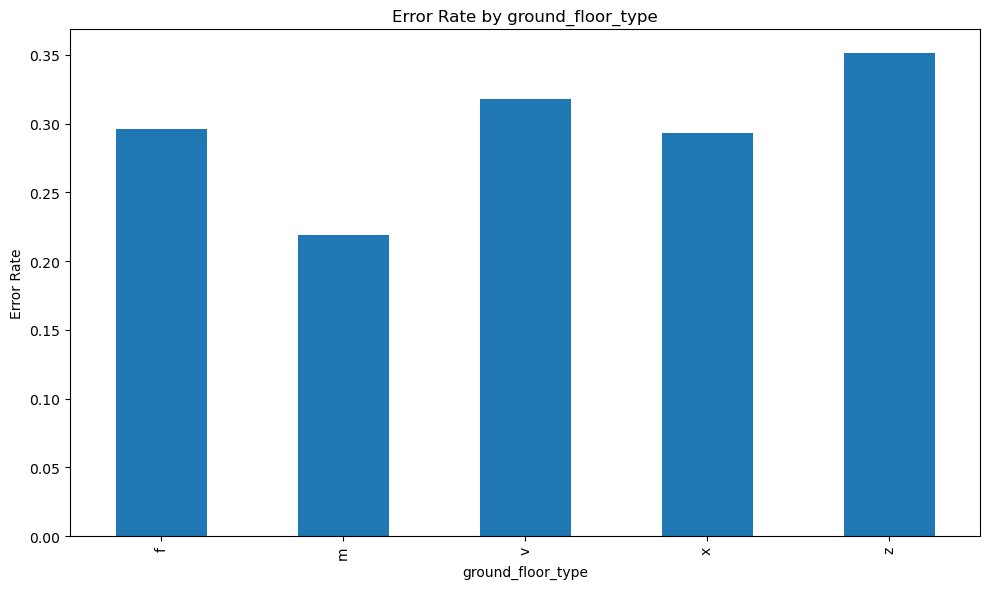

Sample counts for ground_floor_type:
ground_floor_type
f    42068
m      105
v     4950
x     4790
z      208
dtype: int64




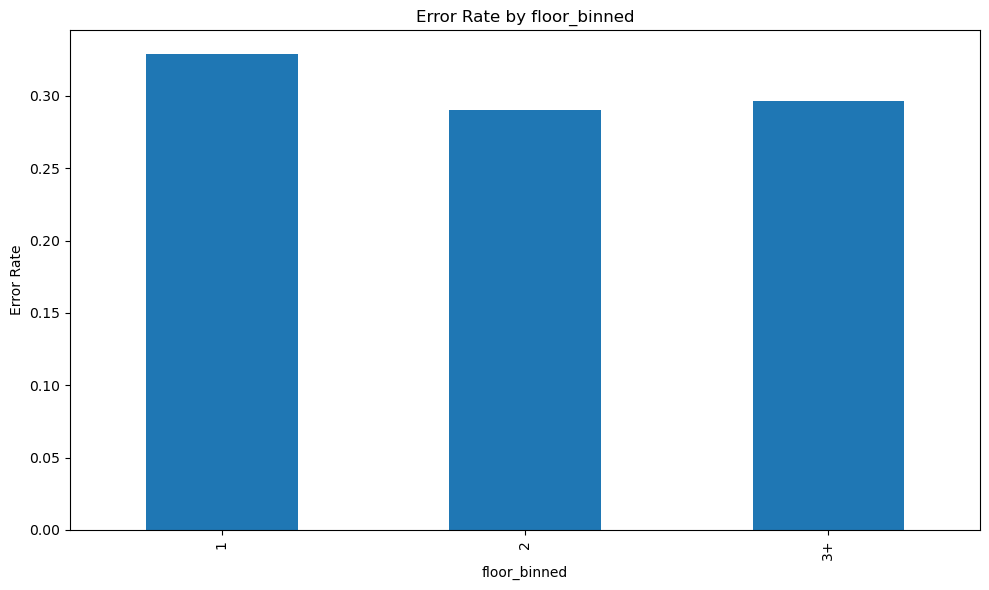

Sample counts for floor_binned:
floor_binned
1      8035
2     31461
3+    12625
dtype: int64




In [98]:
for feature in available_top_features:
    plt.figure(figsize=(10, 6))
    
    is_numeric = np.issubdtype(X_test[feature].dtype, np.number)
    
    if is_numeric and X_test[feature].nunique() > 10:
        bins = pd.cut(error_df[feature], bins=10)
        error_by_feature = error_df.groupby(bins)['is_error'].mean()
        sample_counts = error_df.groupby(bins).size()
    else:
        error_by_feature = error_df.groupby(feature)['is_error'].mean()
        sample_counts = error_df.groupby(feature).size()
    
    error_by_feature.plot(kind='bar')
    plt.title(f'Error Rate by {feature}')
    plt.ylabel('Error Rate')
    plt.xlabel(feature)
    plt.tight_layout()
    plt.show()
    
    print(f"Sample counts for {feature}:")
    print(sample_counts)
    print("\n")

# Error Rate findings:

1. **Ground Floor Type**: The 'm' (mud) ground floor type has a noticeably lower error rate (~27%) compared to other types (35-39%). This suggests the model is better at predicting damage for buildings with mud floors.

2. **Position**: Buildings in position 'o' have the lowest error rate (~30%), while those in positions 's' and 't' have higher error rates (~36-37%). This geographic positioning seems meaningful.

3. **Other Floor Type**: Type 'q' has the lowest error rate (~35%) compared to 'j', 's', and 'x' which have higher rates (~37-40%).

4. **Geographic Clusters**: Both geo_level_1 and geo_level_2 cluster 0 have higher error rates than clusters 1 and 2, suggesting regional differences in prediction accuracy.

5. **Floor Count**: Lower floors (binned as '1') have a higher error rate (~40%) than multi-floor buildings ('2' and '3+' have ~36%).

In [99]:
    simple_cat_model = CatBoostClassifier(
        learning_rate=0.03,
        l2_leaf_reg=3,
        iterations=100,
        grow_policy='SymmetricTree',
        depth=8,
        loss_function='MultiClass',
        random_seed=42,
        cat_features=cat_features
    )

0:	learn: 1.0836387	total: 282ms	remaining: 27.9s
0:	learn: 1.0839552	total: 300ms	remaining: 29.7s
1:	learn: 1.0697677	total: 406ms	remaining: 19.9s
1:	learn: 1.0706532	total: 609ms	remaining: 29.8s
0:	learn: 1.0812719	total: 639ms	remaining: 1m 3s
0:	learn: 1.0815092	total: 632ms	remaining: 1m 2s
2:	learn: 1.0557811	total: 798ms	remaining: 25.8s
2:	learn: 1.0564538	total: 923ms	remaining: 29.8s
3:	learn: 1.0427175	total: 1.01s	remaining: 24.3s
0:	learn: 1.0821155	total: 850ms	remaining: 1m 24s
0:	learn: 1.0822879	total: 856ms	remaining: 1m 24s
1:	learn: 1.0653046	total: 1.21s	remaining: 59.4s
3:	learn: 1.0439498	total: 1.23s	remaining: 29.6s
4:	learn: 1.0295276	total: 1.32s	remaining: 25s
1:	learn: 1.0651177	total: 1.37s	remaining: 1m 7s
4:	learn: 1.0329907	total: 1.52s	remaining: 28.9s
2:	learn: 1.0521810	total: 1.56s	remaining: 50.4s
5:	learn: 1.0176779	total: 1.61s	remaining: 25.2s
5:	learn: 1.0228809	total: 1.81s	remaining: 28.4s
2:	learn: 1.0506179	total: 1.9s	remaining: 1m 1s
0

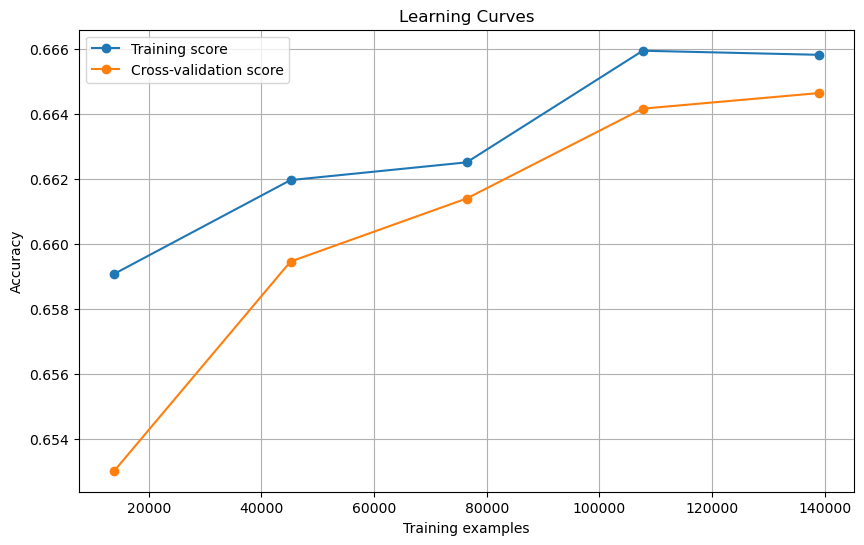

In [100]:
from sklearn.model_selection import learning_curve


try:
    simple_cat_model = CatBoostClassifier(
        learning_rate=0.03,
        l2_leaf_reg=3,
        iterations=100,
        grow_policy='SymmetricTree',
        depth=8,
        loss_function='MultiClass',
        random_seed=42,
        cat_features=cat_features
    )

    train_sizes, train_scores, test_scores = learning_curve(
        simple_cat_model, 
        X_train, 
        y_train, 
        cv=3,  
        scoring='accuracy', 
        train_sizes=np.linspace(0.1, 1.0, 5),
        n_jobs=-1 
    )

    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, np.mean(train_scores, axis=1), 'o-', label='Training score')
    plt.plot(train_sizes, np.mean(test_scores, axis=1), 'o-', label='Cross-validation score')
    plt.xlabel('Training examples')
    plt.ylabel('Accuracy')
    plt.title('Learning Curves')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()
    
except Exception as e:
    print(f"Error computing learning curves: {e}")
    print("Let's try an alternative approach for analyzing model performance:")
    
    class_errors = {}
    for class_idx in range(3):  
        class_samples = error_df[error_df['actual'] == class_idx]
        class_errors[class_idx] = len(class_samples[class_samples['is_error']]) / len(class_samples) if len(class_samples) > 0 else 0
    
    plt.figure(figsize=(8, 6))
    plt.bar(class_errors.keys(), class_errors.values())
    plt.xlabel('Class')
    plt.ylabel('Error Rate')
    plt.title('Error Rate by Class')
    plt.xticks(list(class_errors.keys()))
    plt.show()

In [110]:
simple_cat_model.fit(X_train, y_train)

simple_y_train_pred = simple_cat_model.predict(X_train)
simple_y_test_pred = simple_cat_model.predict(X_test)

simple_cat_train_accuracy = accuracy_score(y_train, simple_y_train_pred)
simple_cat_test_accuracy = accuracy_score(y_test, simple_y_test_pred)

print(f"CatBoost Training Accuracy: {simple_cat_train_accuracy:.4f}")
print(f"CatBoost Test Accuracy: {simple_cat_test_accuracy:.4f}")

0:	learn: 1.0806086	total: 333ms	remaining: 33s
1:	learn: 1.0641931	total: 529ms	remaining: 25.9s
2:	learn: 1.0486851	total: 1.06s	remaining: 34.3s
3:	learn: 1.0336993	total: 1.28s	remaining: 30.8s
4:	learn: 1.0201543	total: 1.65s	remaining: 31.3s
5:	learn: 1.0071981	total: 1.84s	remaining: 28.9s
6:	learn: 0.9951250	total: 2.04s	remaining: 27.2s
7:	learn: 0.9834447	total: 2.29s	remaining: 26.3s
8:	learn: 0.9723651	total: 2.48s	remaining: 25.1s
9:	learn: 0.9619050	total: 2.67s	remaining: 24s
10:	learn: 0.9515650	total: 2.85s	remaining: 23.1s
11:	learn: 0.9417604	total: 3.04s	remaining: 22.3s
12:	learn: 0.9329352	total: 3.23s	remaining: 21.6s
13:	learn: 0.9241314	total: 3.46s	remaining: 21.2s
14:	learn: 0.9158532	total: 3.65s	remaining: 20.7s
15:	learn: 0.9078290	total: 3.85s	remaining: 20.2s
16:	learn: 0.9002895	total: 4.05s	remaining: 19.8s
17:	learn: 0.8932718	total: 4.25s	remaining: 19.4s
18:	learn: 0.8864600	total: 4.44s	remaining: 18.9s
19:	learn: 0.8800471	total: 4.63s	remaining: 

In [124]:
print("\nSimple CatBoost Classification Report:")
print(classification_report(y_test, simple_y_test_pred))


Simple CatBoost Classification Report:
              precision    recall  f1-score   support

           1       0.67      0.29      0.41      5025
           2       0.65      0.89      0.76     29652
           3       0.73      0.40      0.52     17444

    accuracy                           0.67     52121
   macro avg       0.69      0.53      0.56     52121
weighted avg       0.68      0.67      0.64     52121



In [104]:
class_weights = {
    1: 5.0,
    2: 0.5,
    3: 5.0
}
        
print("Class weight:", class_weights)

Class weight: {1: 5.0, 2: 0.5, 3: 5.0}


In [113]:
weighted_cat_model = CatBoostClassifier(
    learning_rate=0.05,
    l2_leaf_reg=3,
    iterations=500,
    grow_policy='SymmetricTree',
    depth=6,
    random_seed=42,
    cat_features=cat_features,
)

weighted_cat_model.fit(X_train, y_train)

weighted_y_train_pred = weighted_cat_model.predict(X_train)
weighted_y_test_pred = weighted_cat_model.predict(X_test)

weighted_cat_train_accuracy = accuracy_score(y_train, weighted_y_train_pred)
weighted_cat_test_accuracy = accuracy_score(y_test, weighted_y_test_pred)

print(f"CatBoost Training Accuracy: {weighted_cat_train_accuracy:.4f}")
print(f"CatBoost Test Accuracy: {weighted_cat_test_accuracy:.4f}")

0:	learn: 1.0708821	total: 478ms	remaining: 3m 58s
1:	learn: 1.0458443	total: 1.53s	remaining: 6m 21s
2:	learn: 1.0232266	total: 1.96s	remaining: 5m 24s
3:	learn: 1.0024237	total: 2.29s	remaining: 4m 44s
4:	learn: 0.9834018	total: 2.62s	remaining: 4m 19s
5:	learn: 0.9667225	total: 2.94s	remaining: 4m 2s
6:	learn: 0.9513898	total: 3.27s	remaining: 3m 50s
7:	learn: 0.9368601	total: 3.61s	remaining: 3m 42s
8:	learn: 0.9234113	total: 3.95s	remaining: 3m 35s
9:	learn: 0.9112576	total: 4.3s	remaining: 3m 30s
10:	learn: 0.8994449	total: 4.63s	remaining: 3m 25s
11:	learn: 0.8885467	total: 4.95s	remaining: 3m 21s
12:	learn: 0.8785335	total: 5.27s	remaining: 3m 17s
13:	learn: 0.8688361	total: 5.64s	remaining: 3m 15s
14:	learn: 0.8596972	total: 5.99s	remaining: 3m 13s
15:	learn: 0.8517199	total: 6.3s	remaining: 3m 10s
16:	learn: 0.8446036	total: 6.62s	remaining: 3m 8s
17:	learn: 0.8373576	total: 7.06s	remaining: 3m 8s
18:	learn: 0.8306132	total: 7.44s	remaining: 3m 8s
19:	learn: 0.8248562	total: 

In [125]:
print("\nWeighted CatBoost Classification Report:")
print(classification_report(y_test, weighted_y_test_pred))


Weighted CatBoost Classification Report:
              precision    recall  f1-score   support

           1       0.67      0.40      0.50      5025
           2       0.70      0.85      0.77     29652
           3       0.73      0.54      0.62     17444

    accuracy                           0.70     52121
   macro avg       0.70      0.60      0.63     52121
weighted avg       0.70      0.70      0.69     52121



## Improvement Strategies

1. **Feature Engineering**:
   - Create interaction features between floor types and structural features
   - Add feature combinations between geo clusters and building materials
   - Develop a "structural vulnerability score" combining key building characteristics

2. **Geographic-Specific Models**:
   - Consider training separate models for different geographic clusters
   - Use ensemble techniques that weight predictions differently by region

3. **Floor-Specific Features**:
   - Add more granular features around the floor characteristics
   - Create composite features that capture relationships between floor types and building height

4. **Specialized Treatment for High-Error Categories**:
   - Apply more aggressive balancing techniques specifically for categories with high error rates
   - Consider using boosting techniques that focus more on frequently misclassified examples

5. **Structural Material Analysis**:
   - The wood/stone structure differences seem minimal but could be combined with other features
   - Develop more nuanced features around material quality or combinations

6. **Class-Specific Training**:
   - Instead of generic class weighting, use different hyperparameters for each damage class
   - Consider a hierarchical classification approach that first predicts broad damage levels, then refines

# Feature Engineering:
    - Binning floor types and structural features, ex. ground_floor_type and floor_binned
    - Feature combinations between region cluster (geo_level_cluster) and building materials (ex. wood, stone, mud)
    - Combine key building characteristics

# Refining previous engineered features based on Error Rate findings. Each refined engineered feature will have it's own model to track the progress of the feature engineering.
1. age_binned will have refined bins
2. geo_level_1_cluster_id will have refined bins
3. 

In [114]:
def age_bins(age):
    if age <= 99.5:
        return 1
    elif age <= 199.0:
        return 2
    elif age <= 398.0:
        return 3
    elif age <= 895.5:
        return 4
    else:
        return 5
    
X_train['age_binned'] = X_train['age'].apply(age_bins)
X_test['age_binned'] = X_test['age'].apply(age_bins)

In [115]:
num_features = X_train.select_dtypes(include=['int64', 'float64']).columns.tolist()
cat_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()

In [116]:
age_cat_model = CatBoostClassifier(
    learning_rate=0.05,
    l2_leaf_reg=3,
    iterations=500,
    grow_policy='SymmetricTree',
    depth=6,
    random_seed=42,
    cat_features=cat_features,
)

age_cat_model.fit(X_train, y_train)

age_y_train_pred = age_cat_model.predict(X_train)
age_y_test_pred = age_cat_model.predict(X_test)

age_cat_train_accuracy = accuracy_score(y_train, age_y_train_pred)
age_cat_test_accuracy = accuracy_score(y_test, age_y_test_pred)

print(f"CatBoost Training Accuracy: {age_cat_train_accuracy:.4f}")
print(f"CatBoost Test Accuracy: {age_cat_test_accuracy:.4f}")

0:	learn: 1.0711741	total: 398ms	remaining: 3m 18s
1:	learn: 1.0463985	total: 750ms	remaining: 3m 6s
2:	learn: 1.0234087	total: 1.04s	remaining: 2m 52s
3:	learn: 1.0030050	total: 1.42s	remaining: 2m 56s
4:	learn: 0.9844670	total: 1.77s	remaining: 2m 55s
5:	learn: 0.9678086	total: 2.08s	remaining: 2m 51s
6:	learn: 0.9516422	total: 2.38s	remaining: 2m 47s
7:	learn: 0.9376986	total: 2.69s	remaining: 2m 45s
8:	learn: 0.9247815	total: 2.98s	remaining: 2m 42s
9:	learn: 0.9123389	total: 3.26s	remaining: 2m 39s
10:	learn: 0.9011886	total: 3.54s	remaining: 2m 37s
11:	learn: 0.8908055	total: 3.86s	remaining: 2m 37s
12:	learn: 0.8806614	total: 4.53s	remaining: 2m 49s
13:	learn: 0.8706112	total: 4.91s	remaining: 2m 50s
14:	learn: 0.8618370	total: 5.23s	remaining: 2m 49s
15:	learn: 0.8539214	total: 5.54s	remaining: 2m 47s
16:	learn: 0.8465539	total: 5.81s	remaining: 2m 45s
17:	learn: 0.8394281	total: 6.12s	remaining: 2m 43s
18:	learn: 0.8328847	total: 6.4s	remaining: 2m 42s
19:	learn: 0.8267380	tot

In [126]:
print("\nAge CatBoost Classification Report:")
print(classification_report(y_test, age_y_test_pred))


Age CatBoost Classification Report:
              precision    recall  f1-score   support

           1       0.67      0.40      0.50      5025
           2       0.70      0.85      0.77     29652
           3       0.73      0.54      0.62     17444

    accuracy                           0.70     52121
   macro avg       0.70      0.60      0.63     52121
weighted avg       0.71      0.70      0.69     52121



In [117]:
def geo_level_1_error_bins(geo_id):
    if 15.0 <= geo_id < 18.0:
        return 1
    elif geo_id in [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 18.0, 19.0, 20.0, 27.0, 28.0, 29.0]:
        return 2
    elif geo_id in [6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0]:
        return 3
    else:
        return 4
    
X_train['geo_level_1_id_cluster'] = X_train['geo_level_1_id'].apply(geo_level_1_error_bins)
X_test['geo_level_1_id_cluster'] = X_test['geo_level_1_id'].apply(geo_level_1_error_bins)

In [118]:
num_features = X_train.select_dtypes(include=['int64', 'float64']).columns.tolist()
cat_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()

In [119]:
geo_cat_model = CatBoostClassifier(
    learning_rate=0.05,
    l2_leaf_reg=3,
    iterations=500,
    grow_policy='SymmetricTree',
    depth=6,
    random_seed=42,
    cat_features=cat_features,
)

geo_cat_model.fit(X_train, y_train)

geo_y_train_pred = geo_cat_model.predict(X_train)
geo_y_test_pred = geo_cat_model.predict(X_test)

geo_cat_train_accuracy = accuracy_score(y_train, geo_y_train_pred)
geo_cat_test_accuracy = accuracy_score(y_test, geo_y_test_pred)

print(f"CatBoost Training Accuracy: {geo_cat_train_accuracy:.4f}")
print(f"CatBoost Test Accuracy: {geo_cat_test_accuracy:.4f}")

0:	learn: 1.0698890	total: 358ms	remaining: 2m 58s
1:	learn: 1.0440705	total: 723ms	remaining: 2m 59s
2:	learn: 1.0208311	total: 1.02s	remaining: 2m 48s
3:	learn: 0.9997588	total: 1.35s	remaining: 2m 47s
4:	learn: 0.9822208	total: 1.69s	remaining: 2m 47s
5:	learn: 0.9654986	total: 2.03s	remaining: 2m 47s
6:	learn: 0.9498270	total: 2.38s	remaining: 2m 47s
7:	learn: 0.9358271	total: 2.73s	remaining: 2m 47s
8:	learn: 0.9229100	total: 3.25s	remaining: 2m 57s
9:	learn: 0.9109055	total: 3.6s	remaining: 2m 56s
10:	learn: 0.8984875	total: 3.94s	remaining: 2m 55s
11:	learn: 0.8880940	total: 4.26s	remaining: 2m 53s
12:	learn: 0.8774147	total: 4.56s	remaining: 2m 50s
13:	learn: 0.8684060	total: 4.9s	remaining: 2m 50s
14:	learn: 0.8599907	total: 5.27s	remaining: 2m 50s
15:	learn: 0.8522324	total: 5.58s	remaining: 2m 48s
16:	learn: 0.8450057	total: 5.87s	remaining: 2m 46s
17:	learn: 0.8383329	total: 6.18s	remaining: 2m 45s
18:	learn: 0.8319362	total: 6.52s	remaining: 2m 45s
19:	learn: 0.8259786	tot

In [127]:
print("\nGeo CatBoost Classification Report:")
print(classification_report(y_test, geo_y_test_pred))


Geo CatBoost Classification Report:
              precision    recall  f1-score   support

           1       0.67      0.40      0.50      5025
           2       0.70      0.85      0.77     29652
           3       0.73      0.54      0.62     17444

    accuracy                           0.70     52121
   macro avg       0.70      0.60      0.63     52121
weighted avg       0.71      0.70      0.69     52121



In [120]:
print(f"Previous model test accuracy: {cat_test_accuracy:.4f}")
print(f"Improvement: {(geo_cat_test_accuracy - cat_test_accuracy) * 100:.2f}%")

Previous model test accuracy: 0.7023
Improvement: 0.13%


In [129]:
def ground_floor_error_encoding(floor_type):
    if floor_type == 'm':
        return 1
    elif floor_type == 'f' or floor_type == 'x':
        return 2
    elif floor_type == 'v':
        return 3
    elif floor_type == 'z':
        return 4
    else:
        return 3
    
X_train['ground_floor_type_encoded'] = X_train['ground_floor_type'].apply(ground_floor_error_encoding)
X_test['ground_floor_type_encoded'] = X_test['ground_floor_type'].apply(ground_floor_error_encoding)

In [130]:
X_train['floor_high_risk'] = (X_train['floor_binned'] == 1).astype(int)
X_test['floor_high_risk'] = (X_test['floor_binned'] == 1).astype(int)

X_train['floor_combined_risk'] = X_train['ground_floor_type_encoded'] * X_train['floor_high_risk']
X_test['floor_combined_risk'] = X_test['ground_floor_type_encoded'] * X_test['floor_high_risk']

In [132]:
X_train = X_train.drop(columns=['building_id', 'count_families', 'has_superstructure_other'])
X_test = X_test.drop(columns=['building_id', 'count_families', 'has_superstructure_other'])

In [133]:
num_features = X_train.select_dtypes(include=['int64', 'float64']).columns.tolist()
cat_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()

In [134]:
floor_cat_model = CatBoostClassifier(
    learning_rate=0.05,
    l2_leaf_reg=3,
    iterations=500,
    grow_policy='SymmetricTree',
    depth=6,
    random_seed=42,
    cat_features=cat_features,
)

floor_cat_model.fit(X_train, y_train)

floor_y_train_pred = floor_cat_model.predict(X_train)
floor_y_test_pred = floor_cat_model.predict(X_test)

floor_cat_train_accuracy = accuracy_score(y_train, floor_y_train_pred)
floor_cat_test_accuracy = accuracy_score(y_test, floor_y_test_pred)

print(f"CatBoost Training Accuracy: {floor_cat_train_accuracy:.4f}")
print(f"CatBoost Test Accuracy: {floor_cat_test_accuracy:.4f}")

0:	learn: 1.0711575	total: 515ms	remaining: 4m 16s
1:	learn: 1.0470187	total: 920ms	remaining: 3m 49s
2:	learn: 1.0232046	total: 1.26s	remaining: 3m 28s
3:	learn: 1.0033854	total: 1.67s	remaining: 3m 26s
4:	learn: 0.9835768	total: 2.5s	remaining: 4m 7s
5:	learn: 0.9664251	total: 3.03s	remaining: 4m 9s
6:	learn: 0.9498282	total: 3.31s	remaining: 3m 53s
7:	learn: 0.9351261	total: 3.66s	remaining: 3m 44s
8:	learn: 0.9223465	total: 3.96s	remaining: 3m 35s
9:	learn: 0.9101770	total: 4.24s	remaining: 3m 27s
10:	learn: 0.8980016	total: 4.62s	remaining: 3m 25s
11:	learn: 0.8866833	total: 4.91s	remaining: 3m 19s
12:	learn: 0.8768097	total: 5.2s	remaining: 3m 14s
13:	learn: 0.8675306	total: 5.53s	remaining: 3m 12s
14:	learn: 0.8577474	total: 5.86s	remaining: 3m 9s
15:	learn: 0.8497616	total: 6.23s	remaining: 3m 8s
16:	learn: 0.8424072	total: 6.56s	remaining: 3m 6s
17:	learn: 0.8353528	total: 6.91s	remaining: 3m 4s
18:	learn: 0.8286789	total: 7.22s	remaining: 3m 2s
19:	learn: 0.8219284	total: 7.5

X_train['ground_floor_height'] = X_train['ground_floor_type'] + '_' + X_train['floor_binned'].astype(str)
X_test['ground_floor_height'] = X_test['ground_floor_type'] + '_' + X_test['floor_binned'].astype(str)

In [135]:
print("\nFloor CatBoost Classification Report:")
print(classification_report(y_test, floor_y_test_pred))


Floor CatBoost Classification Report:
              precision    recall  f1-score   support

           1       0.67      0.40      0.50      5025
           2       0.70      0.85      0.77     29652
           3       0.73      0.55      0.62     17444

    accuracy                           0.70     52121
   macro avg       0.70      0.60      0.63     52121
weighted avg       0.71      0.70      0.69     52121



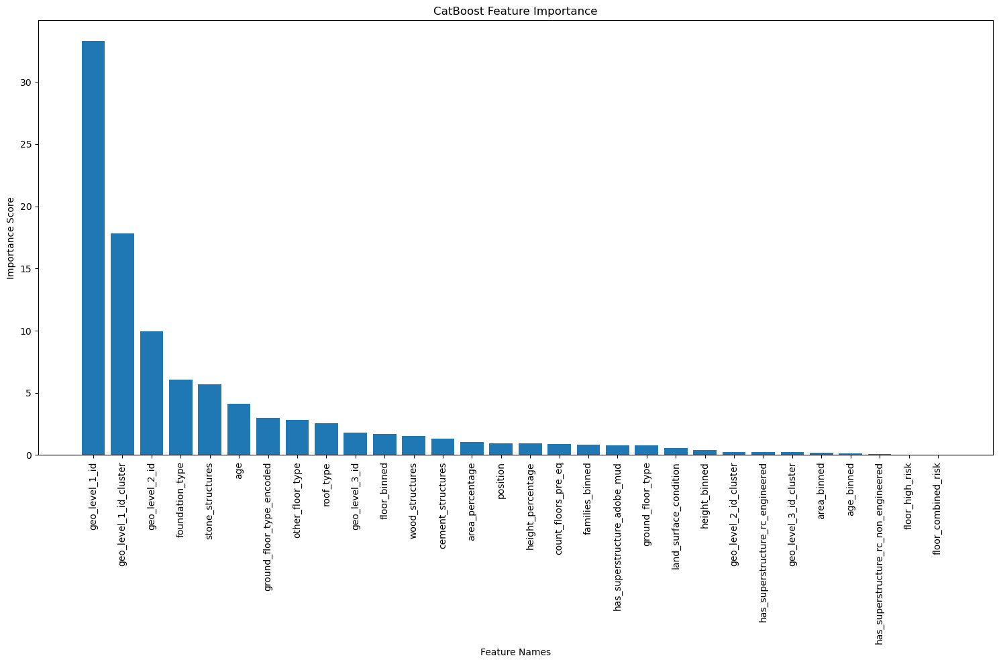

In [136]:
cat_feature_importances = floor_cat_model.get_feature_importance()
feature_names_out = []

original_feature_names = list(X_train.columns)
feature_names_out = original_feature_names

cat_indices = np.argsort(cat_feature_importances)[::-1]

plt.figure(figsize=(15, 10))
plt.title("CatBoost Feature Importance")
plt.bar(range(len(cat_feature_importances)), cat_feature_importances[cat_indices], align="center")

if len(feature_names_out) == len(cat_feature_importances):
    plt.xticks(range(len(cat_feature_importances)), [feature_names_out[i] for i in cat_indices], rotation=90)
else:
    plt.xticks(range(len(cat_feature_importances)), range(len(cat_feature_importances)), rotation=90)

plt.xticks(range(len(cat_feature_importances)), [feature_names_out[i] for i in cat_indices], rotation=90)
plt.xlabel("Feature Names")
plt.ylabel("Importance Score")
plt.tight_layout()
plt.show()

In [147]:
floor_cat_model._get_cat_feature_indices()

[7, 8, 9, 10, 11, 12, 23, 24, 25, 26]

In [177]:
X_train['stone_structure_risk'] = X_train['stone_structures'].apply(lambda x: 1.2 if x == 0 else 1.0)
X_test['stone_structure_risk'] = X_test['stone_structures'].apply(lambda x: 1.2 if x == 0 else 1.0)

In [178]:
def foundation_risk_encoding(f_type):
    if f_type == 2:
        return 1
    elif f_type == 3:
        return 2
    elif f_type in [1, 4]:
        return 3
    else:
        return 2
    
X_train['foundation_risk'] = X_train['foundation_type'].apply(foundation_risk_encoding)
X_test['foundation_risk'] = X_test['foundation_type'].apply(foundation_risk_encoding)

In [179]:
def roof_risk_encoding(r_type):
    if r_type == 'v':
        return 1
    elif r_type == 'f':
        return 2
    elif r_type == 'x':
        return 3
    else:
        return 2
    
X_train['roof_risk'] = X_train['roof_type'].apply(roof_risk_encoding)
X_test['roof_risk'] = X_test['roof_type'].apply(roof_risk_encoding)

In [180]:
num_features = X_train.select_dtypes(include=['int64', 'float64']).columns.tolist()
cat_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()

In [181]:
structural_model = CatBoostClassifier(
    learning_rate=0.05,
    l2_leaf_reg=3,
    iterations=500,
    grow_policy='SymmetricTree',
    depth=6,
    random_seed=42,
    cat_features=cat_features,
)

structural_model.fit(X_train, y_train)

structural_y_train_pred = structural_model.predict(X_train)
structural_y_test_pred = structural_model.predict(X_test)

structural_train_accuracy = accuracy_score(y_train, structural_y_train_pred)
structural_test_accuracy = accuracy_score(y_test, structural_y_test_pred)

print(f"Structural Training Accuracy: {structural_train_accuracy:.4f}")
print(f"Structural Test Accuracy: {structural_test_accuracy:.4f}")

0:	learn: 1.0696419	total: 484ms	remaining: 4m 1s
1:	learn: 1.0436798	total: 1.44s	remaining: 5m 59s
2:	learn: 1.0219380	total: 2.18s	remaining: 6m 1s
3:	learn: 1.0016647	total: 2.53s	remaining: 5m 14s
4:	learn: 0.9820842	total: 2.85s	remaining: 4m 42s
5:	learn: 0.9656413	total: 3.17s	remaining: 4m 21s
6:	learn: 0.9499678	total: 3.52s	remaining: 4m 7s
7:	learn: 0.9356380	total: 3.87s	remaining: 3m 57s
8:	learn: 0.9226587	total: 4.21s	remaining: 3m 49s
9:	learn: 0.9102013	total: 4.54s	remaining: 3m 42s
10:	learn: 0.8992666	total: 4.92s	remaining: 3m 38s
11:	learn: 0.8876845	total: 5.23s	remaining: 3m 32s
12:	learn: 0.8781543	total: 5.64s	remaining: 3m 31s
13:	learn: 0.8682238	total: 6.02s	remaining: 3m 29s
14:	learn: 0.8589240	total: 6.36s	remaining: 3m 25s
15:	learn: 0.8512403	total: 6.72s	remaining: 3m 23s
16:	learn: 0.8440203	total: 7.03s	remaining: 3m 19s
17:	learn: 0.8367521	total: 7.36s	remaining: 3m 17s
18:	learn: 0.8299508	total: 7.64s	remaining: 3m 13s
19:	learn: 0.8235299	tota

In [182]:
print("\nStructural Classification Report:")
print(classification_report(y_test, structural_y_test_pred))


Structural Classification Report:
              precision    recall  f1-score   support

           1       0.67      0.39      0.49      5025
           2       0.70      0.85      0.77     29652
           3       0.73      0.55      0.62     17444

    accuracy                           0.70     52121
   macro avg       0.70      0.60      0.63     52121
weighted avg       0.71      0.70      0.69     52121



In [183]:
print(f"Previous model test accuracy: {cat_test_accuracy:.4f}")
print(f"Improvement: {(structural_test_accuracy - cat_test_accuracy) * 100:.2f}%")

Previous model test accuracy: 0.7023
Improvement: 0.19%


In [184]:
X_train['structural_risk_score'] = (
    X_train['stone_structure_risk'] * 
    X_train['foundation_risk'] * 
    X_train['roof_risk']
)
X_test['structural_risk_score'] = (
    X_test['stone_structure_risk'] * 
    X_test['foundation_risk'] * 
    X_test['roof_risk']
)

In [185]:
num_features = X_train.select_dtypes(include=['int64', 'float64']).columns.tolist()
cat_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()

In [186]:
final_structure_model = CatBoostClassifier(
    learning_rate=0.05,
    l2_leaf_reg=5,
    iterations=500,
    grow_policy='SymmetricTree',
    depth=8,
    random_seed=42,
    cat_features=cat_features,
)

final_structure_model.fit(X_train, y_train)

final_y_train_pred = final_structure_model.predict(X_train)
final_y_test_pred = final_structure_model.predict(X_test)

final_train_accuracy = accuracy_score(y_train, final_y_train_pred)
final_test_accuracy = accuracy_score(y_test, final_y_test_pred)

print(f"Structural Training Accuracy: {final_train_accuracy:.4f}")
print(f"Structural Test Accuracy: {final_test_accuracy:.4f}")

0:	learn: 1.0699653	total: 442ms	remaining: 3m 40s
1:	learn: 1.0423886	total: 1.44s	remaining: 5m 58s
2:	learn: 1.0184780	total: 1.96s	remaining: 5m 25s
3:	learn: 0.9965861	total: 2.4s	remaining: 4m 57s
4:	learn: 0.9775790	total: 2.83s	remaining: 4m 39s
5:	learn: 0.9590845	total: 3.24s	remaining: 4m 27s
6:	learn: 0.9424146	total: 3.61s	remaining: 4m 14s
7:	learn: 0.9280305	total: 4.01s	remaining: 4m 6s
8:	learn: 0.9134414	total: 4.42s	remaining: 4m
9:	learn: 0.9007221	total: 4.94s	remaining: 4m 2s
10:	learn: 0.8879155	total: 5.41s	remaining: 4m
11:	learn: 0.8762955	total: 5.88s	remaining: 3m 59s
12:	learn: 0.8652074	total: 6.35s	remaining: 3m 57s
13:	learn: 0.8558114	total: 6.83s	remaining: 3m 57s
14:	learn: 0.8468111	total: 7.3s	remaining: 3m 55s
15:	learn: 0.8387355	total: 7.77s	remaining: 3m 55s
16:	learn: 0.8309309	total: 8.26s	remaining: 3m 54s
17:	learn: 0.8233810	total: 8.8s	remaining: 3m 55s
18:	learn: 0.8168293	total: 9.27s	remaining: 3m 54s
19:	learn: 0.8103960	total: 9.79s	r

In [187]:
print("\nStructural Classification Report:")
print(classification_report(y_test, final_y_test_pred))


Structural Classification Report:
              precision    recall  f1-score   support

           1       0.68      0.42      0.52      5025
           2       0.71      0.85      0.77     29652
           3       0.74      0.56      0.64     17444

    accuracy                           0.71     52121
   macro avg       0.71      0.61      0.64     52121
weighted avg       0.71      0.71      0.70     52121



In [188]:
print(f"Previous model test accuracy: {cat_test_accuracy:.4f}")
print(f"Improvement: {(final_test_accuracy - cat_test_accuracy) * 100:.2f}%")

Previous model test accuracy: 0.7023
Improvement: 0.98%


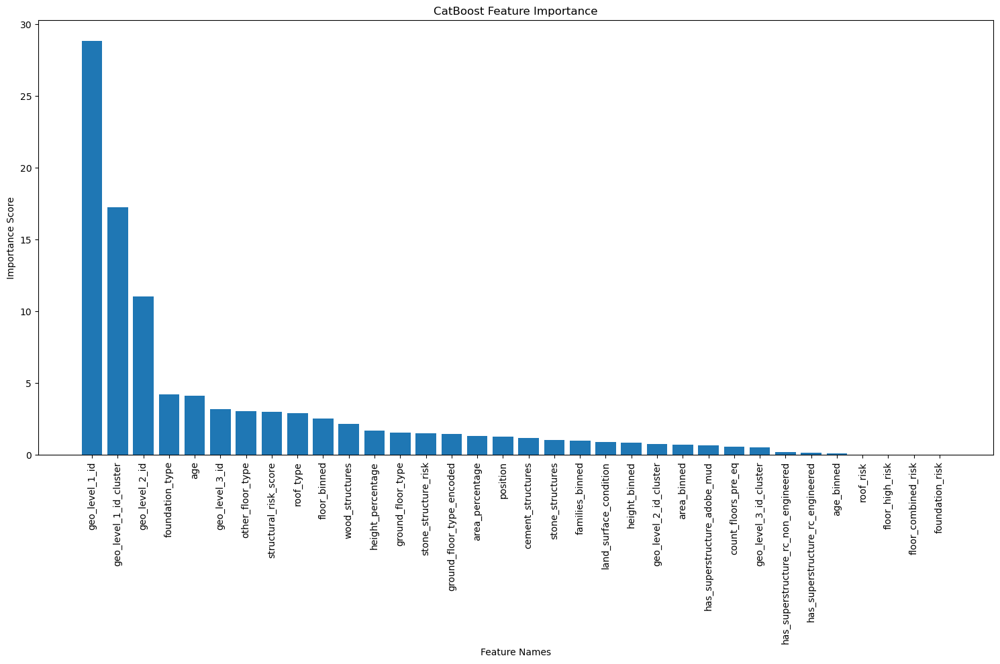

In [189]:
cat_feature_importances = final_structure_model.get_feature_importance()
feature_names_out = []

original_feature_names = list(X_train.columns)
feature_names_out = original_feature_names

cat_indices = np.argsort(cat_feature_importances)[::-1]

plt.figure(figsize=(15, 10))
plt.title("CatBoost Feature Importance")
plt.bar(range(len(cat_feature_importances)), cat_feature_importances[cat_indices], align="center")

if len(feature_names_out) == len(cat_feature_importances):
    plt.xticks(range(len(cat_feature_importances)), [feature_names_out[i] for i in cat_indices], rotation=90)
else:
    plt.xticks(range(len(cat_feature_importances)), range(len(cat_feature_importances)), rotation=90)

plt.xticks(range(len(cat_feature_importances)), [feature_names_out[i] for i in cat_indices], rotation=90)
plt.xlabel("Feature Names")
plt.ylabel("Importance Score")
plt.tight_layout()
plt.show()

# Cross Validation Checks

In [194]:
from sklearn.model_selection import KFold, cross_val_score, cross_validate
from sklearn.metrics import make_scorer, mean_squared_error, accuracy_score, f1_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

n_folds = 5
kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)

In [195]:
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'f1_macro': make_scorer(f1_score, average='macro'),
    'f1_weighted': make_scorer(f1_score, average='weighted'),
    'neg_mse': make_scorer(lambda y, y_pred: -mean_squared_error(y, y_pred))
}

In [196]:
cv_results = cross_validate(
    final_structure_model,
    X_train,
    y_train,
    cv=kf,
    scoring=scoring,
    return_train_score=True,
    return_estimator=True
)

0:	learn: 1.0689711	total: 342ms	remaining: 2m 50s
1:	learn: 1.0420218	total: 691ms	remaining: 2m 52s
2:	learn: 1.0189855	total: 1.02s	remaining: 2m 49s
3:	learn: 0.9963625	total: 1.38s	remaining: 2m 51s
4:	learn: 0.9762685	total: 1.77s	remaining: 2m 55s
5:	learn: 0.9585560	total: 2.07s	remaining: 2m 50s
6:	learn: 0.9412483	total: 2.37s	remaining: 2m 47s
7:	learn: 0.9254096	total: 2.71s	remaining: 2m 46s
8:	learn: 0.9117121	total: 3.48s	remaining: 3m 10s
9:	learn: 0.8983841	total: 3.97s	remaining: 3m 14s
10:	learn: 0.8866153	total: 4.32s	remaining: 3m 11s
11:	learn: 0.8761753	total: 4.68s	remaining: 3m 10s
12:	learn: 0.8659671	total: 5.03s	remaining: 3m 8s
13:	learn: 0.8567904	total: 5.4s	remaining: 3m 7s
14:	learn: 0.8479115	total: 5.78s	remaining: 3m 7s
15:	learn: 0.8400423	total: 6.18s	remaining: 3m 6s
16:	learn: 0.8314172	total: 6.54s	remaining: 3m 5s
17:	learn: 0.8234084	total: 6.88s	remaining: 3m 4s
18:	learn: 0.8162020	total: 7.26s	remaining: 3m 3s
19:	learn: 0.8095208	total: 7.

In [197]:
for metric in scoring.keys():
    train_scores = cv_results[f'train_{metric}']
    test_scores = cv_results[f'test_{metric}']
    print(f"{metric}:")
    print(f"  Train: {train_scores.mean():.4f} ± {train_scores.std():.4f}")
    print(f"  Test:  {test_scores.mean():.4f} ± {test_scores.std():.4f}")
    print(f"  Gap:   {train_scores.mean() - test_scores.mean():.4f}")
    print()

accuracy:
  Train: 0.7182 ± 0.0005
  Test:  0.7081 ± 0.0022
  Gap:   0.0101

f1_macro:
  Train: 0.6512 ± 0.0007
  Test:  0.6357 ± 0.0013
  Gap:   0.0155

f1_weighted:
  Train: 0.7081 ± 0.0004
  Test:  0.6974 ± 0.0023
  Gap:   0.0107

neg_mse:
  Train: -0.2884 ± 0.0007
  Test:  -0.2989 ± 0.0026
  Gap:   0.0106



In [198]:
feature_importances = []
for fold, estimator in enumerate(cv_results['estimator']):
    importance = estimator.feature_importances_
    feature_importances.append(importance)

In [199]:
feature_names = X_train.columns
importance_df = pd.DataFrame(feature_importances, columns=feature_names)

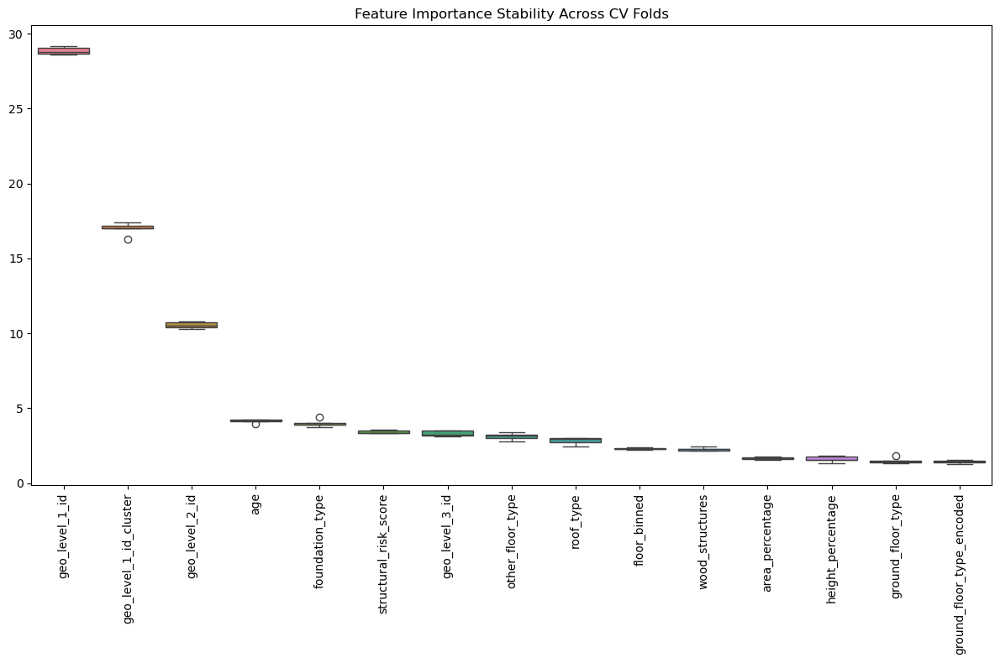

Top 5 most unstable features (highest CV):
roof_risk                               1.433627
has_superstructure_rc_non_engineered    0.200773
height_binned                           0.145989
age_binned                              0.144132
ground_floor_type                       0.140643
dtype: float64

Top 5 most stable important features (lowest CV among top 10):
geo_level_1_id            0.008088
geo_level_2_id            0.020774
geo_level_1_id_cluster    0.025068
age                       0.027168
floor_binned              0.030255
dtype: float64


In [201]:
plt.figure(figsize=(12, 8))
sorted_idx = importance_df.mean().sort_values(ascending=False).index
importance_df_sorted = importance_df[sorted_idx]

sns.boxplot(data=importance_df_sorted.iloc[:, :15])
plt.xticks(rotation=90)
plt.title('Feature Importance Stability Across CV Folds')
plt.tight_layout()
plt.show()

cv_importance = importance_df.std() / importance_df.mean()
print("Top 5 most unstable features (highest CV):")
print(cv_importance.sort_values(ascending=False).head(5))
print("\nTop 5 most stable important features (lowest CV among top 10):")
top10_features = importance_df.mean().sort_values(ascending=False).index[:10]
print(cv_importance[top10_features].sort_values().head(5))

0:	learn: 1.0712650	total: 82.7ms	remaining: 41.3s
1:	learn: 1.0465651	total: 129ms	remaining: 32s
2:	learn: 1.0239117	total: 167ms	remaining: 27.6s
3:	learn: 1.0021662	total: 205ms	remaining: 25.4s
4:	learn: 0.9848780	total: 242ms	remaining: 23.9s
5:	learn: 0.9685457	total: 286ms	remaining: 23.5s
6:	learn: 0.9526040	total: 338ms	remaining: 23.8s
7:	learn: 0.9368348	total: 380ms	remaining: 23.4s
8:	learn: 0.9258383	total: 402ms	remaining: 21.9s
9:	learn: 0.9134375	total: 446ms	remaining: 21.8s
10:	learn: 0.9004182	total: 491ms	remaining: 21.8s
11:	learn: 0.8886383	total: 536ms	remaining: 21.8s
12:	learn: 0.8788837	total: 578ms	remaining: 21.7s
13:	learn: 0.8700357	total: 636ms	remaining: 22.1s
14:	learn: 0.8619167	total: 692ms	remaining: 22.4s
15:	learn: 0.8537108	total: 748ms	remaining: 22.6s
16:	learn: 0.8462231	total: 805ms	remaining: 22.9s
17:	learn: 0.8398707	total: 859ms	remaining: 23s
18:	learn: 0.8337198	total: 929ms	remaining: 23.5s
19:	learn: 0.8275357	total: 987ms	remaining:

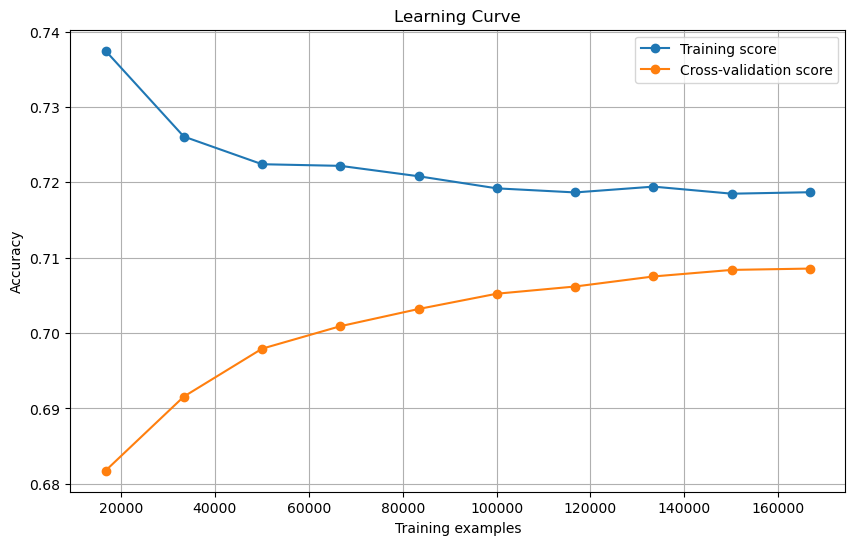

In [202]:
train_sizes, train_scores, test_scores = learning_curve(
    final_structure_model, X_train, y_train, 
    cv=5, scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores.mean(axis=1), 'o-', label='Training score')
plt.plot(train_sizes, test_scores.mean(axis=1), 'o-', label='Cross-validation score')
plt.title('Learning Curve')
plt.xlabel('Training examples')
plt.ylabel('Accuracy')
plt.legend(loc='best')
plt.grid(True)
plt.show()

# Installing and Importing SHAP for more visuals

In [209]:
pip install shap

Note: you may need to restart the kernel to use updated packages.


In [210]:
import shap

In [211]:
explainer = shap.TreeExplainer(final_structure_model)

In [212]:
sample_size = min(500, X_test.shape[0])
sample_indices = np.random.choice(X_test.shape[0], sample_size, replace=False)
X_test_sample = X_test.iloc[sample_indices]

In [213]:
shap_values = explainer.shap_values(X_test_sample)

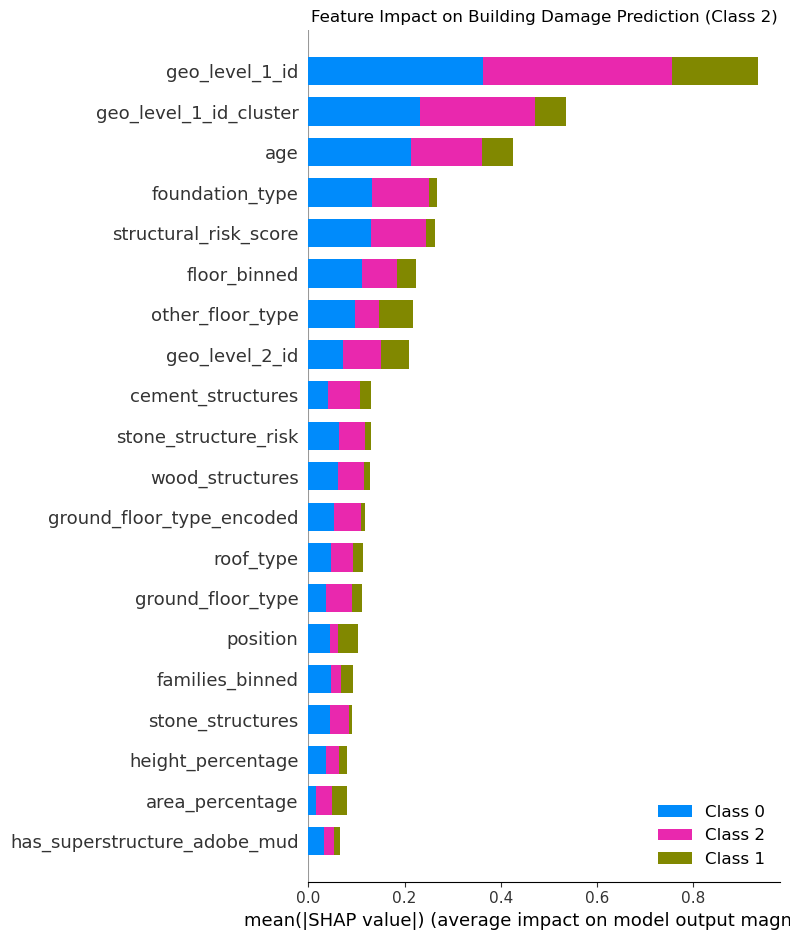

In [214]:
class_of_interest = 2

plt.figure(figsize=(12, 8))
shap.summary_plot(shap_values[class_of_interest] if isinstance(shap_values, list) else shap_values, 
                  X_test_sample, plot_type="bar", show=False)
plt.title(f"Feature Impact on Building Damage Prediction (Class {class_of_interest})")
plt.tight_layout()
plt.savefig('shap_summary.png', dpi=300, bbox_inches='tight')
plt.show()

<Figure size 1200x1000 with 0 Axes>

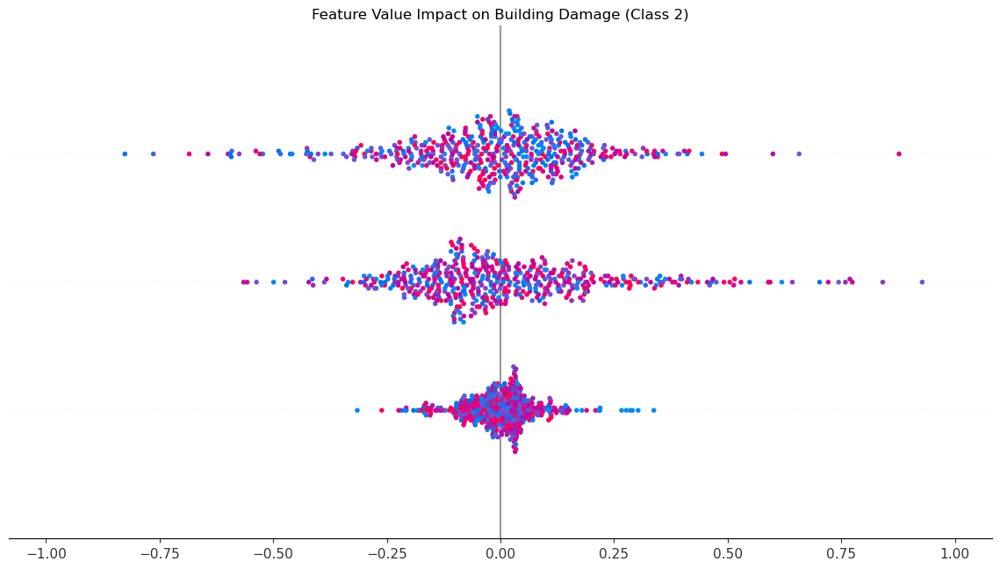

In [215]:
plt.figure(figsize=(12, 10))
shap.summary_plot(shap_values[class_of_interest] if isinstance(shap_values, list) else shap_values, 
                  X_test_sample, show=False)
plt.title(f"Feature Value Impact on Building Damage (Class {class_of_interest})")
plt.tight_layout()
plt.savefig('shap_details.png', dpi=300, bbox_inches='tight')
plt.show()

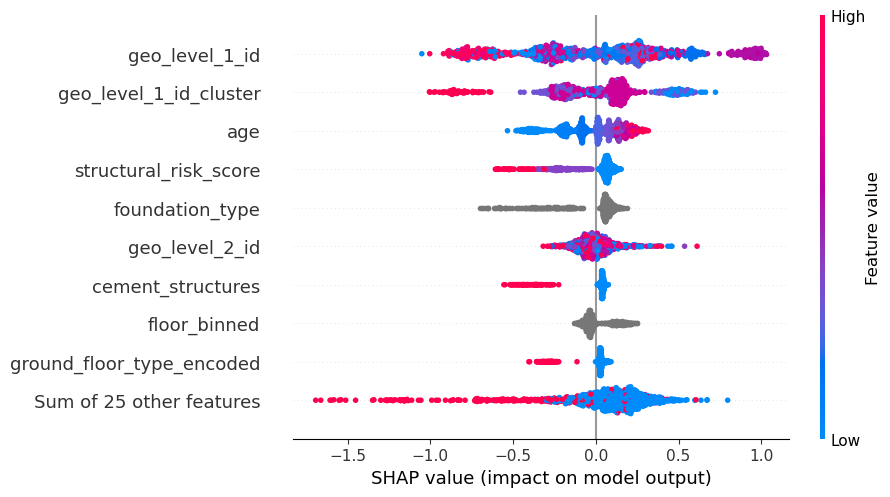

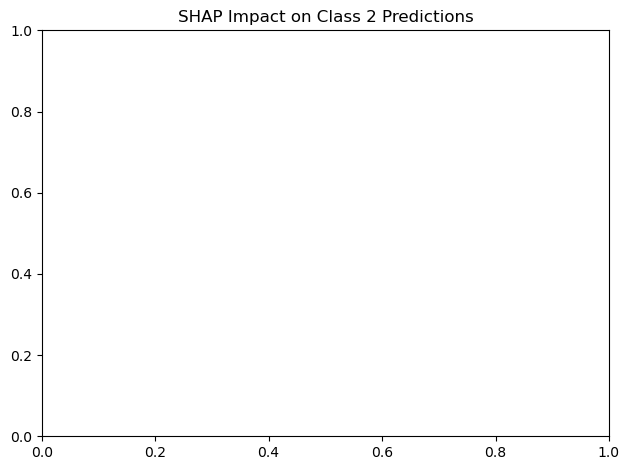

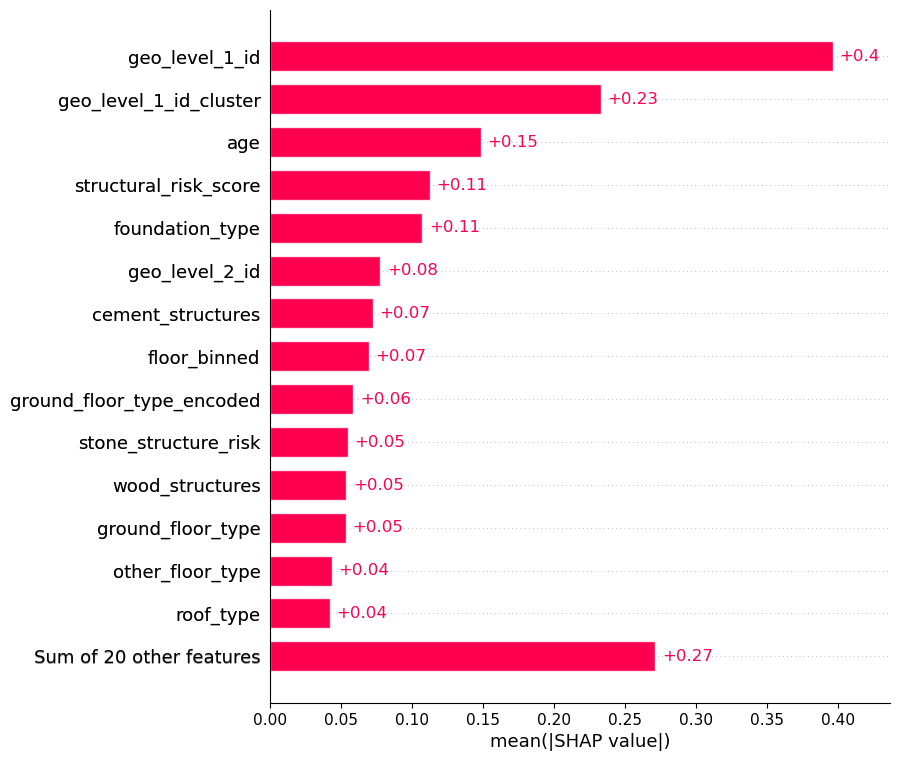

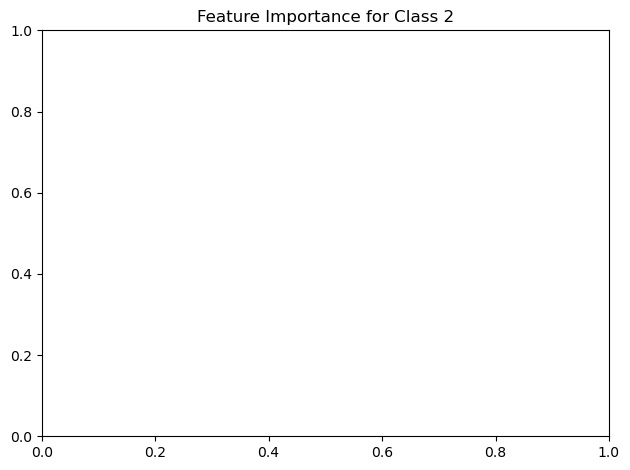

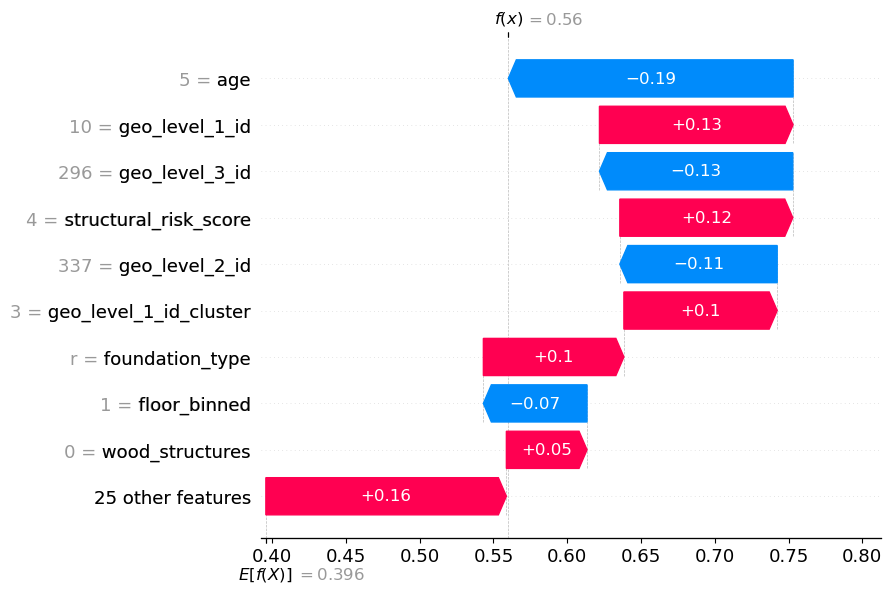

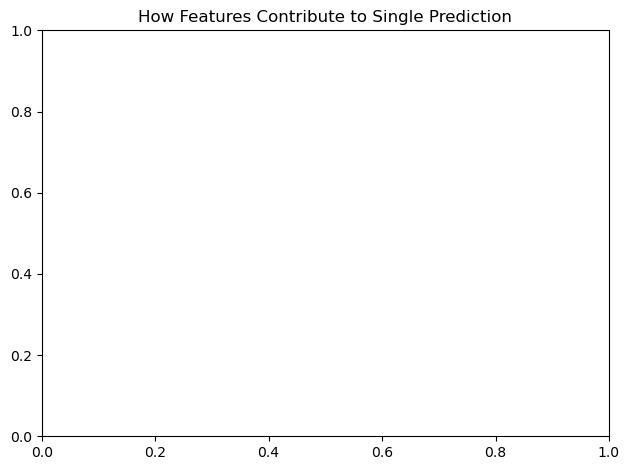

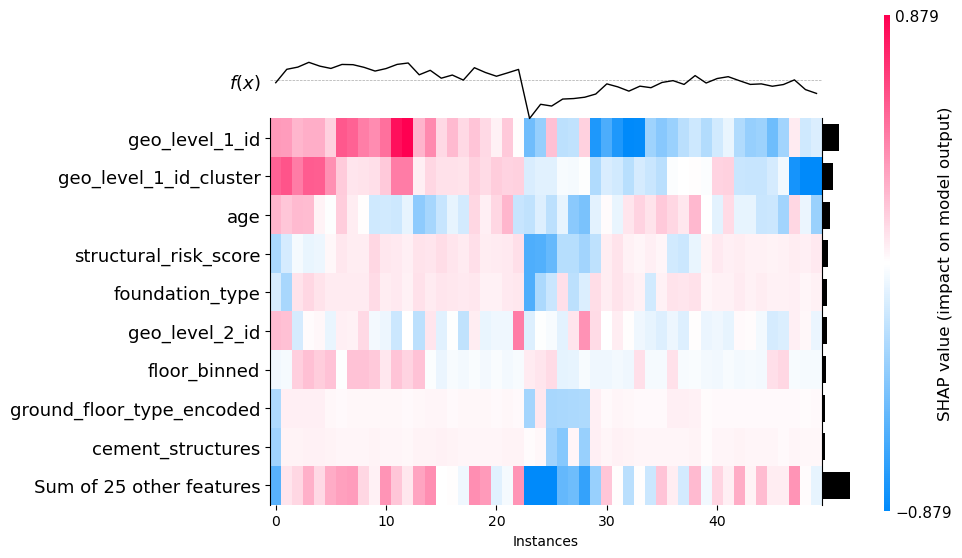

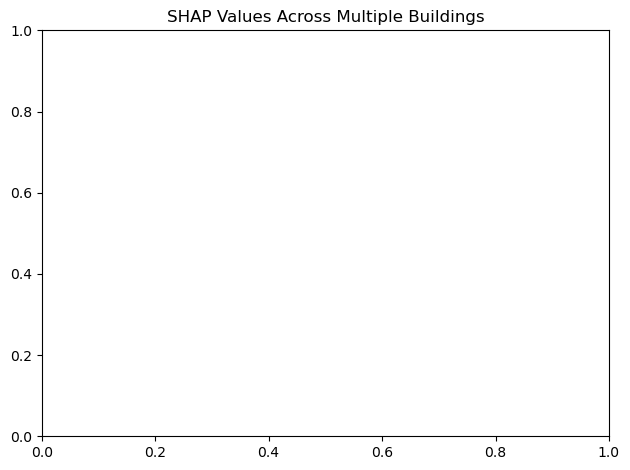

In [335]:
import shap

# Create the explainer
explainer = shap.TreeExplainer(final_structure_model)

# Sample some test data for visualization
X_test_sample = X_test.sample(1000, random_state=42)

# For newer SHAP versions, create an Explanation object
shap_values = explainer(X_test_sample)

# Option 1: Beeswarm plot (works with newer SHAP versions)
plt.figure(figsize=(12, 10))
shap.plots.beeswarm(shap_values[:,:,2])  # For class 2
plt.title("SHAP Impact on Class 2 Predictions")
plt.tight_layout()
plt.show()

# Option 2: Bar plot (works with newer SHAP versions)
plt.figure(figsize=(12, 8))
shap.plots.bar(shap_values[:,:,2], max_display=15)
plt.title("Feature Importance for Class 2")
plt.tight_layout()
plt.show()

# Option 3: Waterfall plot for a single instance
plt.figure(figsize=(12, 10))
shap.plots.waterfall(shap_values[0,:,2])  # First instance, class 2
plt.title("How Features Contribute to Single Prediction")
plt.tight_layout()
plt.show()

# Option 4: Heatmap to see patterns across instances
plt.figure(figsize=(15, 10))
shap.plots.heatmap(shap_values[:50,:,2])  # First 50 instances, class 2
plt.title("SHAP Values Across Multiple Buildings")
plt.tight_layout()
plt.show()

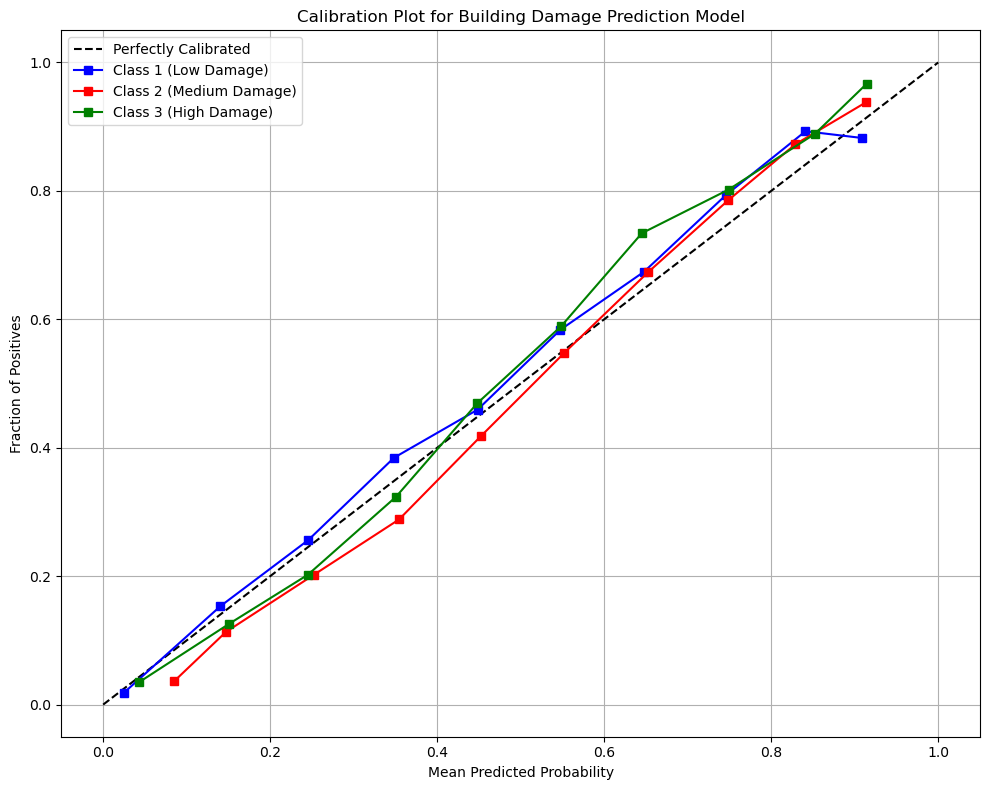

Brier score for Class 1 (Low Damage): 0.0554
Brier score for Class 2 (Medium Damage): 0.1907
Brier score for Class 3 (High Damage): 0.1503


In [336]:
from sklearn.calibration import calibration_curve
import matplotlib.pyplot as plt
import numpy as np

# Get predicted probabilities from the model
y_probs = final_structure_model.predict_proba(X_test)

# Set up the plot
plt.figure(figsize=(10, 8))
plt.plot([0, 1], [0, 1], 'k--', label='Perfectly Calibrated')

# Create calibration curves for each class
classes = [1, 2, 3]  # Assuming your damage grades are 1, 2, 3
colors = ['blue', 'red', 'green']
class_names = ['Low Damage', 'Medium Damage', 'High Damage']

for i, cls in enumerate(classes):
    # Convert to binary problem for this class
    y_test_binary = (y_test == cls).astype(int)
    
    # Get probabilities for this class
    prob_pos = y_probs[:, i]
    
    # Calculate calibration curve
    fraction_of_positives, mean_predicted_value = calibration_curve(
        y_test_binary, prob_pos, n_bins=10)
    
    # Plot calibration curve
    plt.plot(mean_predicted_value, fraction_of_positives, 's-',
             color=colors[i], label=f'Class {cls} ({class_names[i]})')

plt.xlabel('Mean Predicted Probability')
plt.ylabel('Fraction of Positives')
plt.title('Calibration Plot for Building Damage Prediction Model')
plt.legend(loc='best')
plt.grid(True)
plt.tight_layout()
plt.show()

# Calculate and print Brier score for each class
from sklearn.metrics import brier_score_loss
for i, cls in enumerate(classes):
    y_test_binary = (y_test == cls).astype(int)
    prob_pos = y_probs[:, i]
    brier = brier_score_loss(y_test_binary, prob_pos)
    print(f"Brier score for Class {cls} ({class_names[i]}): {brier:.4f}")

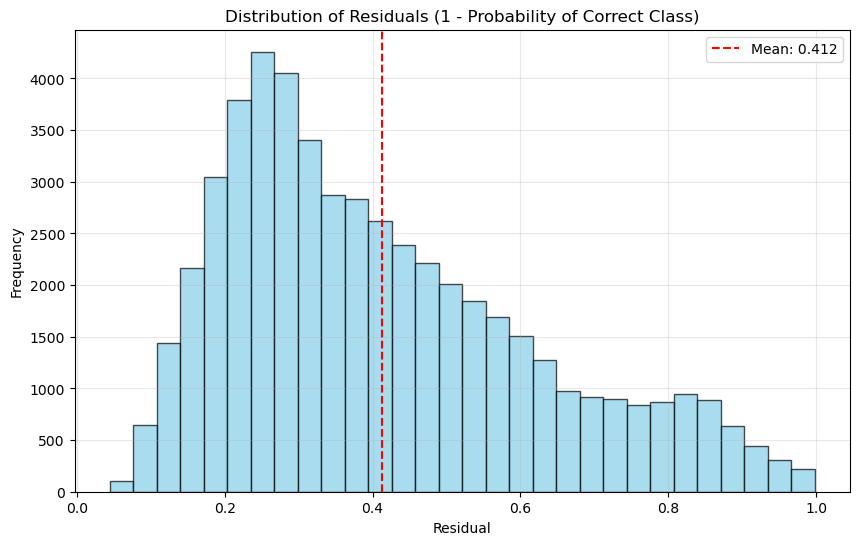

/var/folders/m7/tzk7gpbd05j79z_hsb25z6jm0000gn/T/ipykernel_23921/2919673137.py:59: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(box_data, labels=[str(cls) for cls in unique_classes])


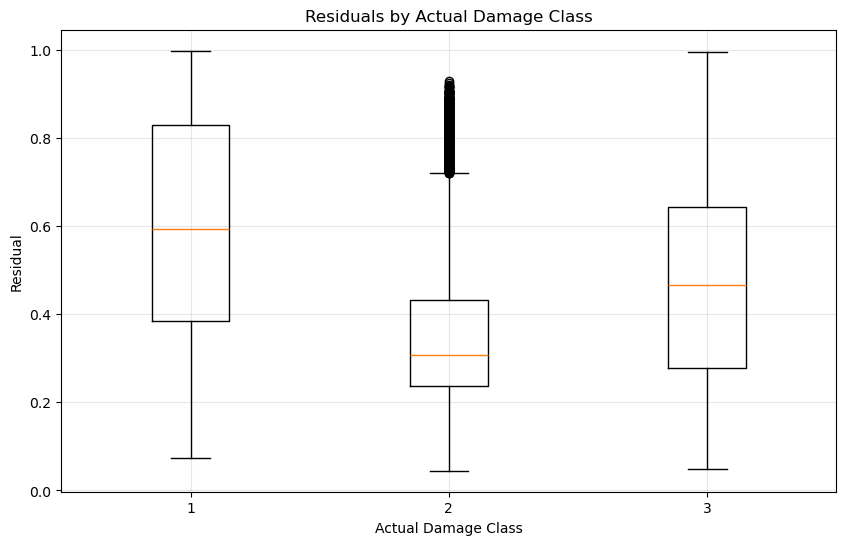

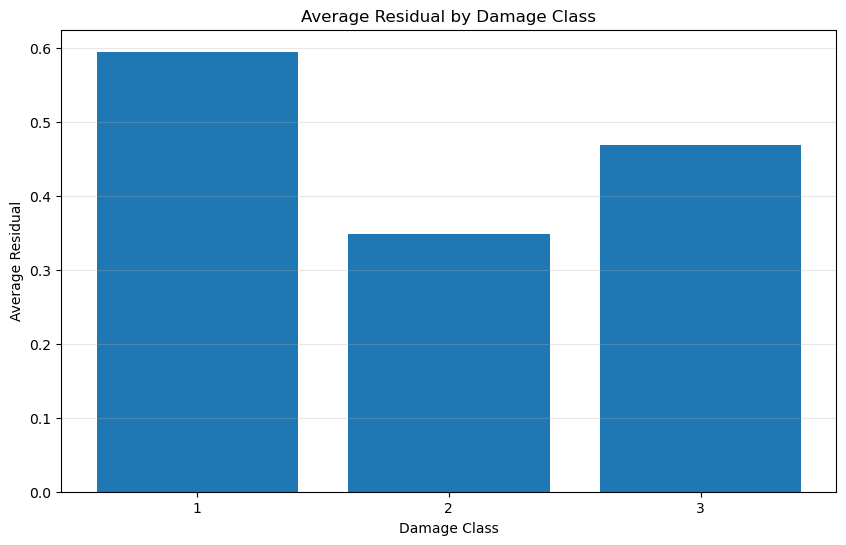

Residual Statistics:
Mean: 0.4124
Median: 0.3656
Std Dev: 0.2090
Min: 0.0448
Max: 0.9980

Average Residual by Class:
Class 1: 0.5948
Class 2: 0.3484
Class 3: 0.4687


In [339]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Get predicted probabilities
y_probs = final_structure_model.predict_proba(X_test)
y_pred = final_structure_model.predict(X_test)

# Convert to numpy arrays if they aren't already
if hasattr(y_test, 'values'):
    y_test_array = y_test.values
else:
    y_test_array = np.array(y_test)

if hasattr(y_pred, 'values'):
    y_pred_array = y_pred.values
else:
    y_pred_array = np.array(y_pred)

# Calculate residuals (probability residuals)
residuals = []
for i in range(len(y_test_array)):
    true_class = int(y_test_array[i])
    
    # Find the index in y_probs for the true class
    # Adjust if your class labels start at 1 instead of 0
    class_idx = true_class - 1  # Remove -1 if classes start at 0
    
    # Get the probability that the model assigned to the true class
    prob_true_class = y_probs[i, class_idx]
    
    # Residual = 1 - probability of correct class
    residuals.append(1 - prob_true_class)

residuals = np.array(residuals)

# 1. Plot residual distribution
plt.figure(figsize=(10, 6))
plt.hist(residuals, bins=30, alpha=0.7, color='skyblue', edgecolor='black')
plt.axvline(x=np.mean(residuals), color='red', linestyle='--', label=f'Mean: {np.mean(residuals):.3f}')
plt.title('Distribution of Residuals (1 - Probability of Correct Class)')
plt.xlabel('Residual')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# 2. Residuals by actual class
unique_classes = sorted(np.unique(y_test_array))
class_residuals = {cls: [] for cls in unique_classes}

for i in range(len(y_test_array)):
    true_class = int(y_test_array[i])
    class_residuals[true_class].append(residuals[i])

plt.figure(figsize=(10, 6))
box_data = [class_residuals[cls] for cls in unique_classes]
plt.boxplot(box_data, labels=[str(cls) for cls in unique_classes])
plt.title('Residuals by Actual Damage Class')
plt.xlabel('Actual Damage Class')
plt.ylabel('Residual')
plt.grid(True, alpha=0.3)
plt.show()

# 3. Average residual by class
class_avg_residuals = {cls: np.mean(vals) for cls, vals in class_residuals.items()}
plt.figure(figsize=(10, 6))
plt.bar(range(len(unique_classes)), 
        [class_avg_residuals[cls] for cls in unique_classes], 
        tick_label=[str(cls) for cls in unique_classes])
plt.title('Average Residual by Damage Class')
plt.xlabel('Damage Class')
plt.ylabel('Average Residual')
plt.grid(True, alpha=0.3, axis='y')
plt.show()

# 4. Print statistics
print("Residual Statistics:")
print(f"Mean: {np.mean(residuals):.4f}")
print(f"Median: {np.median(residuals):.4f}")
print(f"Std Dev: {np.std(residuals):.4f}")
print(f"Min: {np.min(residuals):.4f}")
print(f"Max: {np.max(residuals):.4f}")
print("\nAverage Residual by Class:")
for cls in unique_classes:
    print(f"Class {cls}: {class_avg_residuals[cls]:.4f}")

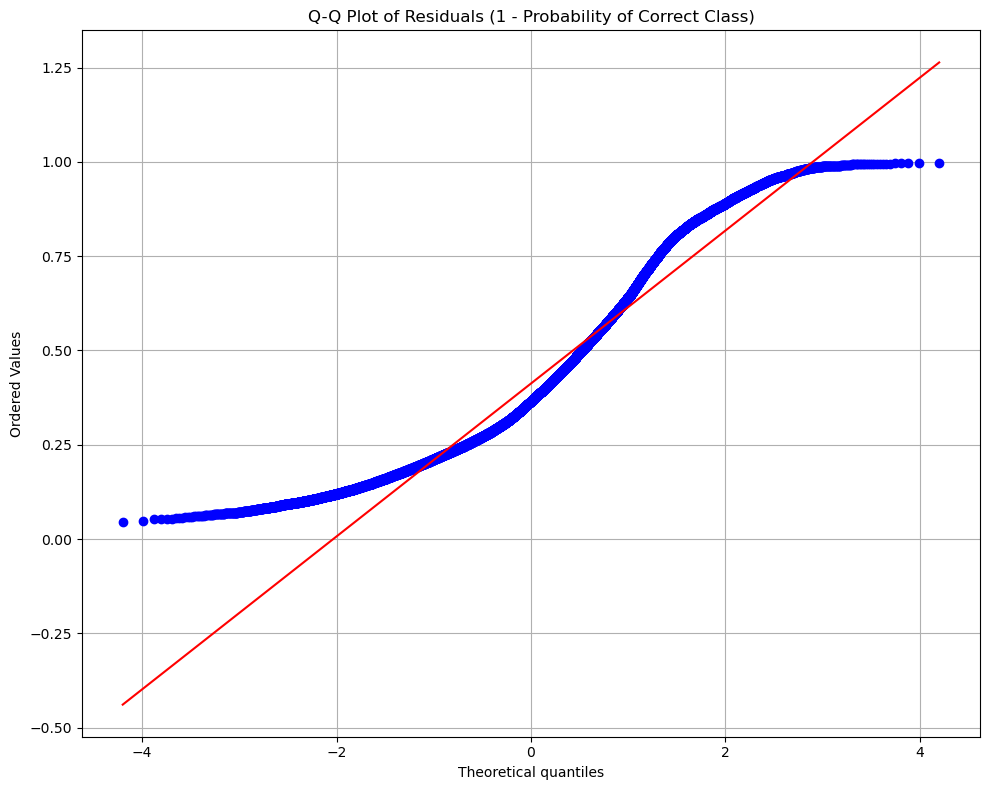

D'Agostino-Pearson normality test:
Statistic: 4041.7547
p-value: 0.00000000
The residuals do NOT follow a normal distribution (p < 0.05)


In [340]:
import scipy.stats as stats

# Create Q-Q plot
plt.figure(figsize=(10, 8))
stats.probplot(residuals, dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals (1 - Probability of Correct Class)')
plt.grid(True)
plt.tight_layout()
plt.show()

# Additional normality test
k2, p = stats.normaltest(residuals)
print(f"D'Agostino-Pearson normality test:")
print(f"Statistic: {k2:.4f}")
print(f"p-value: {p:.8f}")
if p < 0.05:
    print("The residuals do NOT follow a normal distribution (p < 0.05)")
else:
    print("The residuals appear to follow a normal distribution (p >= 0.05)")


<Figure size 1200x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

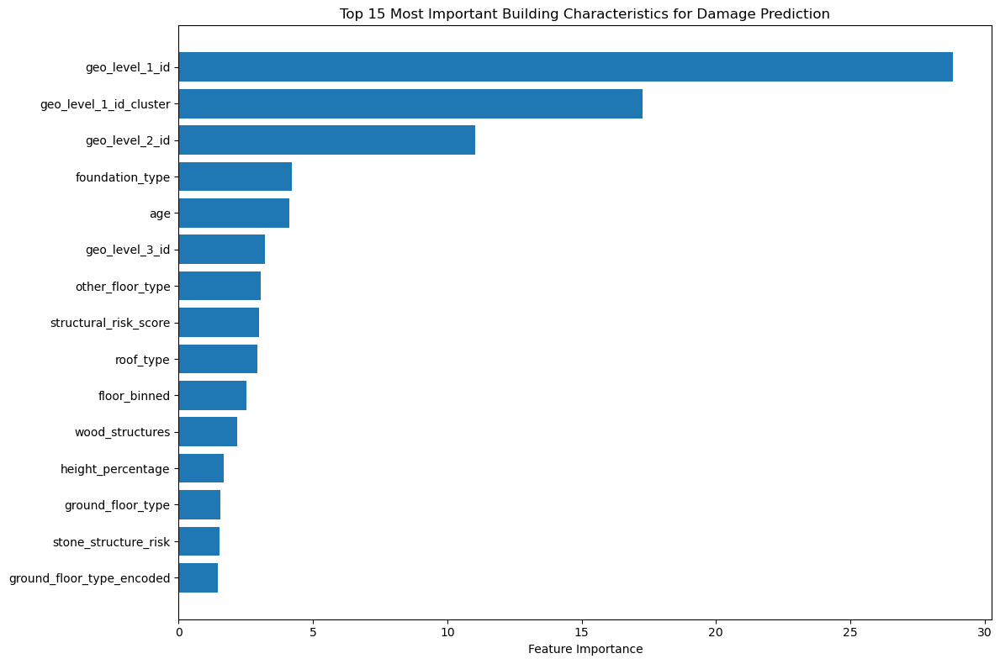

In [226]:
feature_importances = final_structure_model.feature_importances_
feature_names = X_train.columns

sorted_idx = np.argsort(feature_importances)
sorted_features = feature_names[sorted_idx]
sorted_importances = feature_importances[sorted_idx]

plt.figure(figsize=(12, 8))
plt.barh(range(len(sorted_idx[-15:])), sorted_importances[-15:])
plt.yticks(range(len(sorted_idx[-15:])), sorted_features[-15:])
plt.xlabel('Feature Importance')
plt.title('Top 15 Most Important Building Characteristics for Damage Prediction')
plt.tight_layout()
plt.savefig('feature_importance.png', dpi=300, bbox_inches='tight')
plt.show()

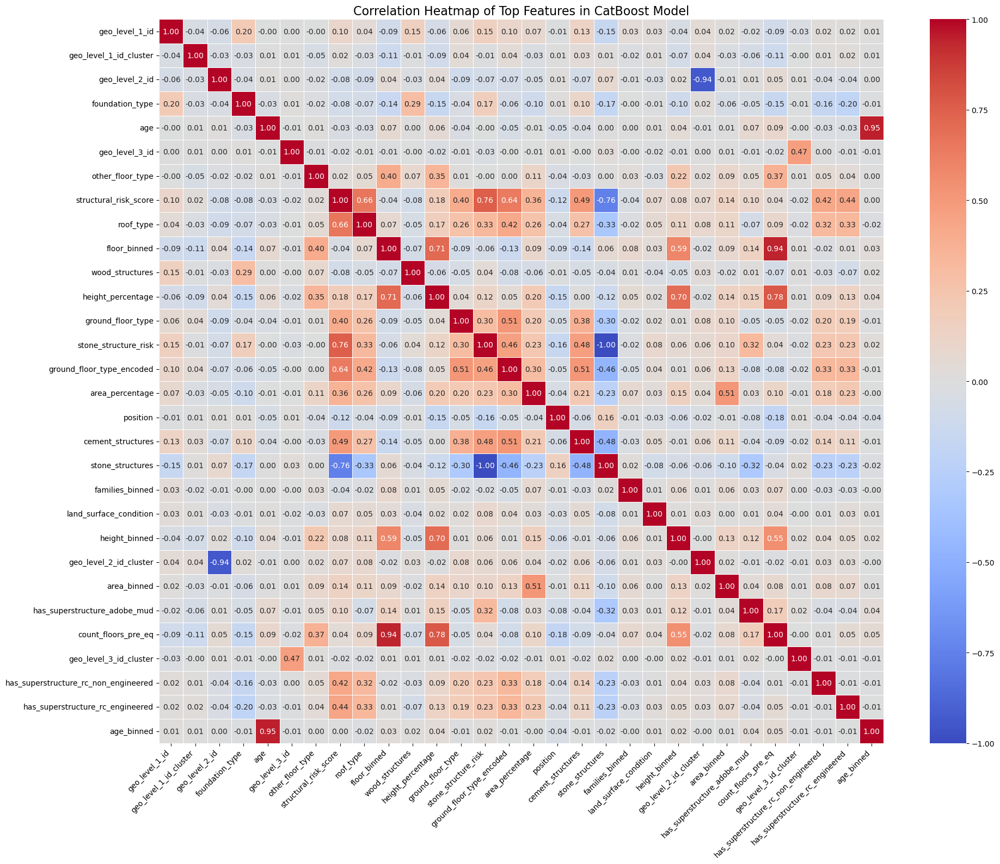

In [238]:
cat_importances = final_structure_model.get_feature_importance()

feature_names = X_train.columns.tolist()
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': cat_importances
}).sort_values('importance', ascending=False)

top_n = min(30, len(importance_df))
top_features = importance_df.head(top_n)['feature'].tolist()

X_train_top = X_train[top_features].copy()

cat_columns = [col for col in top_features if col in cat_features]

X_train_numeric = X_train_top.copy()
for col in cat_columns:
    if X_train_numeric[col].dtype in ['object', 'category']:
        X_train_numeric[col] = pd.Categorical(X_train_numeric[col]).codes

correlation_matrix = X_train_numeric.corr()

plt.figure(figsize=(20, 16))
sns.heatmap(
    correlation_matrix,
    annot=True,
    cmap='coolwarm',
    vmin=-1,
    vmax=1,
    center=0,
    square=True,
    linewidths=.5,
    fmt='.2f'
)
plt.title('Correlation Heatmap of Top Features in CatBoost Model', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [241]:
final_features = importance_df.head(15)['feature'].tolist()
print(f"Number of features selected: {len(final_features)}")
print(f"Features: {final_features}")

Number of features selected: 15
Features: ['geo_level_1_id', 'geo_level_1_id_cluster', 'geo_level_2_id', 'foundation_type', 'age', 'geo_level_3_id', 'other_floor_type', 'structural_risk_score', 'roof_type', 'floor_binned', 'wood_structures', 'height_percentage', 'ground_floor_type', 'stone_structure_risk', 'ground_floor_type_encoded']


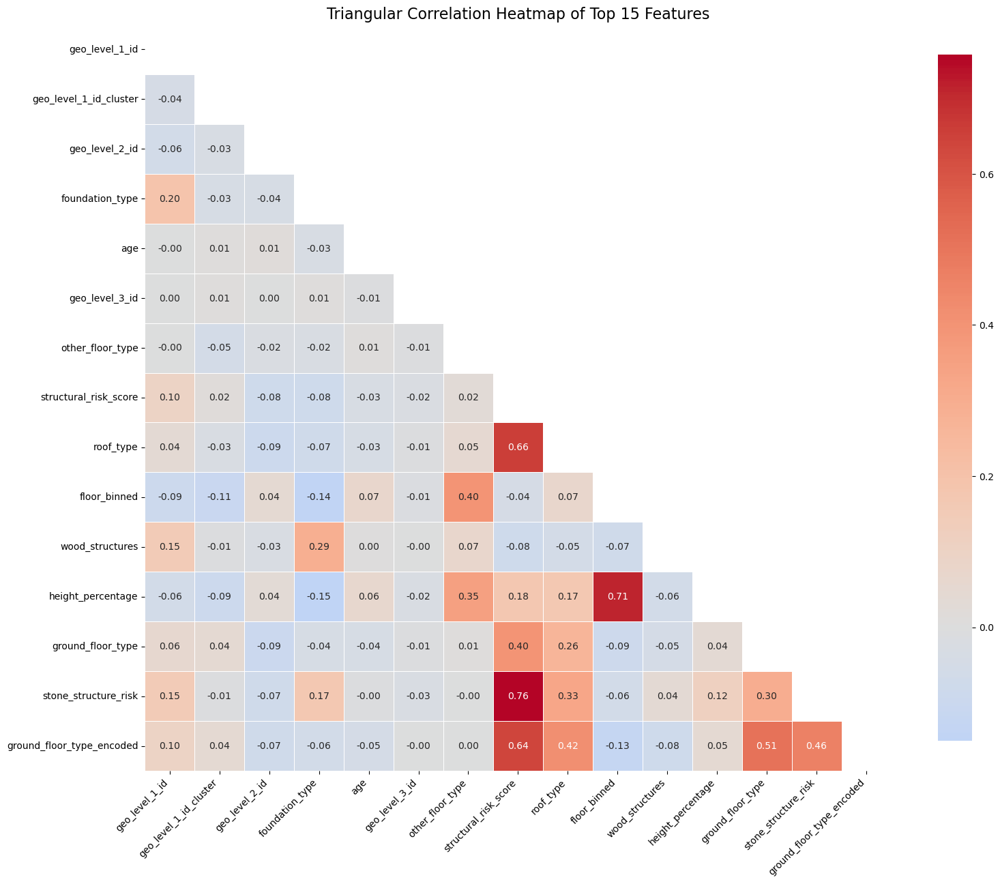

In [244]:
N = 15
final_features = importance_df.head(N)['feature'].tolist()

filtered_corr = correlation_matrix.loc[final_features, final_features]
mask = np.triu(np.ones_like(filtered_corr, dtype=bool))

plt.figure(figsize=(16, 14))
sns.heatmap(
    filtered_corr, 
    mask=mask,  
    annot=True,  
    cmap='coolwarm',  
    center=0,
    linewidths=0.5,
    fmt='.2f',  
    square=True,  
    cbar_kws={'shrink': 0.8}
)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.title('Triangular Correlation Heatmap of Top 15 Features', fontsize=16)
plt.tight_layout()
plt.show()

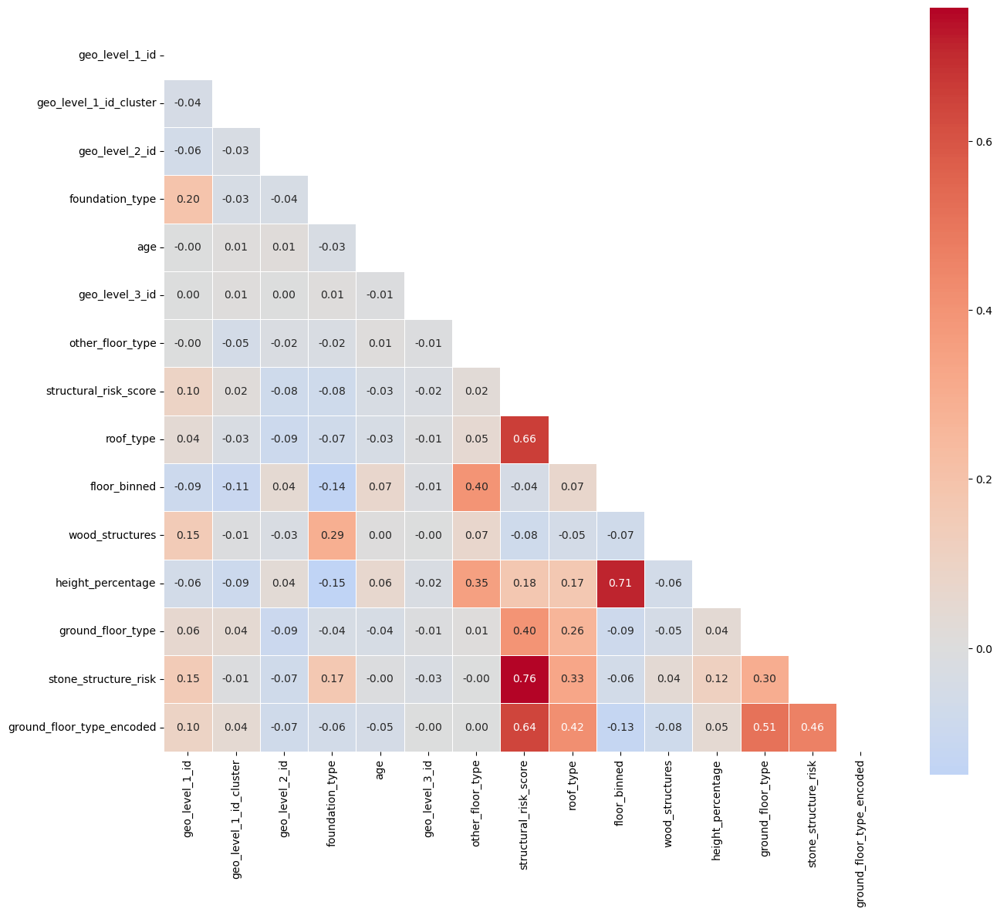

In [247]:
threshold = 0.3
highlight_mask = np.zeros_like(filtered_corr, dtype=bool)
highlight_mask[np.triu_indices_from(highlight_mask, k=1)] = True  
highlight_mask = highlight_mask & (abs(filtered_corr) < threshold)  

combined_mask = mask | highlight_mask

plt.figure(figsize=(14, 12))
sns.heatmap(
    filtered_corr,
    mask=combined_mask,  
    annot=True,
    cmap='coolwarm',
    center=0,
    linewidths=0.5,
    fmt='.2f',
    square=True
)
plt.tight_layout()
plt.show()

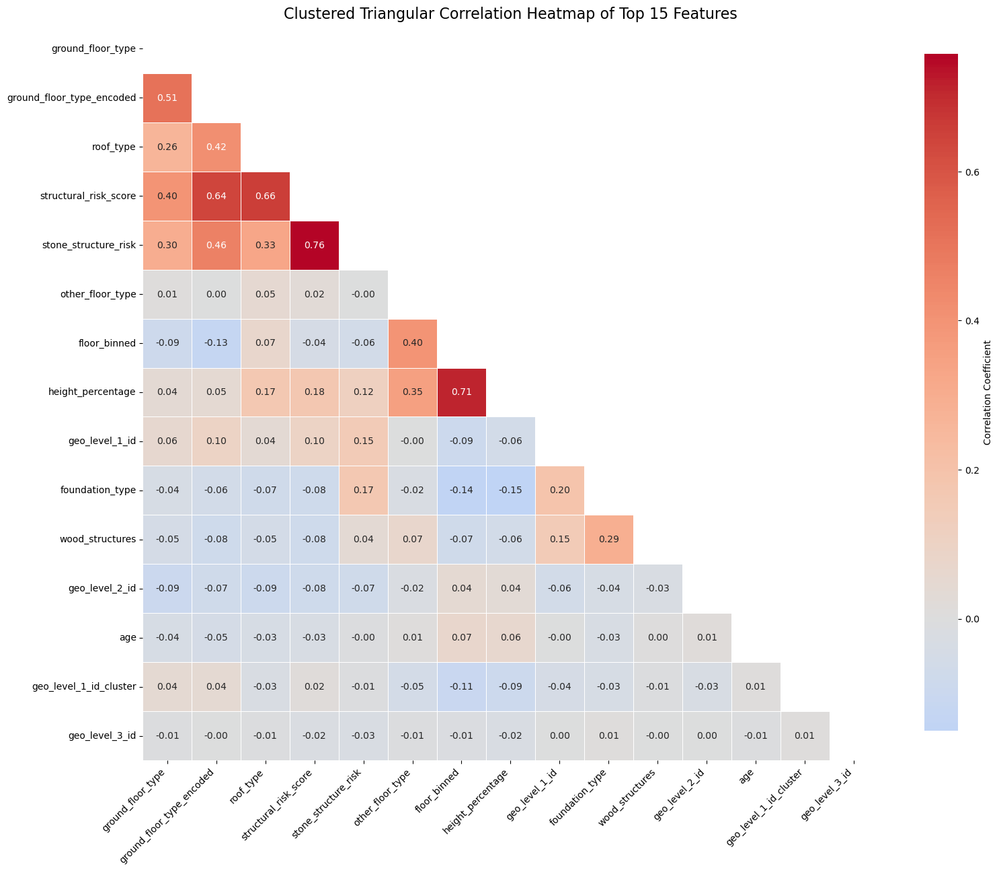

In [248]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster import hierarchy
from scipy.spatial import distance

# Get top 15 features based on your feature importance
top_features = importance_df.head(15)['feature'].tolist()

# Filter correlation matrix to only include these top features
filtered_corr = correlation_matrix.loc[top_features, top_features]

# Compute the linkage for clustering similar features
corr_linkage = hierarchy.ward(distance.pdist(filtered_corr))
dendro = hierarchy.dendrogram(corr_linkage, labels=filtered_corr.columns, no_plot=True)
dendro_idx = np.array(dendro['leaves'])

# Reorder the correlation matrix based on the clustering
reordered_corr = filtered_corr.iloc[dendro_idx, dendro_idx]

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(reordered_corr, dtype=bool))

# Plot the heatmap with the clustered features
plt.figure(figsize=(16, 14))
sns.heatmap(
    reordered_corr,
    mask=mask,
    annot=True,
    cmap='coolwarm',
    center=0,
    linewidths=0.5,
    fmt='.2f',
    square=True,
    cbar_kws={'shrink': 0.8, 'label': 'Correlation Coefficient'}
)

# Adjust labels for better readability
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)

plt.title('Clustered Triangular Correlation Heatmap of Top 15 Features', fontsize=16)
plt.tight_layout()
plt.savefig('clustered_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

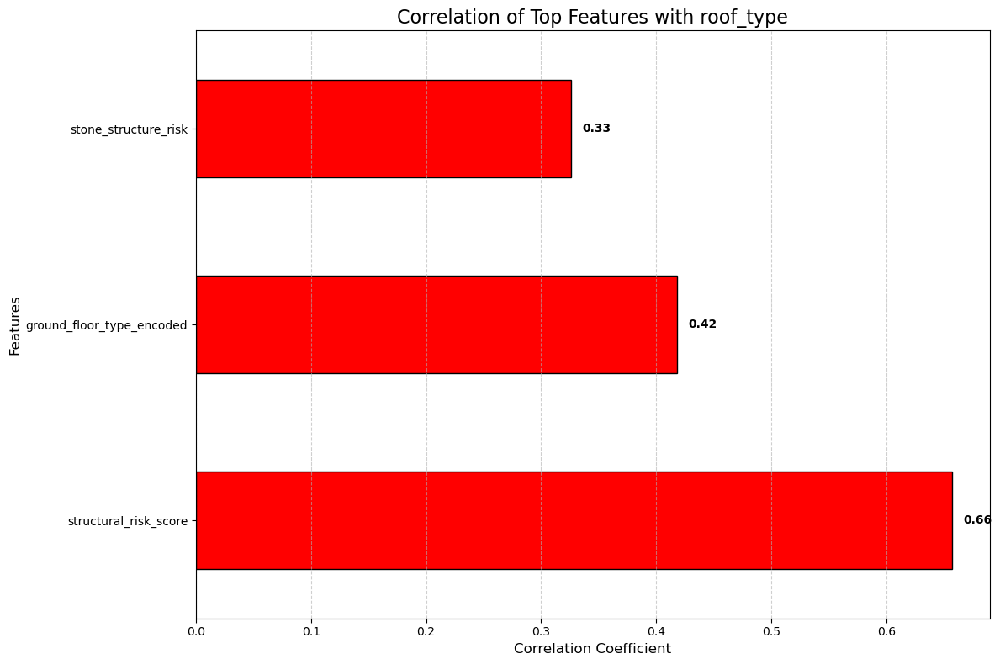

In [260]:
target_feature = final_features[8]
target_corrs = filtered_corr[target_feature].sort_values(ascending=False)


threshold = 0.3
important_corrs = target_corrs[abs(target_corrs) > threshold]

plt.figure(figsize=(12, 8))
important_corrs.drop(target_feature).plot(
    kind='barh',
    color=[
        'r' if x > 0 else 'b' for x in important_corrs.drop(target_feature)
    ],
    edgecolor='black'
)

plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)

for i, v in enumerate(important_corrs.drop(target_feature)):
    plt.text(
        v + (0.01 if v >= 0 else -0.01),
        i,
        f'{v:.2f}',
        va='center',
        ha='left' if v >= 0 else 'right',
        fontweight='bold'
    )

plt.title(f'Correlation of Top Features with {target_feature}', fontsize=16)
plt.xlabel('Correlation Coefficient', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig('target_correlations.png', dpi=300, bbox_inches='tight')
plt.show()


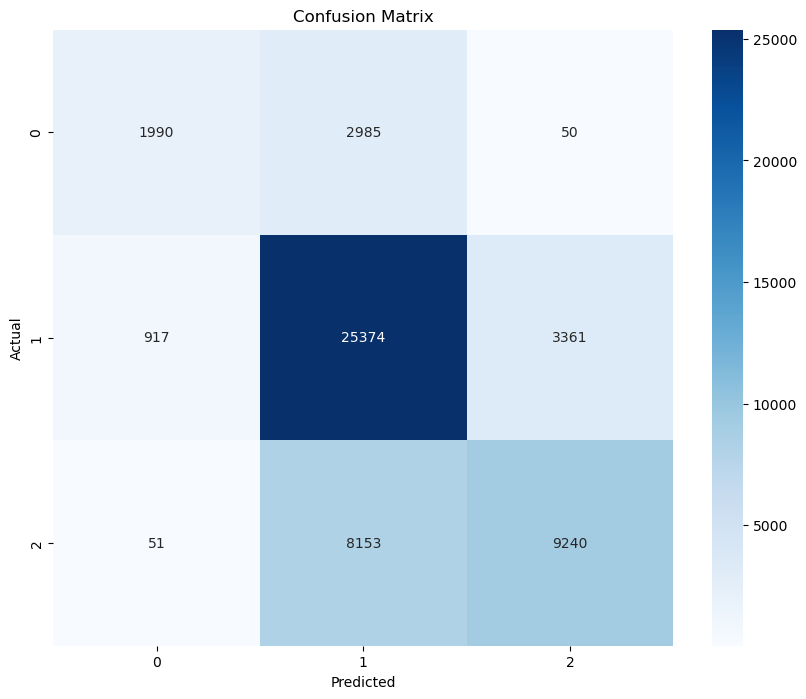

In [239]:
final_cm_matrix = confusion_matrix(y_test, final_y_test_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cat_cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

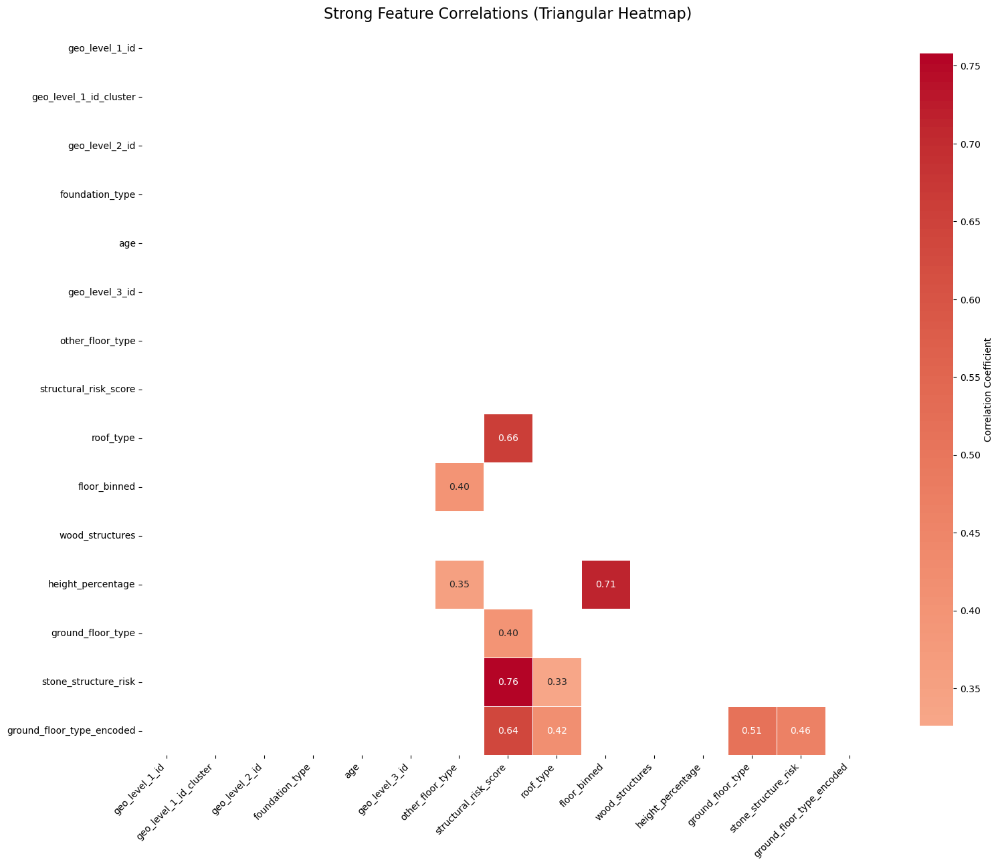

In [274]:
threshold = 0.3
strong_corr = filtered_corr.copy()

weak_mask = (abs(strong_corr) < threshold)
tri_mask = np.triu(np.ones_like(strong_corr, dtype=bool))
combined_mask = weak_mask | tri_mask

plt.figure(figsize=(16, 14))
sns.heatmap(
    strong_corr,
    mask=combined_mask,
    annot=True,
    cmap='coolwarm',
    center=0,
    linewidths=0.5,
    fmt='.2f',
    square=True,
    cbar_kws={'shrink': 0.8, 'label': 'Correlation Coefficient'}
)

plt.title('Strong Feature Correlations (Triangular Heatmap)', fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.savefig('strong_correlations.png', dpi=300, bbox_inches='tight')
plt.show()

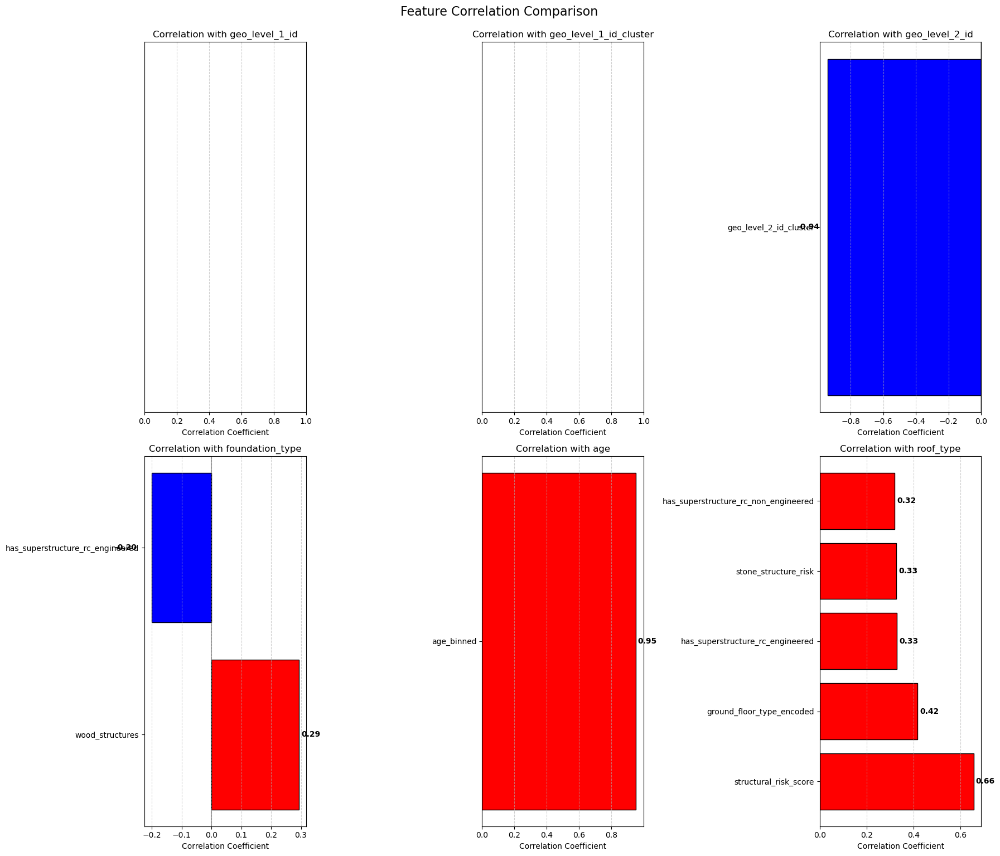

In [265]:
import matplotlib.pyplot as plt
import numpy as np

def plot_multiple_feature_correlations(correlation_matrix, target_features, top_n=5, threshold=0.2, figsize=(18, 15)):
    """Create side-by-side correlation plots for multiple target features"""
    # Determine number of subplots needed
    n_features = len(target_features)
    n_cols = min(3, n_features)  # Maximum 3 columns
    n_rows = (n_features + n_cols - 1) // n_cols  # Calculate rows needed
    
    # Create figure and subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    if n_rows == 1 and n_cols == 1:
        axes = np.array([axes])  # Handle single subplot case
    axes = axes.flatten()  # Flatten to make indexing easier
    
    # For each target feature, create a correlation plot
    for i, feature in enumerate(target_features):
        if i < len(axes):  # Make sure we don't exceed the number of subplots
            ax = axes[i]
            
            # Get correlations with this feature
            target_corrs = correlation_matrix[feature].sort_values(ascending=False)
            
            # Filter to show only correlations above threshold and exclude self-correlation
            important_corrs = target_corrs[abs(target_corrs) > threshold]
            important_corrs = important_corrs.drop(feature, errors='ignore')
            
            # Take top N correlations
            if len(important_corrs) > top_n:
                important_corrs = important_corrs.iloc[:top_n]
            
            # Plot manually without using pandas plot
            y_pos = np.arange(len(important_corrs))
            values = important_corrs.values
            labels = important_corrs.index
            
            # Create bars with explicit colors
            for j, value in enumerate(values):
                color = 'red' if value > 0 else 'blue'
                ax.barh(y_pos[j], value, color=color, edgecolor='black')
            
            # Add reference line at zero
            ax.axvline(x=0, color='black', linestyle='-', alpha=0.3)
            
            # Add value labels to the bars
            for j, value in enumerate(values):
                ax.text(
                    value + (0.01 if value >= 0 else -0.05),
                    y_pos[j],
                    f'{value:.2f}',
                    va='center',
                    ha='left' if value >= 0 else 'right',
                    fontweight='bold'
                )
            
            # Set y-tick labels to feature names
            ax.set_yticks(y_pos)
            ax.set_yticklabels(labels)
            
            # Set titles and labels
            ax.set_title(f'Correlation with {feature}', fontsize=12)
            ax.set_xlabel('Correlation Coefficient', fontsize=10)
            ax.grid(axis='x', linestyle='--', alpha=0.6)
    
    # Hide any unused subplots
    for j in range(i+1, len(axes)):
        axes[j].set_visible(False)
    
    plt.tight_layout()
    plt.suptitle('Feature Correlation Comparison', fontsize=16, y=1.02)
    return fig

# Example usage with your top features
top_target_features = [
    'geo_level_1_id',
    'geo_level_1_id_cluster', 
    'geo_level_2_id', 
    'foundation_type',
    'age',
    'roof_type'
]

# Create the multi-feature correlation plot
fig = plot_multiple_feature_correlations(
    correlation_matrix=correlation_matrix,
    target_features=top_target_features,
    top_n=5,
    threshold=0.2,
    figsize=(18, 15)
)

plt.savefig('multi_feature_correlations.png', dpi=300, bbox_inches='tight')
plt.show()

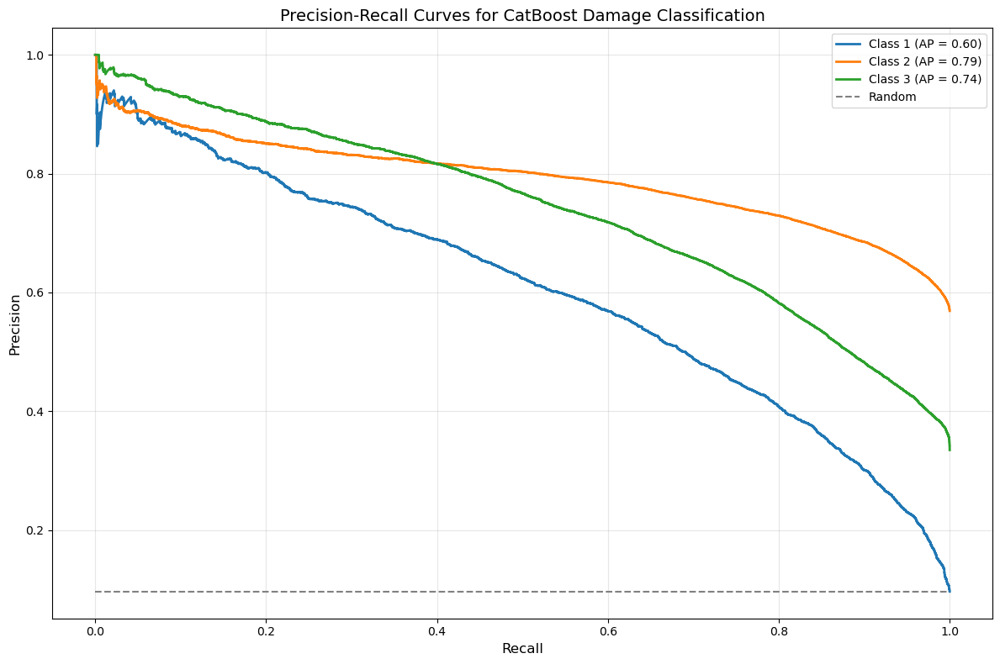

In [275]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.preprocessing import label_binarize

# Assuming you have:
# - final_structure_model: your trained CatBoost model
# - X_test: your test features
# - y_test: your actual test labels

# Get predictions from your model
y_pred_proba = final_structure_model.predict_proba(X_test)

# For multiclass classification (like damage grades 1, 2, 3)
# We need to binarize the labels for PR curves
classes = final_structure_model.classes_
n_classes = len(classes)
y_test_bin = label_binarize(y_test, classes=classes)

# Set up the plot
plt.figure(figsize=(12, 8))

# Calculate PR curve for each class
for i in range(n_classes):
    precision, recall, _ = precision_recall_curve(y_test_bin[:, i], y_pred_proba[:, i])
    avg_precision = average_precision_score(y_test_bin[:, i], y_pred_proba[:, i])
    
    # Plot the PR curve
    plt.plot(recall, precision, lw=2,
             label=f'Class {classes[i]} (AP = {avg_precision:.2f})')

# Add a reference line for random classifier performance
plt.plot([0, 1], [sum(y_test_bin[:, 0])/len(y_test_bin), sum(y_test_bin[:, 0])/len(y_test_bin)], 
         linestyle='--', color='gray', label='Random')

# Set plot details
plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision-Recall Curves for CatBoost Damage Classification', fontsize=14)
plt.legend(loc='best')
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

<Figure size 1400x1000 with 0 Axes>

<Figure size 1400x1000 with 0 Axes>

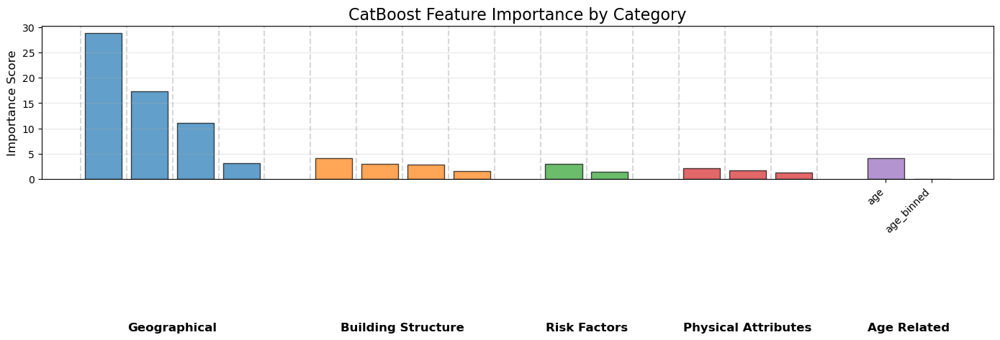

In [280]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Assuming you have importance_df with 'feature' and 'importance' columns
# First, create feature groups based on naming patterns or domain knowledge
feature_groups = {
    'Geographical': ['geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id', 'geo_level_1_id_cluster'],
    'Building Structure': ['foundation_type', 'roof_type', 'ground_floor_type', 'other_floor_type'],
    'Risk Factors': ['structural_risk_score', 'stone_structure_risk'],
    'Physical Attributes': ['height_percentage', 'area_percentage', 'wood_structures'],
    'Age Related': ['age', 'age_binned']
    # Add more categories as needed
}

# Create a function to plot the clustered bar chart
def plot_clustered_feature_importance(importance_df, feature_groups):
    # Create figure
    plt.figure(figsize=(14, 10))
    
    # Track positions for group labels
    group_positions = []
    current_pos = 0
    bar_width = 0.8
    
    # For each group, plot its features
    for group_name, features in feature_groups.items():
        # Get features that exist in our importance dataframe
        valid_features = [f for f in features if f in importance_df['feature'].values]
        
        if not valid_features:
            continue
            
        # Get importance values
        group_data = importance_df[importance_df['feature'].isin(valid_features)].sort_values('importance', ascending=False)
        
        # Plot bars for this group
        positions = np.arange(current_pos, current_pos + len(group_data))
        plt.bar(positions, group_data['importance'], width=bar_width, 
                label=group_name, alpha=0.7, edgecolor='black')
        
        # Add feature names as x-tick labels
        plt.xticks(positions, group_data['feature'], rotation=45, ha='right')
        
        # Save middle position for group label
        group_positions.append((positions[0] + positions[-1]) / 2)
        
        # Update position counter for next group
        current_pos += len(group_data) + 1  # +1 for spacing between groups
    
    # Add vertical lines to separate groups
    for pos in np.arange(0, current_pos, 1)[:-1]:
        if pos not in positions:
            plt.axvline(x=pos - 0.5, color='gray', linestyle='--', alpha=0.3)
    
    # Add group labels
    for i, (name, pos) in enumerate(zip(feature_groups.keys(), group_positions)):
        plt.annotate(name, xy=(pos, -1), xycoords=('data', 'axes fraction'), 
                     ha='center', va='bottom', fontsize=12, fontweight='bold')
    
    # Add labels and title
    plt.ylabel('Importance Score', fontsize=12)
    plt.title('CatBoost Feature Importance by Category', fontsize=16)
    plt.grid(axis='y', alpha=0.3)
    
    # Adjust bottom margin to make room for category labels
    plt.subplots_adjust(bottom=0.15)
    
    plt.tight_layout()
    return plt

# Call the function
plot_clustered_feature_importance(importance_df, feature_groups)
plt.savefig('clustered_feature_importance.png', dpi=300, bbox_inches='tight')
plt.show()

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

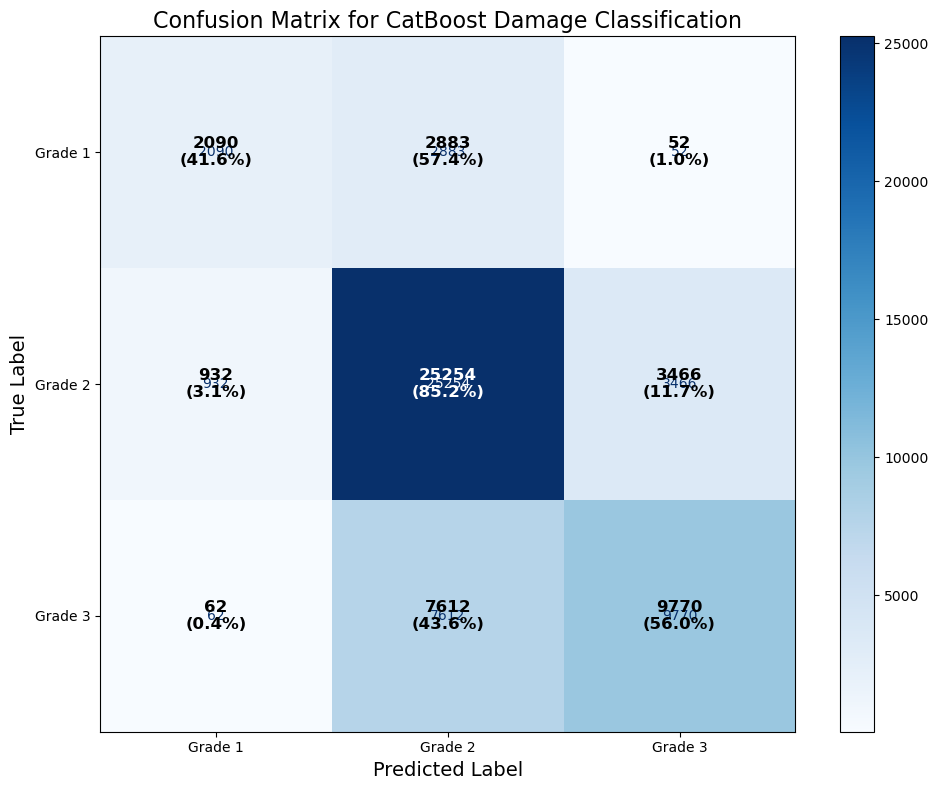

In [284]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Assuming you have:
# - y_test: true labels
# - y_pred: model predictions 

def plot_styled_confusion_matrix(y_true, y_pred, class_names=None):
    """
    Create a stylized confusion matrix that's clear and informative
    """
    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    
    # Normalize the confusion matrix (optional)
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    
    # Create figure and axes
    fig, ax = plt.subplots(figsize=(10, 8))
    
    # Use the ConfusionMatrixDisplay
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    
    # Plot with a colorful style
    disp.plot(cmap=plt.cm.Blues, ax=ax, values_format='.0f')
    
    # Customize the display
    ax.set_title('Confusion Matrix for CatBoost Damage Classification', fontsize=16)
    ax.set_xlabel('Predicted Label', fontsize=14)
    ax.set_ylabel('True Label', fontsize=14)
    
    # Add normalized percentages
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            # Add count
            text = ax.text(j, i, f"{cm[i, j]}\n({cm_normalized[i, j]:.1%})",
                     ha="center", va="center", color="white" if cm[i, j] > cm.max()/2 else "black",
                     fontsize=12, fontweight='bold')
    
    plt.tight_layout()
    return fig

# Example usage:
# Assuming damage_grade has 3 classes (1, 2, 3)
class_names = ['Grade 1', 'Grade 2', 'Grade 3']  # Or use the actual class labels from your data

# Create the confusion matrix visualization
fig = plot_styled_confusion_matrix(y_test, y_pred, class_names)
plt.savefig('confusion_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

# Installing and Importing Lime for visuals

In [231]:
pip install lime

  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=0479352486ad8ac72bb9ec2dda86e90d588a8818e60f43f47831a61ffe38045b
  Stored in directory: /Users/davidjimenez/Library/Caches/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime
Note: you may need to restart the kernel to use updated packages.


In [233]:
import lime
import lime.lime_tabular

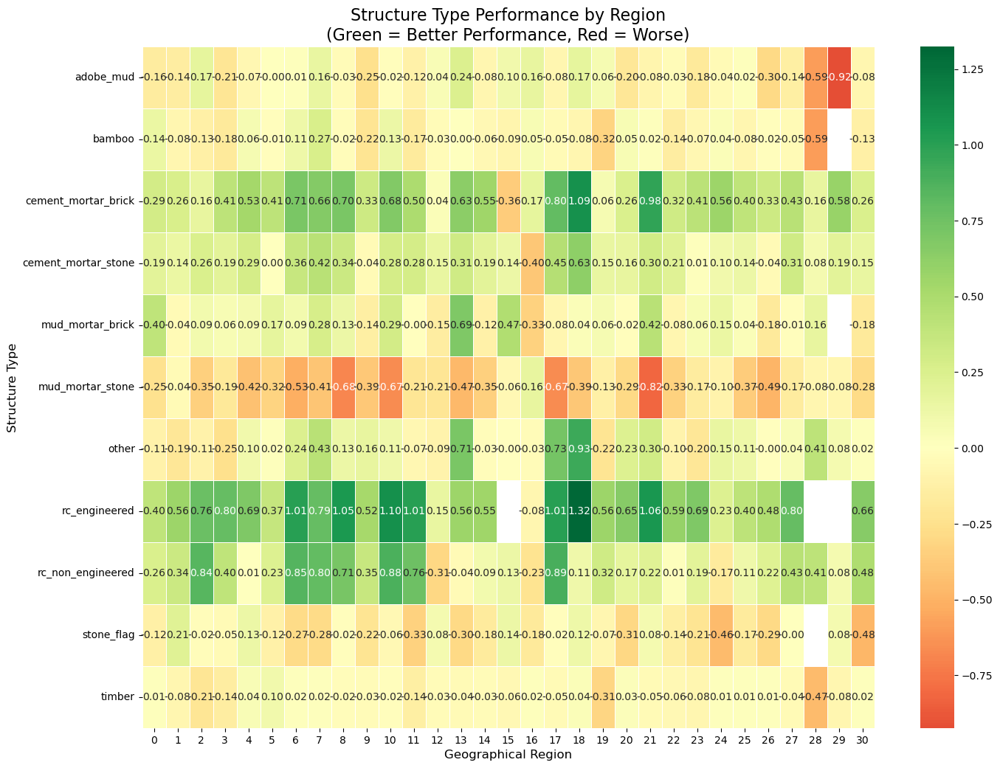

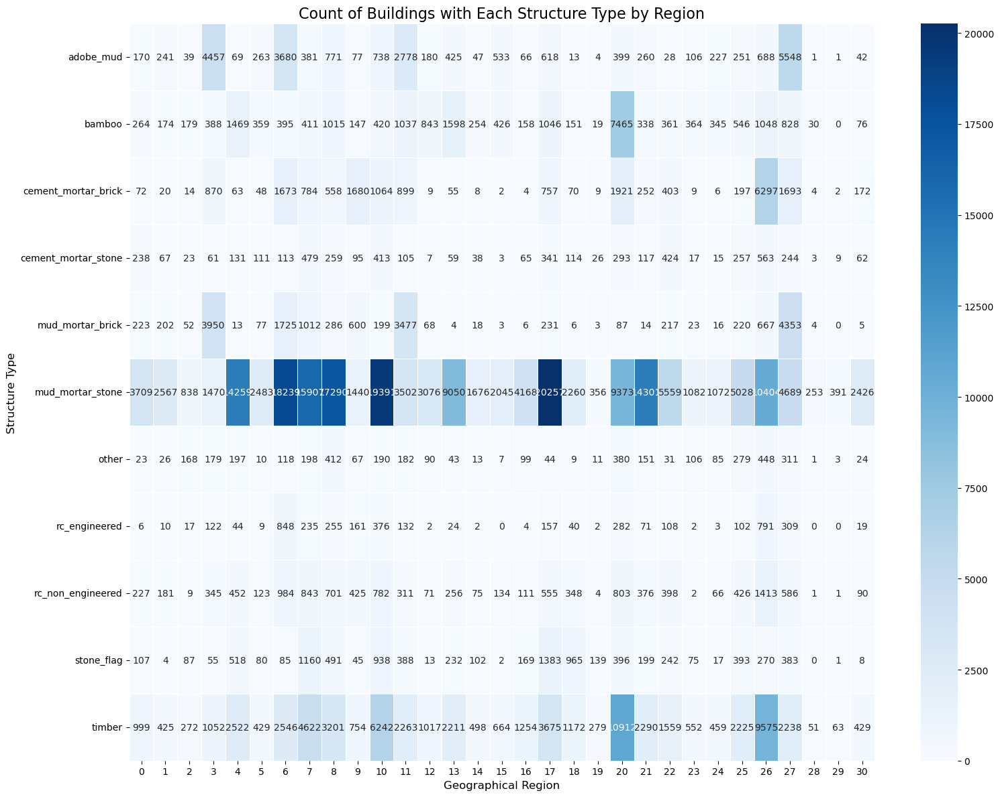

In [285]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

def plot_structure_performance_by_geo(df, structure_cols, geo_col='geo_level_1_id'):
    """
    Visualize the performance of different structure types across geographical regions
    
    Parameters:
    -----------
    df : pandas DataFrame
        DataFrame containing structure types, geographical info, and damage grades
    structure_cols : list
        List of column names for structure types to analyze
    geo_col : str
        Column name for geographical region
    """
    # Create figure
    plt.figure(figsize=(16, 12))
    
    # We'll create a heatmap showing average damage grade for each structure type in each region
    
    # First, get the unique geographical regions
    geo_regions = df[geo_col].unique()
    
    # Create a results DataFrame to store average damage grades
    results = []
    
    # For each structure type
    for col in structure_cols:
        # For each region
        for region in geo_regions:
            # Get subset for this region
            region_df = df[df[geo_col] == region]
            
            # Calculate average damage grade for buildings with this structure (1)
            has_structure = region_df[region_df[col] == 1]['damage_grade'].mean()
            
            # Calculate average damage grade for buildings without this structure (0)
            no_structure = region_df[region_df[col] == 0]['damage_grade'].mean()
            
            # Calculate count of buildings with this structure
            count = region_df[region_df[col] == 1].shape[0]
            
            # Add to results
            results.append({
                'Structure': col.replace('has_superstructure_', ''),
                'Region': region,
                'Avg_Damage_With': has_structure,
                'Avg_Damage_Without': no_structure,
                'Difference': no_structure - has_structure,  # Positive means better performance
                'Count': count
            })
    
    # Convert to DataFrame
    results_df = pd.DataFrame(results)
    
    # Pivot for the heatmap - positive difference means structure performed better
    pivot_diff = results_df.pivot(index='Structure', columns='Region', values='Difference')
    
    # Create a heatmap
    ax = sns.heatmap(
        pivot_diff,
        cmap='RdYlGn',  # Red (bad) to Green (good)
        center=0,
        annot=True,
        fmt='.2f',
        linewidths=0.5
    )
    
    plt.title('Structure Type Performance by Region\n(Green = Better Performance, Red = Worse)', fontsize=16)
    plt.xlabel('Geographical Region', fontsize=12)
    plt.ylabel('Structure Type', fontsize=12)
    
    # Create a second plot showing the count of each structure by region
    plt.figure(figsize=(16, 12))
    pivot_count = results_df.pivot(index='Structure', columns='Region', values='Count')
    
    ax2 = sns.heatmap(
        pivot_count,
        cmap='Blues',
        annot=True,
        fmt='.0f',
        linewidths=0.5
    )
    
    plt.title('Count of Buildings with Each Structure Type by Region', fontsize=16)
    plt.xlabel('Geographical Region', fontsize=12)
    plt.ylabel('Structure Type', fontsize=12)
    
    # Return both figures
    return plt

# Get all the superstructure columns from your dataset
structure_cols = [col for col in training_df.columns if 'has_superstructure' in col]

# Create the visualization
plot_structure_performance_by_geo(training_df, structure_cols)
plt.tight_layout()
plt.savefig('structure_performance_by_region.png', dpi=300, bbox_inches='tight')
plt.show()

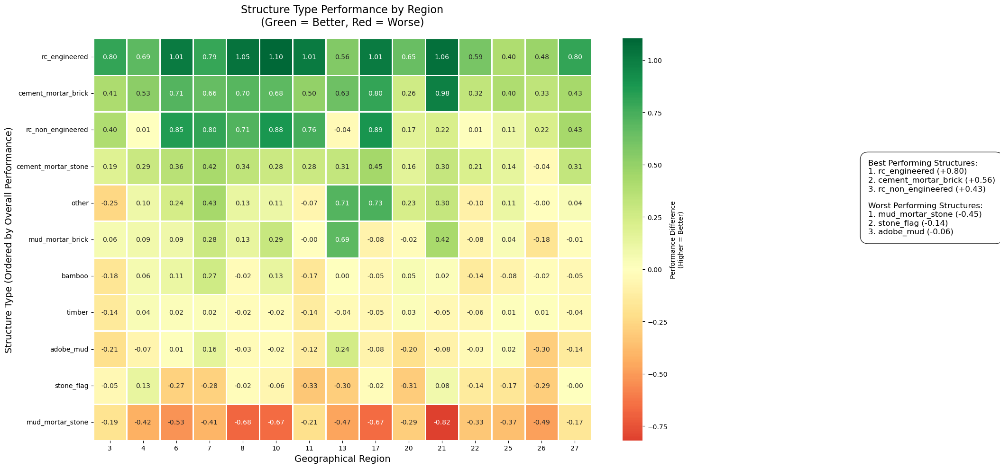

In [286]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

def plot_improved_structure_performance(df, structure_cols, geo_col='geo_level_1_id', top_n_regions=None):
    """
    Create improved visualization of structure type performance across regions
    
    Parameters:
    -----------
    df : pandas DataFrame
        DataFrame with structure types, geographical data, and damage grades
    structure_cols : list
        List of structure column names to analyze
    geo_col : str
        Column for geographical region
    top_n_regions : int
        Optional - limit to top N regions by building count
    """
    # Create cleaner structure names by removing prefix
    structure_names = {col: col.replace('has_superstructure_', '') for col in structure_cols}
    
    # Calculate average damage by structure and region
    results = []
    
    # Get regions, optionally limit to top N by building count
    if top_n_regions:
        region_counts = df[geo_col].value_counts().nlargest(top_n_regions)
        geo_regions = region_counts.index.tolist()
    else:
        geo_regions = sorted(df[geo_col].unique())
    
    # For each structure type
    for col in structure_cols:
        structure_name = structure_names[col]
        
        # For each region
        for region in geo_regions:
            # Get subset for this region
            region_df = df[df[geo_col] == region]
            
            # Calculate stats if we have data
            if len(region_df) > 0:
                has_structure = region_df[region_df[col] == 1]
                no_structure = region_df[region_df[col] == 0]
                
                # Only calculate if we have both with and without this structure
                if len(has_structure) > 0 and len(no_structure) > 0:
                    avg_with = has_structure['damage_grade'].mean()
                    avg_without = no_structure['damage_grade'].mean()
                    diff = avg_without - avg_with  # Positive means structure performed better
                    count = len(has_structure)
                    
                    results.append({
                        'Structure': structure_name,
                        'Region': region,
                        'Avg_Damage_With': avg_with,
                        'Avg_Damage_Without': avg_without,
                        'Difference': diff,
                        'Count': count
                    })
    
    # Convert to DataFrame
    results_df = pd.DataFrame(results)
    
    # Order structures by overall performance
    structure_overall_perf = results_df.groupby('Structure')['Difference'].mean().sort_values(ascending=False)
    ordered_structures = structure_overall_perf.index.tolist()
    
    # Create figure with a better size ratio
    plt.figure(figsize=(18, 10))
    
    # Pivot for the heatmap - positive difference means structure performed better
    pivot_diff = results_df.pivot(index='Structure', columns='Region', values='Difference')
    pivot_diff = pivot_diff.reindex(ordered_structures)  # Order by performance
    
    # Create a heatmap with better annotations
    ax = sns.heatmap(
        pivot_diff,
        cmap='RdYlGn',  # Red (bad) to Green (good)
        center=0,
        annot=True,
        fmt='.2f',
        linewidths=0.8,
        cbar_kws={'label': 'Performance Difference\n(Higher = Better)'}
    )
    
    # Add summary column showing the average performance across regions
    avg_performance = results_df.groupby('Structure')['Difference'].mean().reindex(ordered_structures)
    
    # Create a clear title and labels
    plt.title('Structure Type Performance by Region\n(Green = Better, Red = Worse)', fontsize=16, pad=20)
    plt.xlabel('Geographical Region', fontsize=14)
    plt.ylabel('Structure Type (Ordered by Overall Performance)', fontsize=14)
    
    # Add a summary text box with findings
    top_structures = structure_overall_perf.nlargest(3).index.tolist()
    bottom_structures = structure_overall_perf.nsmallest(3).index.tolist()
    
    summary_text = (
        f"Best Performing Structures:\n"
        f"1. {top_structures[0]} (+{structure_overall_perf[top_structures[0]]:.2f})\n"
        f"2. {top_structures[1]} (+{structure_overall_perf[top_structures[1]]:.2f})\n"
        f"3. {top_structures[2]} (+{structure_overall_perf[top_structures[2]]:.2f})\n\n"
        f"Worst Performing Structures:\n"
        f"1. {bottom_structures[0]} ({structure_overall_perf[bottom_structures[0]]:.2f})\n"
        f"2. {bottom_structures[1]} ({structure_overall_perf[bottom_structures[1]]:.2f})\n"
        f"3. {bottom_structures[2]} ({structure_overall_perf[bottom_structures[2]]:.2f})"
    )
    
    plt.figtext(1.02, 0.5, summary_text, fontsize=12, 
                bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=1'))
    
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make room for the summary box
    
    return plt

# Get all the superstructure columns
structure_cols = [col for col in training_df.columns if 'has_superstructure' in col]

# Create the improved visualization - optionally limit to top 15 regions by population
plot_improved_structure_performance(training_df, structure_cols, top_n_regions=15)
plt.savefig('improved_structure_performance.png', dpi=300, bbox_inches='tight')
plt.show()

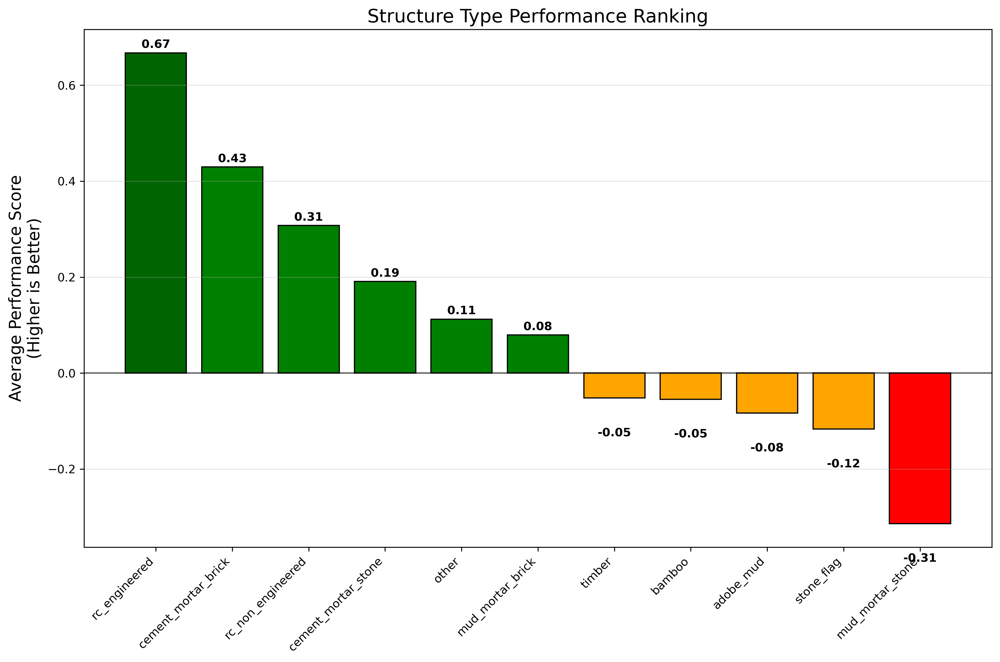

In [291]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

# First, recreate the results DataFrame if you don't already have it
def generate_results_df(df, structure_cols, geo_col='geo_level_1_id'):
    """Generate results DataFrame for structure performance analysis"""
    # Create cleaner structure names by removing prefix
    structure_names = {col: col.replace('has_superstructure_', '') for col in structure_cols}
    
    # Calculate average damage by structure and region
    results = []
    geo_regions = sorted(df[geo_col].unique())
    
    # For each structure type
    for col in structure_cols:
        structure_name = structure_names[col]
        
        # For each region
        for region in geo_regions:
            # Get subset for this region
            region_df = df[df[geo_col] == region]
            
            # Calculate stats if we have data
            if len(region_df) > 0:
                has_structure = region_df[region_df[col] == 1]
                no_structure = region_df[region_df[col] == 0]
                
                # Only calculate if we have both with and without this structure
                if len(has_structure) > 0 and len(no_structure) > 0:
                    avg_with = has_structure['damage_grade'].mean()
                    avg_without = no_structure['damage_grade'].mean()
                    diff = avg_without - avg_with  # Positive means structure performed better
                    count = len(has_structure)
                    
                    results.append({
                        'Structure': structure_name,
                        'Region': region,
                        'Avg_Damage_With': avg_with,
                        'Avg_Damage_Without': avg_without,
                        'Difference': diff,
                        'Count': count
                    })
    
    # Convert to DataFrame
    return pd.DataFrame(results)

# Now create a simpler bar chart
def plot_structure_rankings_simple(df, structure_cols):
    """Create a simpler bar chart for structure performance"""
    # First generate results if needed
    if isinstance(df, pd.DataFrame) and 'Structure' in df.columns and 'Difference' in df.columns:
        results_df = df
    else:
        results_df = generate_results_df(df, structure_cols)
    
    # Calculate average performance
    avg_perf = results_df.groupby('Structure')['Difference'].mean().sort_values(ascending=False)
    
    # Create a simple figure
    plt.figure(figsize=(12, 8))
    
    # Create color list (darker green for better performers)
    colors = ['darkgreen' if x > 0.5 else 
              'green' if x > 0.0 else 
              'orange' if x > -0.25 else 
              'red' for x in avg_perf]
    
    # Create the bar chart
    plt.bar(avg_perf.index, avg_perf, color=colors, edgecolor='black')
    
    # Add a horizontal line at y=0
    plt.axhline(y=0, color='black', linestyle='-', alpha=0.5)
    
    # Labels
    plt.title('Structure Type Performance Ranking', fontsize=16)
    plt.ylabel('Average Performance Score\n(Higher is Better)', fontsize=14)
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', alpha=0.3)
    
    # Add values as text on bars
    for i, v in enumerate(avg_perf):
        plt.text(i, v + 0.01 if v >= 0 else v - 0.08, 
                f'{v:.2f}', 
                ha='center', fontweight='bold')
    
    plt.tight_layout()
    plt.savefig('structure_performance_ranking.png', dpi=300, bbox_inches='tight')
    plt.close()  # Close the figure to ensure it saves properly
    
    # Display the saved image
    from IPython.display import Image
    return Image(filename='structure_performance_ranking.png')

# Get structure columns
structure_cols = [col for col in training_df.columns if 'has_superstructure' in col]

# Create the plot
plot_structure_rankings_simple(training_df, structure_cols)

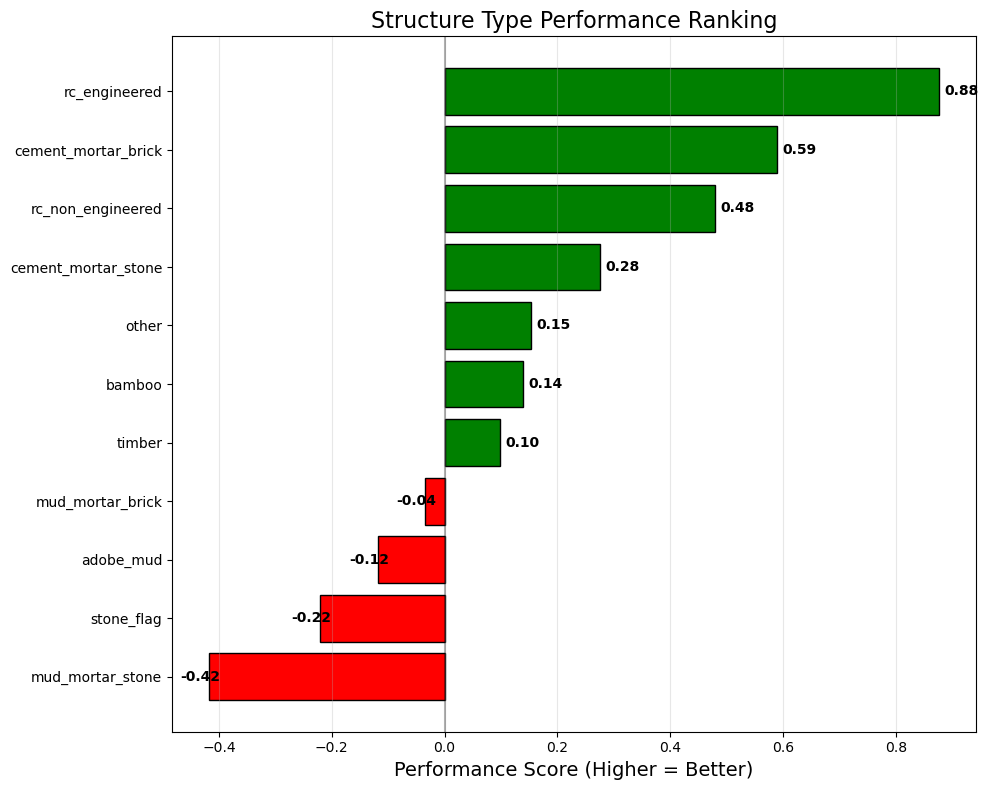


Structure Performance Results:
              Structure  Performance_Score
1      mud_mortar_stone          -0.418494
2            stone_flag          -0.221900
0             adobe_mud          -0.119064
4      mud_mortar_brick          -0.035349
6                timber           0.098052
7                bamboo           0.138312
10                other           0.152205
3   cement_mortar_stone           0.275707
8     rc_non_engineered           0.479150
5   cement_mortar_brick           0.589335
9         rc_engineered           0.876662


In [296]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Function to create a horizontal bar chart of structure performance
def create_simple_structure_ranking(df, structure_cols):
    """Create a simple horizontal bar chart of structure performance rankings"""
    # Create structure names by removing prefix
    structure_names = {col: col.replace('has_superstructure_', '') for col in structure_cols}
    
    # Calculate structure performance
    results = []
    for col in structure_cols:
        has_struct = df[df[col] == 1]['damage_grade'].mean()
        no_struct = df[df[col] == 0]['damage_grade'].mean()
        diff = no_struct - has_struct  # Positive means better performance
        
        results.append({
            'Structure': structure_names[col],
            'Performance_Score': diff
        })
    
    # Convert to DataFrame and sort
    results_df = pd.DataFrame(results)
    results_df = results_df.sort_values('Performance_Score', ascending=True)  # For horizontal bars
    
    # Create the plot - super simple
    plt.figure(figsize=(10, 8))
    
    # Create a colormap based on scores
    colors = ['red' if x < 0 else 'green' for x in results_df['Performance_Score']]
    
    # Create horizontal bars
    plt.barh(results_df['Structure'], results_df['Performance_Score'], color=colors, edgecolor='black')
    
    # Add vertical line at x=0
    plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)
    
    # Add value labels
    for i, v in enumerate(results_df['Performance_Score']):
        plt.text(v + (0.01 if v >= 0 else -0.05), 
                i, 
                f"{v:.2f}", 
                va='center',
                fontweight='bold')
    
    # Add titles and labels
    plt.title('Structure Type Performance Ranking', fontsize=16)
    plt.xlabel('Performance Score (Higher = Better)', fontsize=14)
    plt.grid(axis='x', alpha=0.3)
    
    # Save the figure
    plt.tight_layout()
    plt.savefig('structure_ranking.png', dpi=300, bbox_inches='tight')
    
    # Display the plot
    plt.show()
    
    return results_df  # Return the dataframe for further analysis if needed

# Run the function with your data
structure_cols = [col for col in training_df.columns if 'has_superstructure' in col]
results = create_simple_structure_ranking(training_df, structure_cols)

# Print the results table for additional reference
print("\nStructure Performance Results:")
print(results)

In [312]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Get structure columns
structure_cols = [col for col in training_df.columns if 'has_superstructure' in col]

# Create structure names by removing prefix
structure_names = {col: col.replace('has_superstructure_', '') for col in structure_cols}

In [313]:
# Calculate statistics for each structure type
results = []
for col in structure_cols:
    # Calculate performance (difference in damage grade)
    has_struct = training_df[training_df[col] == 1]['damage_grade'].mean()
    no_struct = training_df[training_df[col] == 0]['damage_grade'].mean()
    diff = no_struct - has_struct  # Positive means better performance
    
    # Calculate prevalence (% of buildings with this structure)
    prevalence = training_df[col].mean() * 100  # As percentage
    
    # Calculate absolute count
    count = training_df[col].sum()
    
    results.append({
        'Structure': structure_names[col],
        'Performance': diff,
        'Prevalence_Pct': prevalence,
        'Count': count
    })

# Convert to DataFrame
results_df = pd.DataFrame(results)

# Print the results to verify
print(results_df)

              Structure  Performance  Prevalence_Pct   Count
0             adobe_mud    -0.119064        8.864509   23101
1      mud_mortar_stone    -0.418494       76.193491  198561
2            stone_flag    -0.221900        3.433218    8947
3   cement_mortar_stone     0.275707        1.823477    4752
4      mud_mortar_brick    -0.035349        6.815400   17761
5   cement_mortar_brick     0.589335        7.526832   19615
6                timber     0.098052       25.498751   66450
7                bamboo     0.138312        8.501119   22154
8     rc_non_engineered     0.479150        4.259001   11099
9         rc_engineered     0.876662        1.585949    4133
10                other     0.152205        1.498459    3905


In [314]:
# Create figure
plt.figure(figsize=(12, 8))

# Use performance for color coding
colors = ['green' if x > 0 else 'red' for x in results_df['Performance']]

# Create scatter plot with sized markers based on count
plt.scatter(results_df['Prevalence_Pct'], results_df['Performance'], 
          s=results_df['Count']/1000,  # Scale size for visibility
          color=colors, alpha=0.7, edgecolor='black')

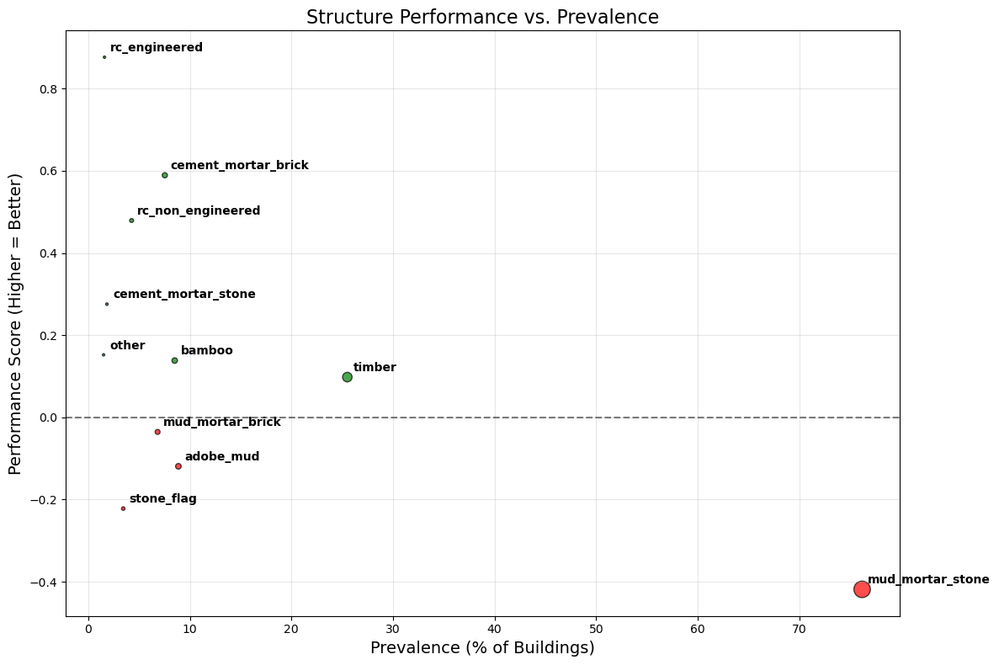

In [315]:
# Add structure name labels
for i, row in results_df.iterrows():
    plt.annotate(row['Structure'], 
               xy=(row['Prevalence_Pct'], row['Performance']),
               xytext=(5, 5), textcoords='offset points',
               fontsize=10, fontweight='bold')

# Add horizontal line at Performance = 0
plt.axhline(y=0, color='black', linestyle='--', alpha=0.5)

# Add titles and labels
plt.title('Structure Performance vs. Prevalence', fontsize=16)
plt.xlabel('Prevalence (% of Buildings)', fontsize=14)
plt.ylabel('Performance Score (Higher = Better)', fontsize=14)
plt.grid(alpha=0.3)

# Show plot
plt.tight_layout()
plt.show()

In [316]:
# Save the figure
plt.savefig('performance_vs_prevalence.png', dpi=300, bbox_inches='tight')

In [317]:
def plot_regional_performance(results_df):
    """Create a chart showing overall structural performance by region"""
    # Calculate average performance by region
    region_performance = results_df.groupby('Region')['Difference'].mean().sort_values(ascending=False)
    
    # Create figure
    plt.figure(figsize=(14, 8))
    
    # Set color based on performance (positive = good, negative = bad)
    colors = ['green' if x > 0 else 'red' for x in region_performance]
    
    # Plot bars
    bars = plt.bar(region_performance.index.astype(str), region_performance, color=colors, alpha=0.7, edgecolor='black')
    
    # Add a horizontal line at y=0
    plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
    
    # Add value labels on the bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., 
                height + (0.01 if height >= 0 else -0.05),
                f'{height:.2f}', 
                ha='center', va='bottom' if height >= 0 else 'top',
                fontweight='bold')
    
    # Add labels and title
    plt.title('Regional Variation in Structural Performance', fontsize=16)
    plt.ylabel('Average Performance Score\n(Positive = Better, Negative = Worse)', fontsize=14)
    plt.xlabel('Geographical Region', fontsize=14)
    plt.grid(axis='y', alpha=0.3)
    
    # Annotate best and worst regions
    best_region = region_performance.idxmax()
    worst_region = region_performance.idxmin()
    
    plt.annotate(f'Best Region: {best_region}', xy=(str(best_region), region_performance[best_region]), 
                xytext=(str(best_region), region_performance[best_region] + 0.05),
                ha='center', va='bottom', fontsize=12,
                arrowprops=dict(arrowstyle='->', lw=1.5))
    
    plt.annotate(f'Worst Region: {worst_region}', xy=(str(worst_region), region_performance[worst_region]), 
                xytext=(str(worst_region), region_performance[worst_region] - 0.05),
                ha='center', va='top', fontsize=12,
                arrowprops=dict(arrowstyle='->', lw=1.5))
    
    plt.tight_layout()
    return plt

In [319]:
# Function to generate results if not already done
def generate_results_df(df, structure_cols, geo_col='geo_level_1_id'):
    """Generate results DataFrame for structure performance analysis"""
    # Create cleaner structure names by removing prefix
    structure_names = {col: col.replace('has_superstructure_', '') for col in structure_cols}
    
    # Calculate average damage by structure and region
    results = []
    geo_regions = sorted(df[geo_col].unique())
    
    # For each structure type
    for col in structure_cols:
        structure_name = structure_names[col]
        
        # For each region
        for region in geo_regions:
            # Get subset for this region
            region_df = df[df[geo_col] == region]
            
            # Calculate stats if we have data
            if len(region_df) > 0:
                has_structure = region_df[region_df[col] == 1]
                no_structure = region_df[region_df[col] == 0]
                
                # Only calculate if we have both with and without this structure
                if len(has_structure) > 0 and len(no_structure) > 0:
                    avg_with = has_structure['damage_grade'].mean()
                    avg_without = no_structure['damage_grade'].mean()
                    diff = avg_without - avg_with  # Positive means structure performed better
                    count = len(has_structure)
                    
                    results.append({
                        'Structure': structure_name,
                        'Region': region,
                        'Avg_Damage_With': avg_with,
                        'Avg_Damage_Without': avg_without,
                        'Difference': diff,
                        'Count': count
                    })
    
    # Convert to DataFrame
    return pd.DataFrame(results)

# Get all structure columns
structure_cols = [col for col in training_df.columns if 'has_superstructure' in col]

# Generate results
results_df = generate_results_df(training_df, structure_cols)

In [320]:
# Set up the figure
fig = plt.figure(figsize=(20, 16))

# Create a grid for the subplots
gs = fig.add_gridspec(2, 2)

# Create axes for each plot
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, 0])
ax4 = fig.add_subplot(gs[1, 1])

In [321]:
# Calculate average performance by structure
struct_perf = results_df.groupby('Structure')['Difference'].mean().sort_values(ascending=False)

# Create bar colors based on performance
colors = ['green' if x > 0 else 'red' for x in struct_perf]

# Create the bar chart on ax1
ax1.bar(struct_perf.index, struct_perf, color=colors, edgecolor='black')
ax1.axhline(y=0, color='black', linestyle='--', alpha=0.5)
ax1.set_title('Structure Type Performance Ranking', fontsize=14)
ax1.set_ylabel('Performance Score', fontsize=12)
ax1.set_xticklabels(struct_perf.index, rotation=45, ha='right')
ax1.grid(axis='y', alpha=0.3)

# Add values on bars
for i, v in enumerate(struct_perf):
    ax1.text(i, v + 0.02 if v >= 0 else v - 0.08, 
            f'{v:.2f}', 
            ha='center', fontweight='bold', fontsize=10)

/var/folders/m7/tzk7gpbd05j79z_hsb25z6jm0000gn/T/ipykernel_23921/1606441222.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(struct_perf.index, rotation=45, ha='right')


In [322]:
# Calculate average performance by region
region_perf = results_df.groupby('Region')['Difference'].mean().sort_values(ascending=False)

# Create bar colors based on performance
region_colors = ['green' if x > 0 else 'red' for x in region_perf]

# Create the bar chart on ax2
ax2.bar(region_perf.index.astype(str), region_perf, color=region_colors, edgecolor='black')
ax2.axhline(y=0, color='black', linestyle='--', alpha=0.5)
ax2.set_title('Regional Variation in Performance', fontsize=14)
ax2.set_ylabel('Average Performance Score', fontsize=12)
ax2.set_xlabel('Geographical Region', fontsize=12)
ax2.grid(axis='y', alpha=0.3)

# Add values on bars
for i, v in enumerate(region_perf):
    ax2.text(i, v + 0.02 if v >= 0 else v - 0.08, 
            f'{v:.2f}', 
            ha='center', fontweight='bold', fontsize=9)

In [323]:
# Calculate structure prevalence
structure_stats = results_df.groupby('Structure').agg({
    'Difference': 'mean',
    'Count': 'sum'
})

# Calculate prevalence percentage
total_buildings = results_df['Count'].sum()
structure_stats['Prevalence_Pct'] = structure_stats['Count'] / total_buildings * 100

# Set colors based on performance
scatter_colors = ['green' if x > 0 else 'red' for x in structure_stats['Difference']]

# Create scatter plot on ax3
scatter = ax3.scatter(structure_stats['Prevalence_Pct'], structure_stats['Difference'], 
                    s=structure_stats['Count']/1000,  # Scale size for visibility
                    color=scatter_colors, alpha=0.7, edgecolor='black')

# Add structure labels
for i, row in structure_stats.reset_index().iterrows():
    ax3.annotate(row['Structure'], 
               xy=(row['Prevalence_Pct'], row['Difference']),
               xytext=(5, 0), textcoords='offset points',
               fontsize=10)

# Add horizontal line at y=0
ax3.axhline(y=0, color='black', linestyle='--', alpha=0.5)

# Add labels and title
ax3.set_title('Structure Performance vs. Prevalence', fontsize=14)
ax3.set_xlabel('Prevalence (% of Buildings)', fontsize=12)
ax3.set_ylabel('Performance Score', fontsize=12)
ax3.grid(alpha=0.3)

In [324]:
# Get the best performing structure for each region
best_structures = results_df.loc[results_df.groupby('Region')['Difference'].idxmax()]
best_structures = best_structures.sort_values('Difference', ascending=False)

# Create a categorical color map for structure types
structures = best_structures['Structure'].unique()
color_map = dict(zip(structures, plt.cm.tab10.colors[:len(structures)]))
bar_colors = [color_map[s] for s in best_structures['Structure']]

# Create bar chart on ax4
ax4.bar(best_structures['Region'].astype(str), best_structures['Difference'], 
      color=bar_colors, edgecolor='black')

# Add structure name labels on bars
for i, (region, struct, perf) in enumerate(zip(best_structures['Region'], 
                                             best_structures['Structure'], 
                                             best_structures['Difference'])):
    ax4.text(i, perf/2, struct, ha='center', fontsize=9, 
           rotation=90 if len(struct) > 10 else 0,
           color='white' if perf > 0.4 else 'black')

# Add title and labels
ax4.set_title('Best Performing Structure by Region', fontsize=14)
ax4.set_xlabel('Geographical Region', fontsize=12)
ax4.set_ylabel('Performance Score', fontsize=12)
ax4.grid(axis='y', alpha=0.3)

# Create a legend for structure types
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor=color_map[s], edgecolor='black',
                      label=s) for s in color_map.keys()]
ax4.legend(handles=legend_elements, title='Structure Types', 
         loc='upper right', fontsize=8)

In [325]:
# Add a title for the dashboard
fig.suptitle('Earthquake Structure Performance Analysis Dashboard', fontsize=20, y=0.98)

# Add a text box with key recommendations
recommendations = (
    "Key Recommendations:\n\n"
    "1. Prioritize RC engineered structures, especially in high-risk regions\n"
    "2. Avoid mud mortar stone construction which consistently performs poorly\n"
    "3. Consider cement mortar brick as a cost-effective alternative\n"
    "4. Focus retrofitting efforts on regions with poor overall performance\n"
    "5. Develop region-specific building codes based on performance patterns"
)

fig.text(0.5, 0.02, recommendations, ha='center', va='bottom', 
       fontsize=12, bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=1'))

Text(0.5, 0.02, 'Key Recommendations:\n\n1. Prioritize RC engineered structures, especially in high-risk regions\n2. Avoid mud mortar stone construction which consistently performs poorly\n3. Consider cement mortar brick as a cost-effective alternative\n4. Focus retrofitting efforts on regions with poor overall performance\n5. Develop region-specific building codes based on performance patterns')

In [330]:
plt.tight_layout(rect=[0, 0.05, 1, 0.95])  # Adjust to make room for title and recommendations
plt.savefig('structure_performance_dashboard.png', dpi=300, bbox_inches='tight')
plt.show()


<Figure size 640x480 with 0 Axes>

# Geo Weights
## * Going to try using 'per_feature_penalties=' on 'geo_level_' features but kept getting errors; tried monotone_constraints and I got the same results
## * Geo level features are not significant, the concern is around structure type, foundation types, etc.
## * So i'm going to create a reduced_features variable without the geo_level columns and run the constraint_model minus those features

In [190]:
features_to_exclude = ['geo_level_1_id', 'geo_level_1_id_cluster', 'geo_level_2_id', 'geo_level_2_id_cluster', 'geo_level_3_id', 'geo_level_3_id_cluster']
reduced_features = [col for col in X_train.columns if col not in features_to_exclude]
reduced_cat_features = [i for i, col in enumerate(reduced_features) if col in cat_features]

In [191]:
num_features = X_train.select_dtypes(include=['int64', 'float64']).columns.tolist()
cat_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()

In [192]:
constrained_model = CatBoostClassifier(
    learning_rate=0.05,
    l2_leaf_reg=3,
    iterations=500,
    grow_policy='SymmetricTree',
    depth=6,
    random_seed=42,
    cat_features=reduced_cat_features,
)

constrained_model.fit(X_train[reduced_features], y_train)

constrained_y_train_pred = constrained_model.predict(X_train[reduced_features])
constrained_y_test_pred = constrained_model.predict(X_test[reduced_features])

constrained_train_accuracy = accuracy_score(y_train, constrained_y_train_pred)
constrained_test_accuracy = accuracy_score(y_test, constrained_y_test_pred)

print(f"Constrained Training Accuracy: {constrained_train_accuracy:.4f}")
print(f"Constrained Test Accuracy: {constrained_test_accuracy:.4f}")

0:	learn: 1.0769212	total: 814ms	remaining: 6m 46s
1:	learn: 1.0570181	total: 1.6s	remaining: 6m 38s
2:	learn: 1.0385382	total: 1.98s	remaining: 5m 28s
3:	learn: 1.0215868	total: 2.32s	remaining: 4m 47s
4:	learn: 1.0062059	total: 2.67s	remaining: 4m 24s
5:	learn: 0.9921361	total: 2.96s	remaining: 4m 3s
6:	learn: 0.9786137	total: 3.29s	remaining: 3m 51s
7:	learn: 0.9661241	total: 3.62s	remaining: 3m 42s
8:	learn: 0.9548566	total: 3.95s	remaining: 3m 35s
9:	learn: 0.9443684	total: 4.26s	remaining: 3m 28s
10:	learn: 0.9346666	total: 4.55s	remaining: 3m 22s
11:	learn: 0.9255254	total: 4.87s	remaining: 3m 18s
12:	learn: 0.9169865	total: 5.21s	remaining: 3m 15s
13:	learn: 0.9090433	total: 5.58s	remaining: 3m 13s
14:	learn: 0.9021059	total: 5.94s	remaining: 3m 11s
15:	learn: 0.8950796	total: 6.26s	remaining: 3m 9s
16:	learn: 0.8885986	total: 6.55s	remaining: 3m 6s
17:	learn: 0.8825637	total: 6.83s	remaining: 3m 2s
18:	learn: 0.8768934	total: 7.15s	remaining: 3m
19:	learn: 0.8717798	total: 7.4

learning_rate=0.03,
    l2_leaf_reg= 3,
    iterations= 500,
    grow_policy= 'SymmetricTree',
    depth=8,
    loss_function='MultiClass',
    random_seed=42,
    cat_features=cat_features

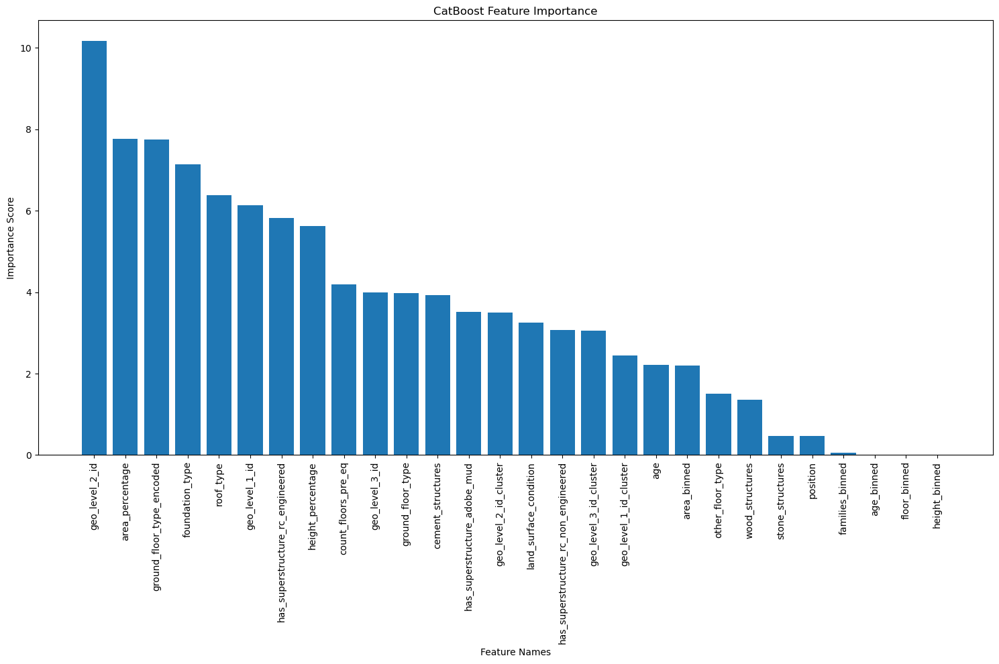

In [193]:
cat_feature_importances = constrained_model.get_feature_importance()
feature_names_out = []

original_feature_names = list(X_train.columns)
feature_names_out = original_feature_names

cat_indices = np.argsort(cat_feature_importances)[::-1]

plt.figure(figsize=(15, 10))
plt.title("CatBoost Feature Importance")
plt.bar(range(len(cat_feature_importances)), cat_feature_importances[cat_indices], align="center")

if len(feature_names_out) == len(cat_feature_importances):
    plt.xticks(range(len(cat_feature_importances)), [feature_names_out[i] for i in cat_indices], rotation=90)
else:
    plt.xticks(range(len(cat_feature_importances)), range(len(cat_feature_importances)), rotation=90)

plt.xticks(range(len(cat_feature_importances)), [feature_names_out[i] for i in cat_indices], rotation=90)
plt.xlabel("Feature Names")
plt.ylabel("Importance Score")
plt.tight_layout()
plt.show()

Constraining the geo level features really hurt the model's ability to predict accurately. This may not be the worst thing given that my goal is to predict the level of damage a building suffered, regardless of the geographical region. Will revisit in a bit.